# کتابخانه ها

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.cluster import KMeans, AffinityPropagation, MeanShift, SpectralClustering, AgglomerativeClustering, DBSCAN, OPTICS, Birch
from sklearn.mixture import GaussianMixture
# from kneed import KneeLocator


## دیتاست

In [2]:
data = pd.read_csv('Customer_Data.csv')

In [3]:
data

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


## ساخت دیتافریم

In [4]:
df = pd.DataFrame(data)
df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


## بررسی داده های ورودی و بررسی کلی دیتاست مورد نظر

In [5]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


## بررسی دیتاست ویافتم میسینگ ولیو(تعداد و موقعیت در دیتاست)

In [6]:
df.isna().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

## حذف میسینگ ولیو های موجود در دیتاست

In [7]:
df2 = df.dropna()

In [8]:
df2

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
5,C10006,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8943,C19184,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


## بررسی دیتاست برای مطمئن شدن از حف دیتا ست

In [9]:
df2.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000
mean,1601.224893,0.895035,1025.433874,604.901438,420.843533,994.175523,0.496000,0.205909,0.368820,0.137604,3.313918,15.033233,4522.091030,1784.478099,864.304943,0.159304,11.534391
std,2095.571300,0.207697,2167.107984,1684.307803,917.245182,2121.458303,0.401273,0.300054,0.398093,0.201791,6.912506,25.180468,3659.240379,2909.810090,2372.566350,0.296271,1.310984
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.049513,0.019163,0.000000,6.000000
25%,148.095189,0.909091,43.367500,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,418.559237,169.163545,0.000000,12.000000
50%,916.855459,1.000000,375.405000,44.995000,94.785000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,896.675701,312.452292,0.000000,12.000000
75%,2105.195853,1.000000,1145.980000,599.100000,484.147500,1132.385490,0.916667,0.333333,0.750000,0.250000,4.000000,18.000000,6500.000000,1951.142090,825.496463,0.166667,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [10]:
df2.isna().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

## بررسی فیچرها باهم(یه فیچر که از همه مهم تر است رو عنوان ایکس در نظر گرفتم و بقیه رو با آن  به صورت پلات ترسیم کردم)

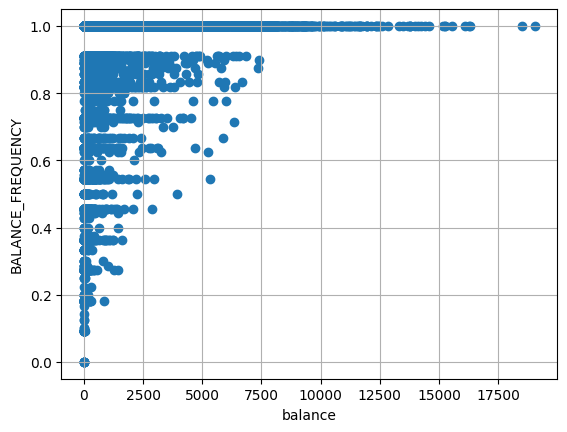

In [11]:
plt.scatter(df2['BALANCE'], df2['BALANCE_FREQUENCY'])
plt.xlabel('balance')
plt.ylabel('BALANCE_FREQUENCY')
plt.grid()
plt.show()

دفعات تعادل خرید از پایین به بالا افزایش داشته همچنین تعادل خرید هم از پایین به بالا افزایش داشته

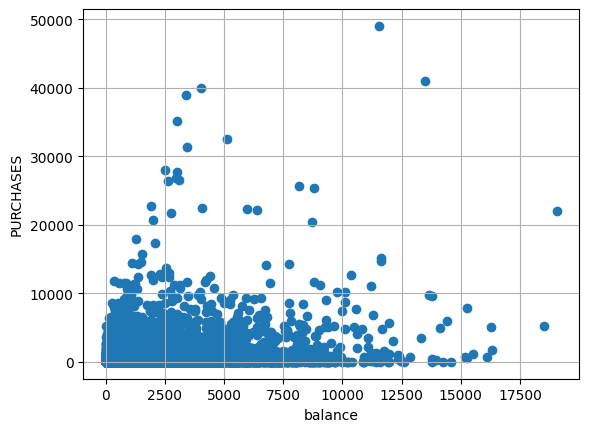

In [12]:
plt.scatter(df2['BALANCE'], df2['PURCHASES'])
plt.xlabel('balance')
plt.ylabel('PURCHASES')
plt.grid()
plt.show()

خرید ها در بازه صفر تا ده هزار تراکم بالایی دارد و از ده هزار با بالا کمتر شده همچنین تعادل خرید از چپ به راست کاهش داشته

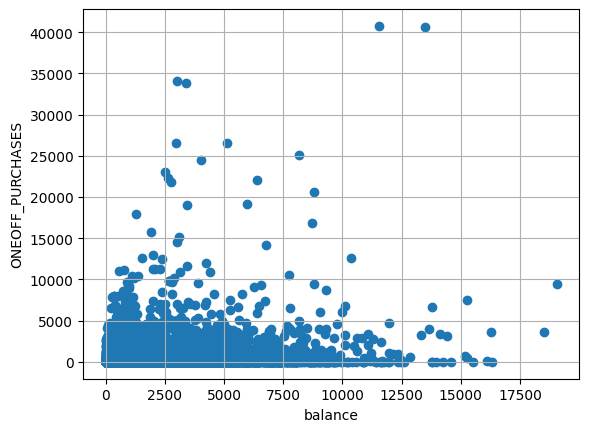

In [13]:
plt.scatter(df2['BALANCE'], df2['ONEOFF_PURCHASES'])
plt.xlabel('balance')
plt.ylabel('ONEOFF_PURCHASES')
plt.grid()
plt.show()

خرید های یکباره از صفر تا پنج هزار تراک بالایی داشته و از بالای پنج هزار از تراکم خرید یکباره کاشته شده همچنین تعادل خرید از چپ به راست از ترامش کاسته شده بیشتریت تذاکم برای صفر تا شش هزار در خرید تعادلی داشته ایم و از شش هزار به بعد کاهش را در خرید تعادلی شاهد هستیم

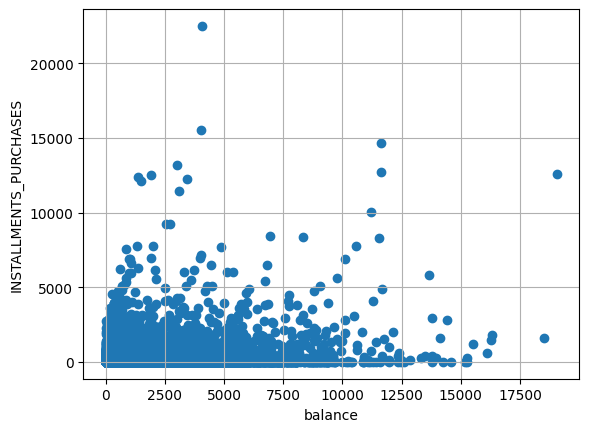

In [14]:
plt.scatter(df2['BALANCE'], df2['INSTALLMENTS_PURCHASES'])
plt.xlabel('balance')
plt.ylabel('INSTALLMENTS_PURCHASES')
plt.grid()
plt.show()

خرید اقساطی بیشتریت تراکم را از صفر تا پنج هزار نشان میدهد و بالای پنج هزار تراکم به شدت کم میشود 

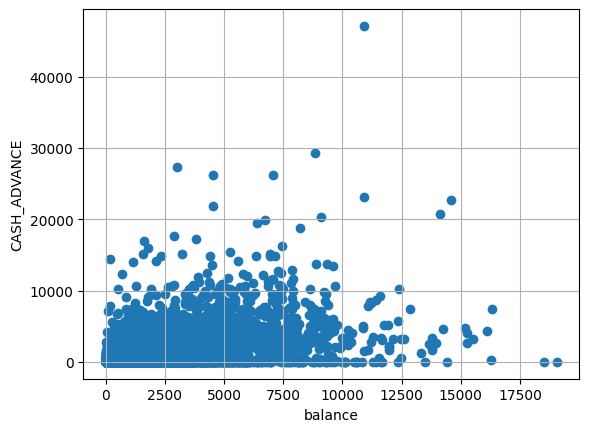

In [15]:
plt.scatter(df2['BALANCE'], df2['CASH_ADVANCE'])
plt.xlabel('balance')
plt.ylabel('CASH_ADVANCE')
plt.grid()
plt.show()

پیش پرداخت نقدی از نصفر تا ده هزار  تراکم بالایی دارد داشتهو از ده هزار شاهد تراکم خیلی کم هستیم

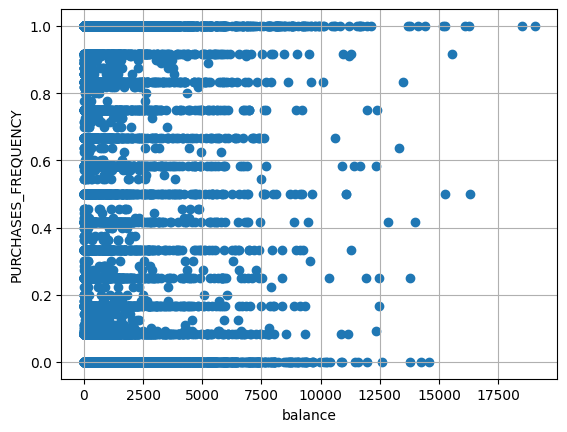

In [16]:
plt.scatter(df2['BALANCE'], df2['PURCHASES_FREQUENCY'])
plt.xlabel('balance')
plt.ylabel('PURCHASES_FREQUENCY')
plt.grid()
plt.show()

دفعات خرید از چپ به راست کمتر شده

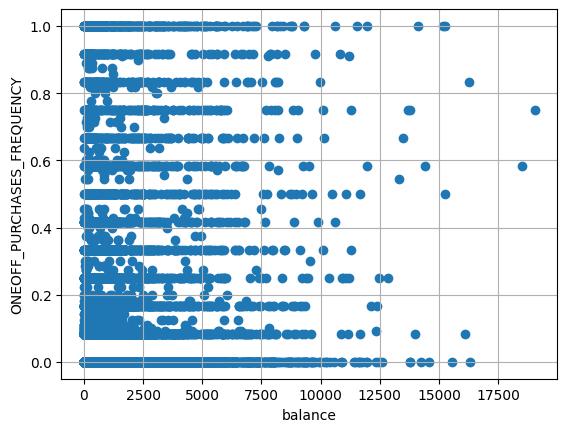

In [17]:
plt.scatter(df2['BALANCE'], df2['ONEOFF_PURCHASES_FREQUENCY'])
plt.xlabel('balance')
plt.ylabel('ONEOFF_PURCHASES_FREQUENCY')
plt.grid()
plt.show()

دفعات خرید یکباره هم از چپ به راست کاهش داشته است

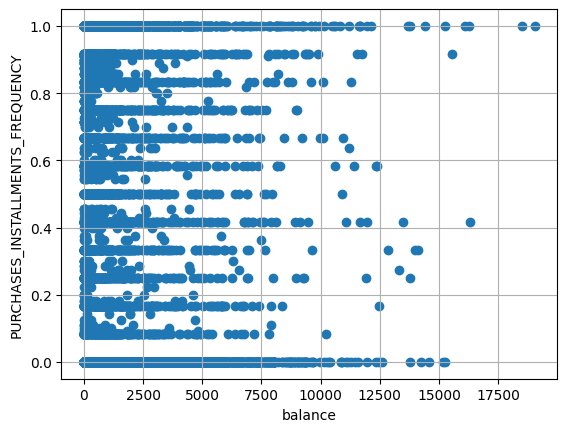

In [18]:
plt.scatter(df2['BALANCE'], df2['PURCHASES_INSTALLMENTS_FREQUENCY'])
plt.xlabel('balance')
plt.ylabel('PURCHASES_INSTALLMENTS_FREQUENCY')
plt.grid()
plt.show()

دفعات خرید یکباره هم از چپ به راست کاهش داشته است

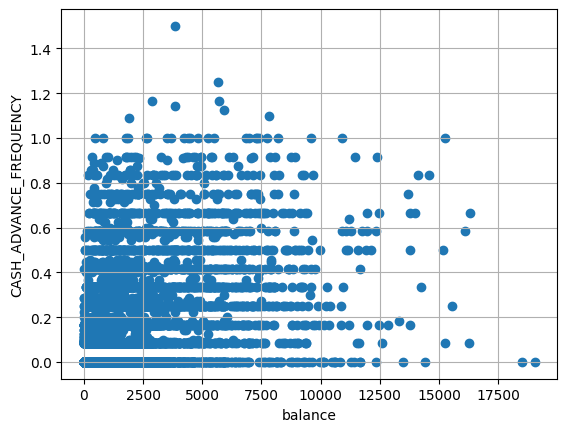

In [19]:
plt.scatter(df2['BALANCE'], df2['CASH_ADVANCE_FREQUENCY'])
plt.xlabel('balance')
plt.ylabel('CASH_ADVANCE_FREQUENCY')
plt.grid()
plt.show()

تعداد پیش پرداخت نقدی تا حدود یک پراگندگی زیادی داشته و ار یک به بعد از تراکم ان کاسته شده

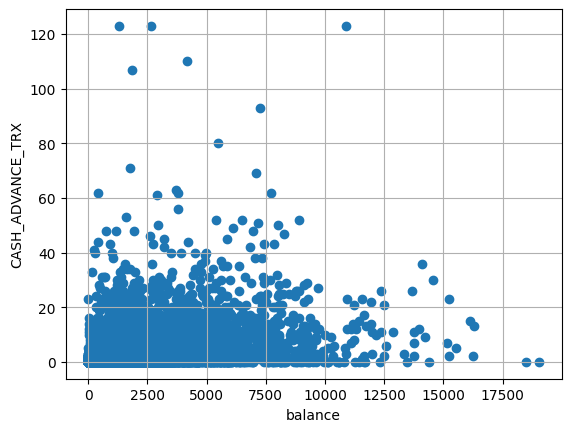

In [20]:
plt.scatter(df2['BALANCE'], df2['CASH_ADVANCE_TRX'])
plt.xlabel('balance')
plt.ylabel('CASH_ADVANCE_TRX')
plt.grid()
plt.show()

پیش پرداخت ارز دیجیتال ترون از صفر تا بیست تراکم بالایی دارد و از بیست بالاتر تراکمش کم شده

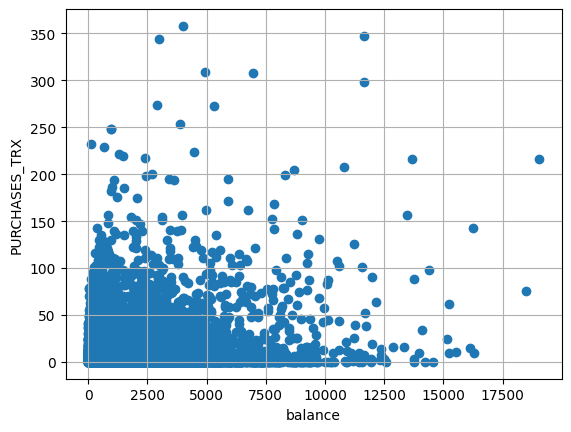

In [21]:
plt.scatter(df2['BALANCE'], df2['PURCHASES_TRX'])
plt.xlabel('balance')
plt.ylabel('PURCHASES_TRX')
plt.grid()
plt.show()

خرید ارز دیجیتال صفر تا صد تراکم بالایی دارد و از چپ به راست از تراکمش کم میشود


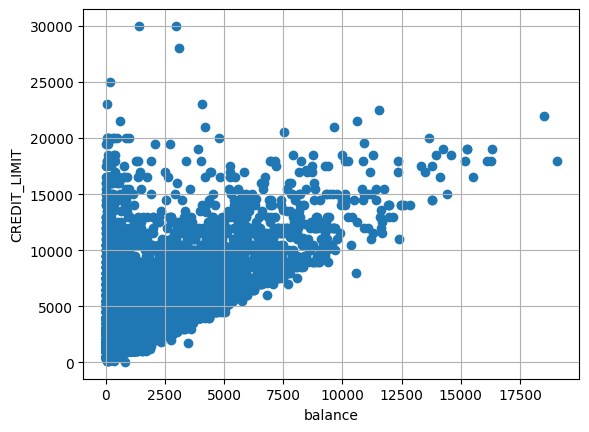

In [22]:
plt.scatter(df2['BALANCE'], df2['CREDIT_LIMIT'])
plt.xlabel('balance')
plt.ylabel('CREDIT_LIMIT')
plt.grid()
plt.show()

محدودیت اعتبار ار صفر تا ده هزار تراک بالای دارد و از چپ به رایت با افزایش تعادل خرید از تراکم ان کم میشود

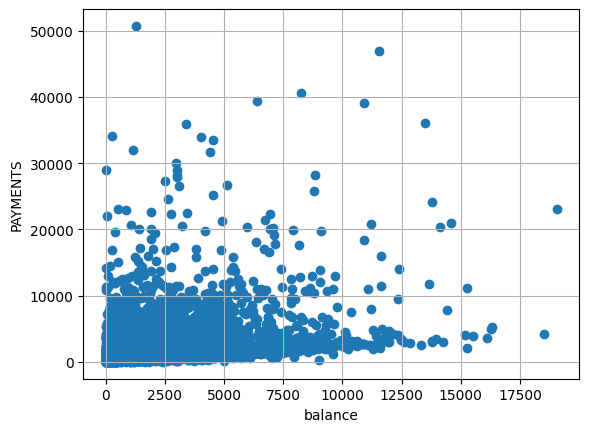

In [23]:
plt.scatter(df2['BALANCE'], df2['PAYMENTS'])
plt.xlabel('balance')
plt.ylabel('PAYMENTS')
plt.grid()
plt.show()

مبلغ پرداختی از صفر تا ده هزار تراکم بالای را شاهدیم و از چپ به راست از تراک ان کم میشود

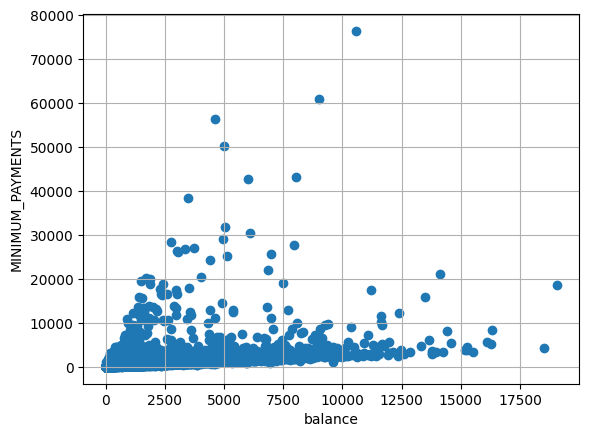

In [24]:
plt.scatter(df2['BALANCE'], df2['MINIMUM_PAYMENTS'])
plt.xlabel('balance')
plt.ylabel('MINIMUM_PAYMENTS')
plt.grid()
plt.show()

حداقل پرداختی در بازه صفر تا ده هزار تراکم خوبی دارد و بالاتر کم شده

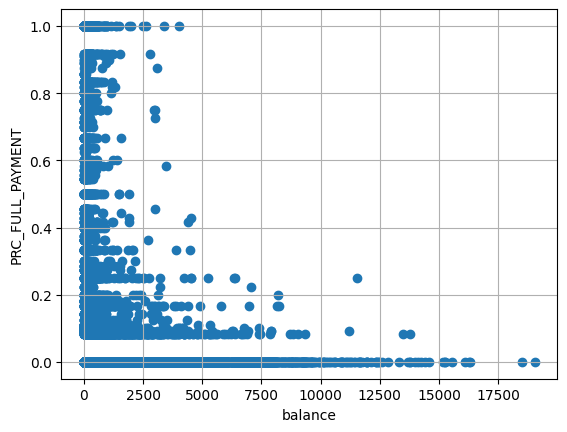

In [25]:
plt.scatter(df2['BALANCE'], df2['PRC_FULL_PAYMENT'])
plt.xlabel('balance')
plt.ylabel('PRC_FULL_PAYMENT')
plt.grid()
plt.show()

پرداخت کامل کمیسیون از پایین به بالا کم شده

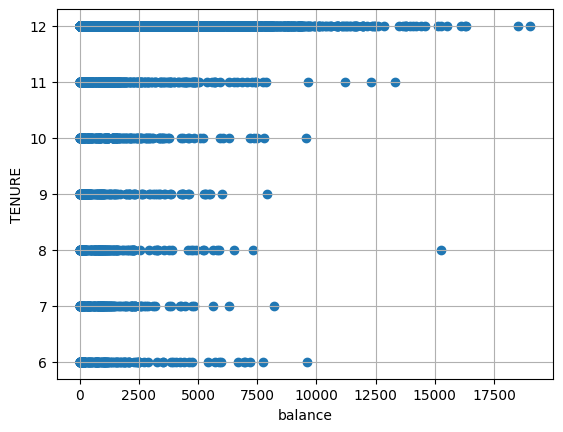

In [26]:
plt.scatter(df2['BALANCE'], df2['TENURE'])
plt.xlabel('balance')
plt.ylabel('TENURE')
plt.grid()
plt.show()

روش خوشه ای از پایین به بالا زیاد میشود در دوازده بیشترین مقدار و هشت کمتر مقدار را داراست

## حذف ستون ای دی

In [27]:
df3 = df2.drop('CUST_ID', axis=1)

In [28]:
df3

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
5,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8943,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


##  نرمال کردن اعداد دیتاست

In [29]:
scaler = preprocessing.StandardScaler()
scaled = scaler.fit_transform(df3)
df4 = pd.DataFrame(scaled, columns=['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY	', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'])

In [30]:
X = pd.DataFrame(df4, columns=['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY	', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'])

## ساخت مقدار تست و ترین

In [31]:
X_train, X_test = train_test_split(X, random_state=0, test_size=.2)

In [32]:
X_train

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY\t,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
3448,-0.169549,0.505405,2.225729,1.922817,1.727421,-0.468655,1.256077,2.646651,1.585600,-0.681953,-0.479437,2.302186,0.130611,1.047933,-0.249669,-0.537727,0.355181
5717,0.650054,0.505405,-0.225873,-0.040928,-0.458839,-0.450293,0.633023,1.813419,-0.926522,-0.268963,-0.334763,-0.199898,0.130611,-0.393895,0.068967,-0.537727,0.355181
5722,5.810758,0.505405,-0.473208,-0.359160,-0.458839,0.321059,-1.236139,-0.686280,-0.926522,2.621982,1.111974,-0.597054,2.726928,0.436606,1.002418,-0.537727,0.355181
5118,-0.762910,-3.871857,-0.440905,-0.317598,-0.458839,-0.468655,-1.028455,-0.408536,-0.926522,-0.681953,-0.479437,-0.557339,-0.689279,-0.477049,-0.328453,-0.537727,0.355181
8090,-0.753087,0.505405,-0.300156,-0.359160,-0.049982,-0.468655,1.256077,-0.686280,1.585600,-0.681953,-0.479437,-0.120467,-0.552631,-0.479359,-0.288929,2.556468,0.355181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4373,1.264734,0.505405,-0.473208,-0.359160,-0.458839,0.624508,-1.236139,-0.686280,-0.926522,-0.268963,-0.334763,-0.597054,0.130611,-0.122340,0.193187,-0.537727,0.355181
7891,-0.515951,-0.807773,-0.473208,-0.359160,-0.458839,0.572901,-1.236139,-0.686280,-0.926522,0.970012,2.703385,-0.597054,-0.689279,0.509348,-0.285546,0.426696,0.355181
4859,-0.753225,-0.297095,-0.394297,-0.359160,-0.272400,-0.468655,0.840707,-0.686280,0.329539,-0.681953,-0.479437,-0.319045,-0.825927,-0.560880,-0.328208,2.837758,-4.221800
3264,1.032937,0.505405,-0.473208,-0.359160,-0.458839,0.332915,-1.236139,-0.686280,-0.926522,1.570726,0.677953,-0.597054,-0.142686,-0.357134,0.483391,-0.537727,-0.407650


In [33]:
X_test

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY\t,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
574,1.803704,0.505405,0.316018,0.126124,0.514697,0.612173,1.256077,0.702443,1.585600,0.557022,0.388605,1.110717,0.403907,-0.072685,0.991164,-0.537727,0.355181
5449,-0.109180,0.505405,-0.473208,-0.359160,-0.458839,1.367463,-1.236139,-0.686280,-0.926522,0.970012,0.533279,-0.597054,-0.552631,0.313696,-0.077840,-0.537727,0.355181
4823,0.254206,0.505405,-0.333369,-0.353799,-0.138295,-0.468655,1.256077,-0.408536,1.585600,-0.681953,-0.479437,-0.080751,-0.415982,-0.093382,-0.104996,-0.537727,0.355181
7707,-0.318866,0.505405,-0.473208,-0.359160,-0.458839,-0.169496,-1.236139,-0.686280,-0.926522,1.383007,0.967300,-0.597054,-0.962575,-0.328976,-0.238058,-0.537727,0.355181
6215,-0.753110,-1.683224,-0.342801,-0.359160,-0.150736,-0.468655,0.217653,-0.686280,0.329539,-0.681953,-0.479437,-0.319045,0.130611,-0.569002,-0.335069,0.306144,0.355181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137,-0.706991,-2.558680,0.384824,-0.359160,1.568370,-0.468655,-0.405401,-0.686280,-0.298491,-0.681953,-0.479437,-0.438192,4.230060,0.453595,-0.242537,0.306144,0.355181
5135,-0.699339,0.067679,-0.066984,-0.359160,0.500916,-0.468655,0.840707,-0.686280,1.166912,-0.681953,-0.479437,0.276689,0.403907,-0.080472,-0.289243,1.917172,0.355181
5064,1.063914,0.505405,0.106935,0.140184,-0.005106,0.912115,1.256077,-0.408536,1.376257,0.144032,0.099258,0.435552,0.813852,-0.308437,0.063377,-0.537727,0.355181
6847,-0.235944,0.505405,-0.473208,-0.359160,-0.458839,-0.385603,-1.236139,-0.686280,-0.926522,0.144032,-0.045416,-0.597054,-0.907916,-0.506415,-0.250535,-0.537727,0.355181


In [34]:
df4.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY\t,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8636.000000,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03
mean,0.000000,-3.422716e-16,1.151876e-17,-3.291073e-17,-2.797412e-17,-4.278395e-17,6.582147e-18,-3.291073e-18,8.227683e-18,2.468305e-17,2.715136e-17,-1.151876e-17,1.118965e-16,-2.632859e-17,-4.442949e-17,5.923932e-17,9.215005e-17
std,1.000058,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00
min,-0.764144,-4.309583e+00,-4.732082e-01,-3.591603e-01,-4.588390e-01,-4.686555e-01,-1.236139e+00,-6.862796e-01,-9.265216e-01,-6.819525e-01,-4.794369e-01,-5.970542e-01,-1.222207e+00,-6.132812e-01,-3.643042e-01,-5.377269e-01,-4.221800e+00
25%,-0.693469,6.767893e-02,-4.531953e-01,-3.591603e-01,-4.588390e-01,-4.686555e-01,-1.028455e+00,-6.862796e-01,-9.265216e-01,-6.819525e-01,-4.794369e-01,-5.573385e-01,-7.985975e-01,-4.694457e-01,-2.930083e-01,-5.377269e-01,3.551807e-01
50%,-0.326598,5.054046e-01,-2.999696e-01,-3.324445e-01,-3.554965e-01,-4.686555e-01,9.968862e-03,-4.085365e-01,-5.078338e-01,-6.819525e-01,-4.794369e-01,-3.190448e-01,-4.159823e-01,-3.051243e-01,-2.326108e-01,-5.377269e-01,3.551807e-01
75%,0.240507,5.054046e-01,5.562856e-02,-3.444604e-03,6.901931e-02,6.515234e-02,1.048393e+00,4.246962e-01,9.575697e-01,5.570222e-01,9.925796e-02,1.178270e-01,5.405558e-01,5.727990e-02,-1.635812e-02,2.485496e-02,3.551807e-01
max,8.323708,5.054046e-01,2.215714e+01,2.384284e+01,2.407255e+01,2.175188e+01,1.256077e+00,2.646651e+00,1.585600e+00,6.751896e+00,1.731543e+01,1.362114e+01,6.963026e+00,1.681891e+01,3.184159e+01,2.837758e+00,3.551807e-01


## پیدا کردن تعداد کلاستر های بهینه برای الگوریتم ها

In [35]:
kmeans_setting = {
    'init':'random',
    'n_init':10,
    'max_iter':300,
    'random_state':42
}

In [36]:
list = []
for k in range(1,11):
    model_kmean = KMeans(n_clusters=k, **kmeans_setting)
    model_kmean.fit(df4)
    list.append(model_kmean.inertia_)

## تعداد کلاستر یا خوشه بهینه به صورت بصری

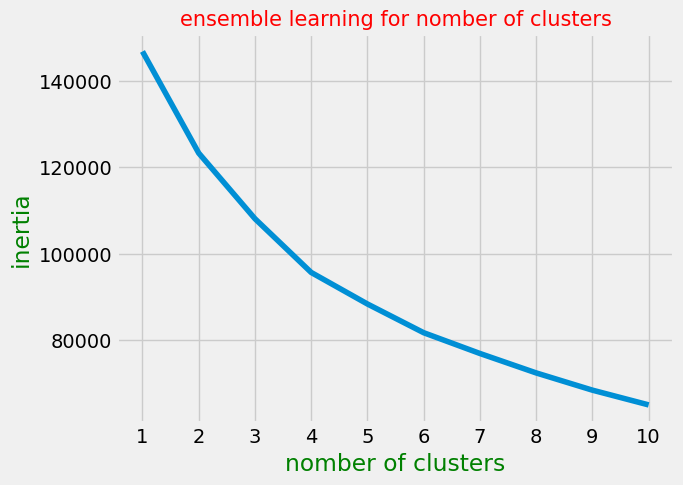

In [37]:
plt.style.use("fivethirtyeight")
plt.title('ensemble learning for nomber of clusters', fontsize=15, color='r')
plt.plot(range(1, 11), list)
plt.xticks(range(1,11))
plt.xlabel('nomber of clusters', color='g')
plt.ylabel('inertia', color='g')
plt.show()

In [38]:
# from kneed import KneeLocator

In [39]:
# k1 = KneeLocator(range(1, 11), list, curve='convex', direction='decreasing')
# k1.elbow

In [40]:
# plt.style.use("fivethirtyeight")
# plt.title('ensemble learning for nomber of clusters', fontsize=15, color='r')
# plt.plot(range(1, 11), list)
# plt.xticks(range(1,11))
# plt.xlabel('nomber of clusters', color='g')
# plt.ylabel('inertia', color='g')
# plt.axvline(x=k1.elbow, color='b', label='axvline - full height', ls='--'  )
# plt.show()

## الگوریتم k_mean

In [41]:
model_kmeans1 = KMeans(n_clusters=3)
model_kmeans1.fit(X_train)
pred_kmean =  model_kmeans1.predict(X_test)


In [42]:
model_kmeans2 = KMeans(n_clusters=3).fit(df4)
centroids = model_kmeans2.cluster_centers_
print(centroids)

[[ 1.15315232  0.31396636 -0.29561891 -0.21131219 -0.31066326  1.37679224
  -0.65689271 -0.31504498 -0.56399458  1.55535445  1.33951898 -0.37634328
   0.60360052  0.4420981   0.38443657 -0.42572843 -0.14004178]
 [ 0.30832219  0.42001262  1.5099337   1.26153715  1.25108977 -0.24791809
   1.13358118  1.53595225  0.95838728 -0.36263703 -0.25342148  1.66762018
   0.8893863   0.82418004  0.16930037  0.47063274  0.29543716]
 [-0.36672595 -0.16919927 -0.2338922  -0.20479197 -0.17652214 -0.31072123
  -0.06126824 -0.23415542 -0.04953252 -0.33398161 -0.29978846 -0.24521485
  -0.34218925 -0.28628308 -0.13598432  0.01477933 -0.024158  ]]


## بررسی مدل استفاده شده رو دیتاست به صورت بصری 

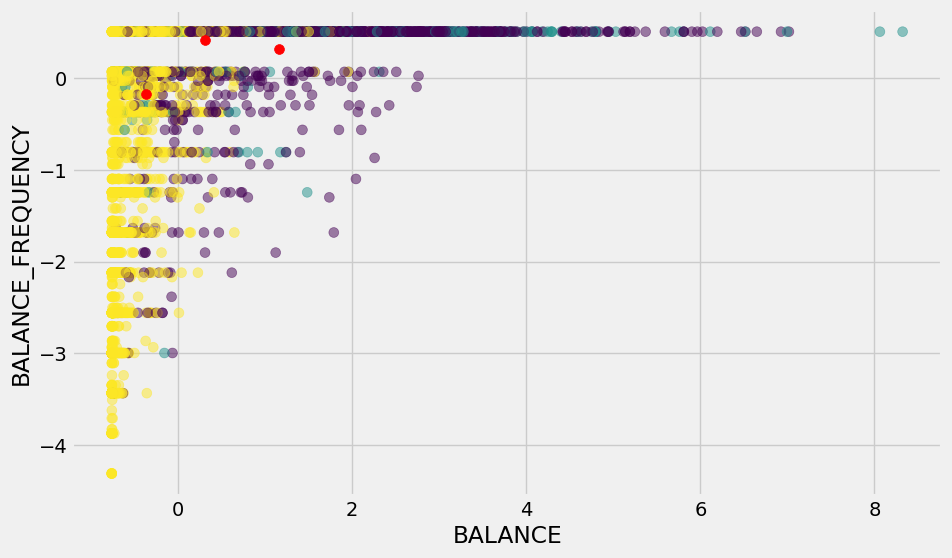

In [43]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['BALANCE_FREQUENCY'], c= model_kmeans2.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('BALANCE_FREQUENCY')
plt.show()


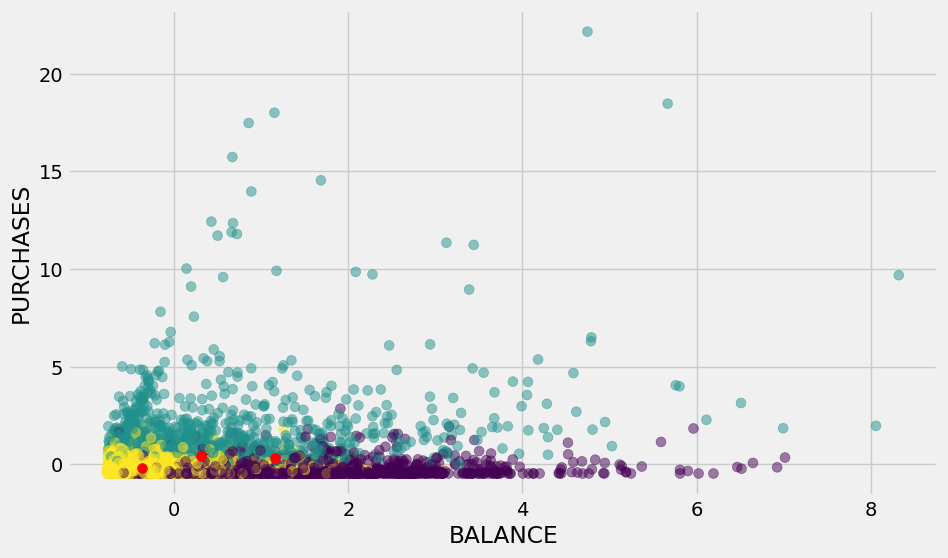

In [44]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES'], c= model_kmeans2.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES')
plt.show()

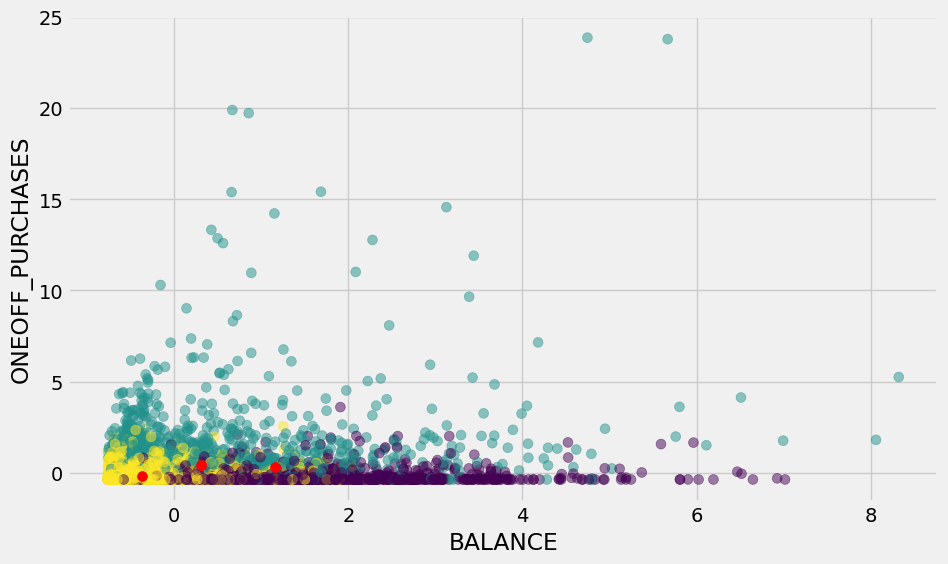

In [45]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['ONEOFF_PURCHASES'], c= model_kmeans2.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('ONEOFF_PURCHASES')
plt.show()

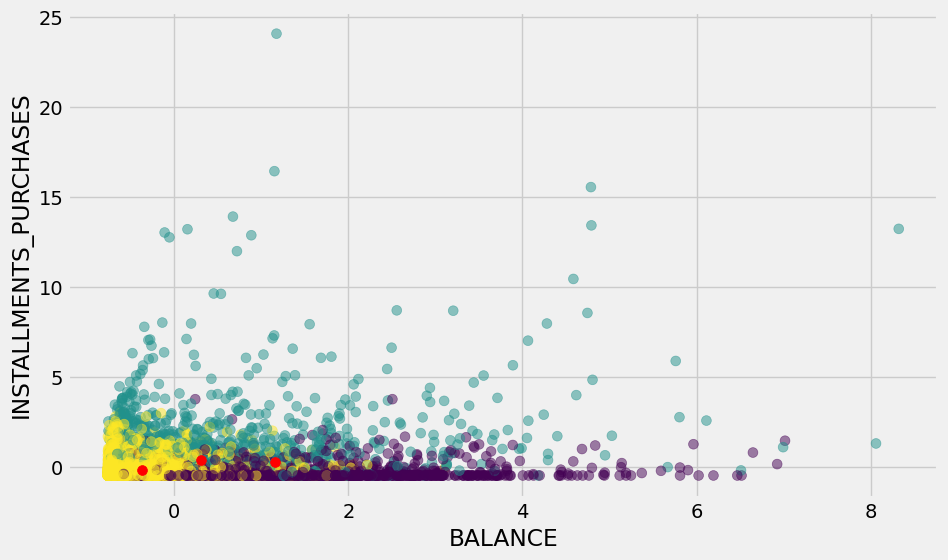

In [46]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['INSTALLMENTS_PURCHASES'], c= model_kmeans2.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('INSTALLMENTS_PURCHASES')
plt.show()

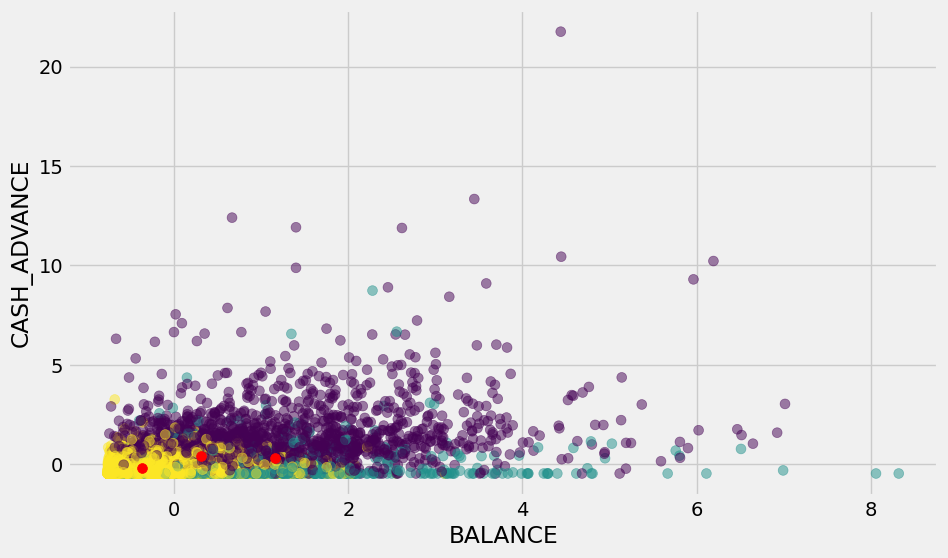

In [47]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE'], c= model_kmeans2.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE')
plt.show()

/Users/home/Documents/Computer Science/AI(JupyterNoteBook)/Machine Learning/Unsupervised Lerning/venv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


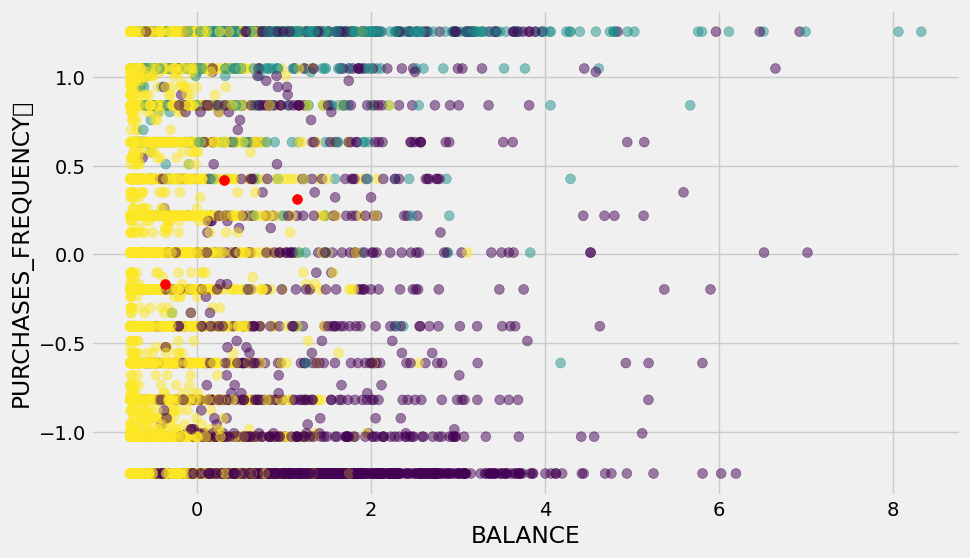

In [48]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_FREQUENCY\t'], c= model_kmeans2.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_FREQUENCY\t')
plt.show()

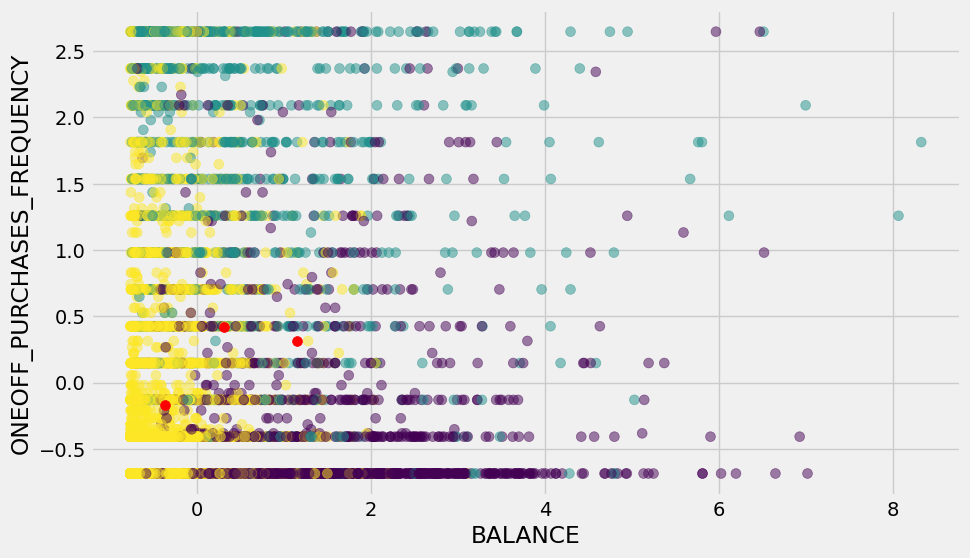

In [49]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['ONEOFF_PURCHASES_FREQUENCY'], c= model_kmeans2.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('ONEOFF_PURCHASES_FREQUENCY')
plt.show()

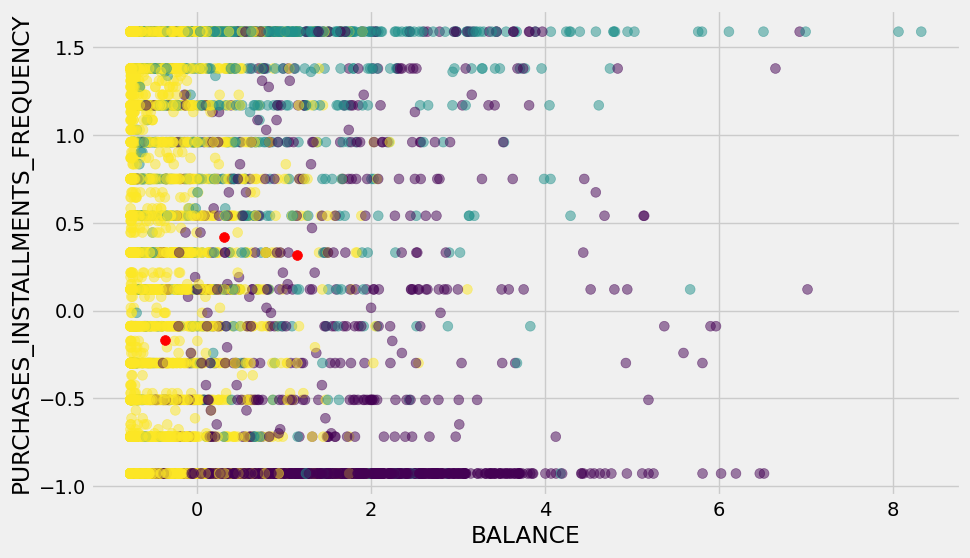

In [50]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_INSTALLMENTS_FREQUENCY'], c= model_kmeans2.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_INSTALLMENTS_FREQUENCY')
plt.show()

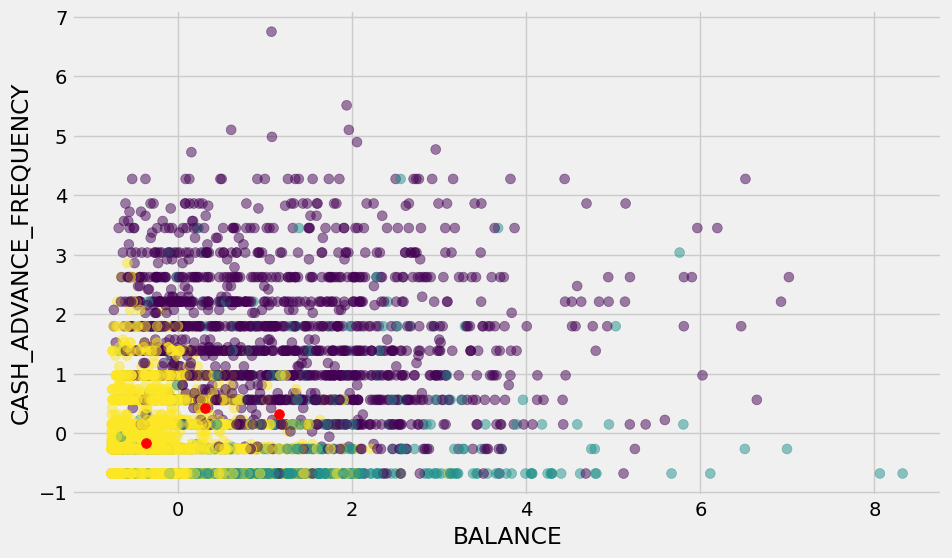

In [51]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE_FREQUENCY'], c= model_kmeans2.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE_FREQUENCY')
plt.show()

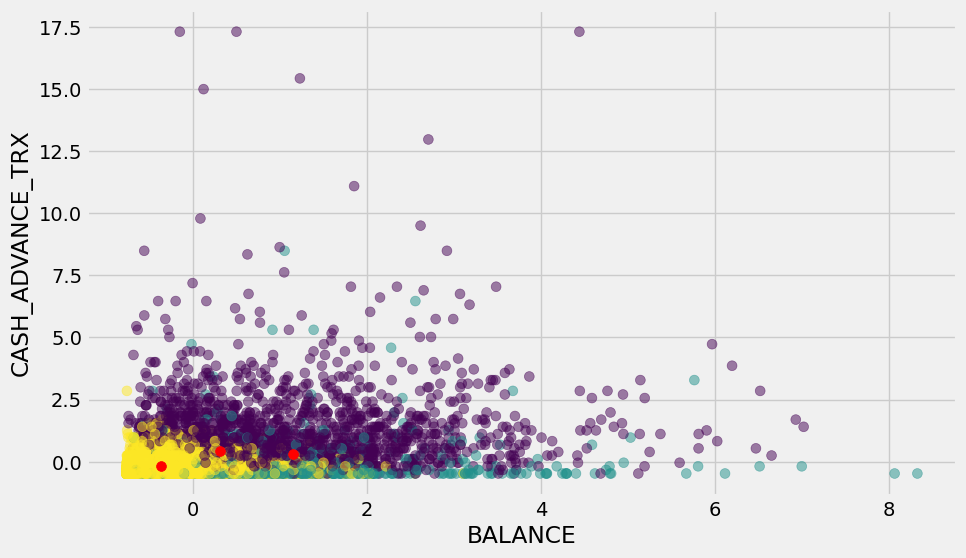

In [52]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE_TRX'], c= model_kmeans2.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE_TRX')
plt.show()

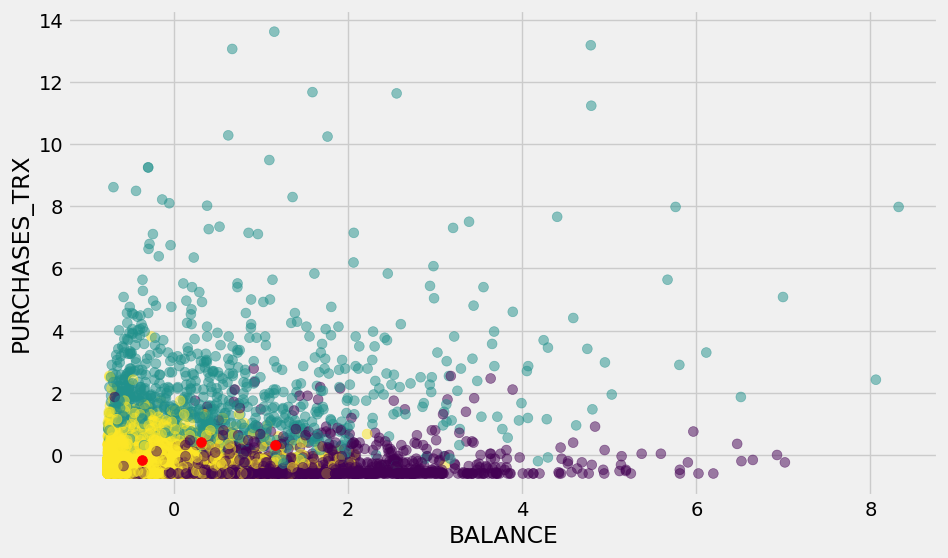

In [53]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_TRX'], c= model_kmeans2.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_TRX')
plt.show()

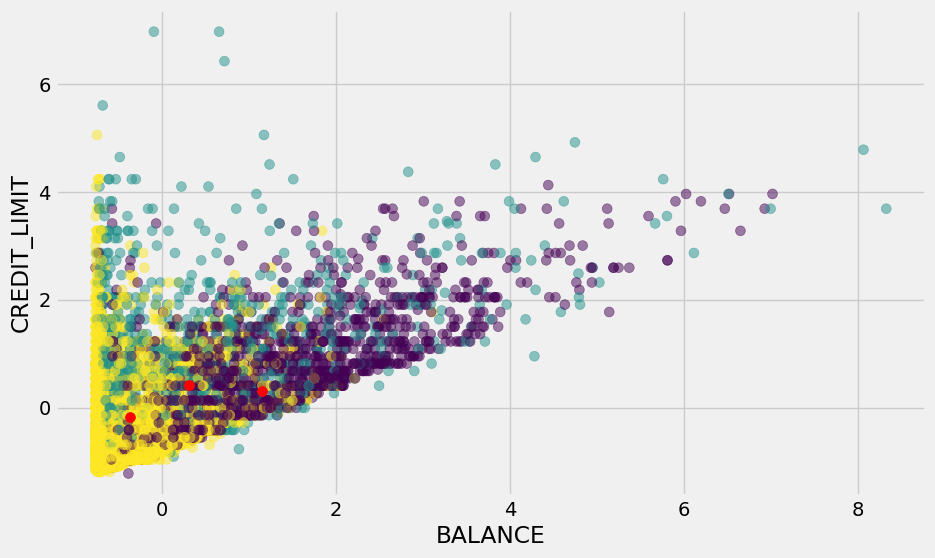

In [54]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CREDIT_LIMIT'], c= model_kmeans2.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('CREDIT_LIMIT')
plt.show()

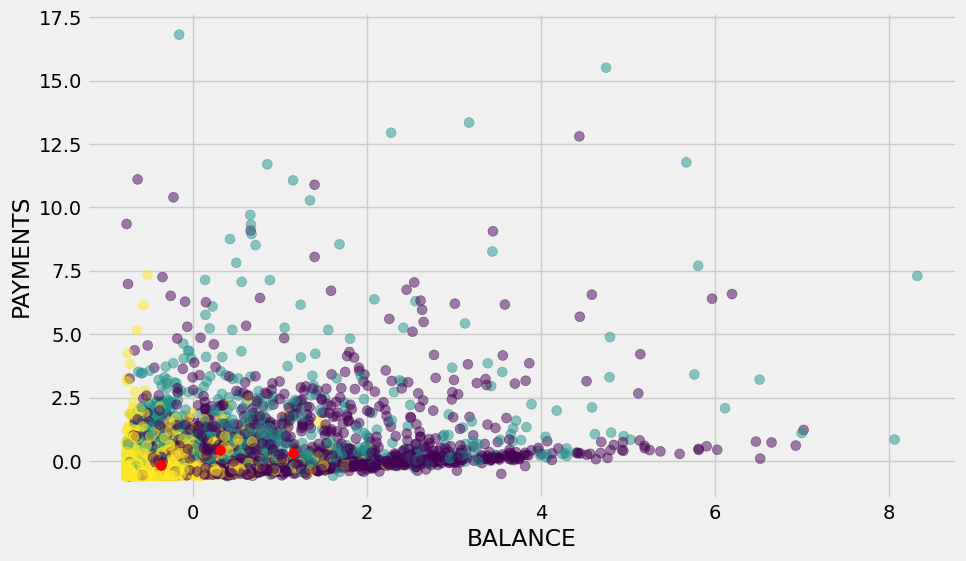

In [55]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PAYMENTS'], c= model_kmeans2.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PAYMENTS')
plt.show()

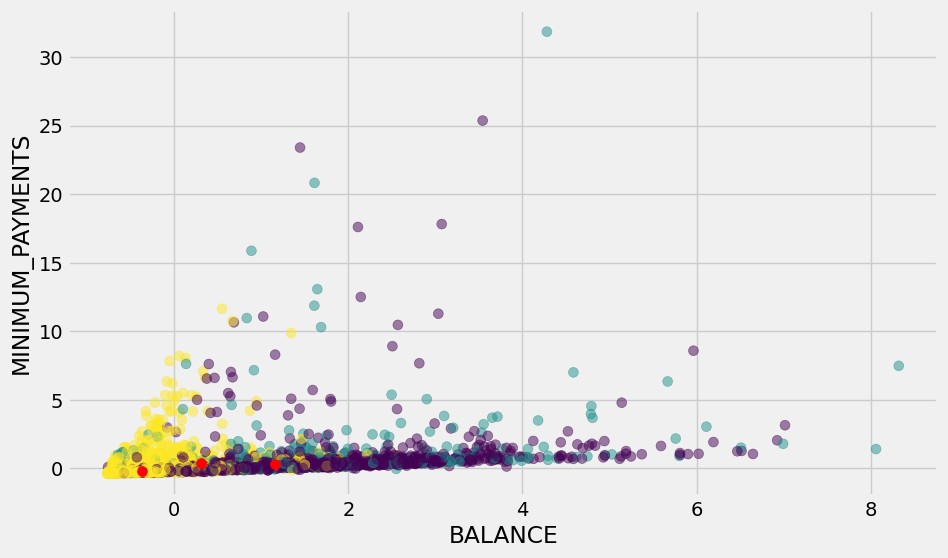

In [56]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['MINIMUM_PAYMENTS'], c= model_kmeans2.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('MINIMUM_PAYMENTS')
plt.show()

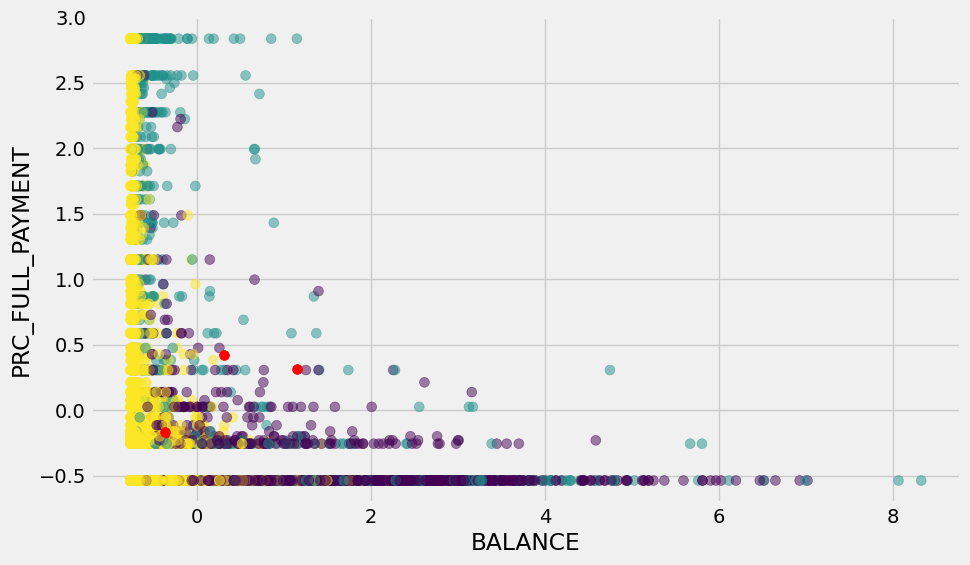

In [57]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PRC_FULL_PAYMENT'], c= model_kmeans2.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PRC_FULL_PAYMENT')
plt.show()

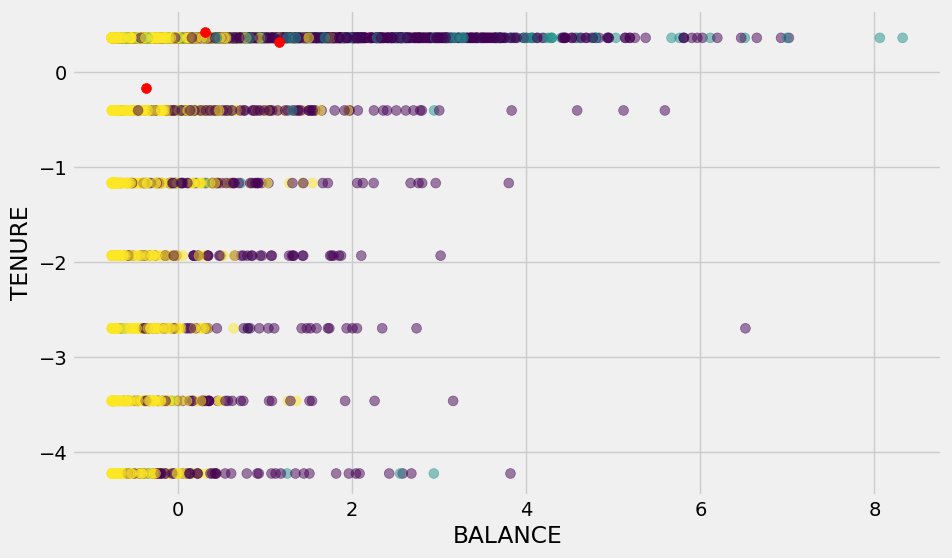

In [58]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['TENURE'], c= model_kmeans2.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('TENURE')
plt.show()

## بررسی دقت مدل با تعداد خوشه های متفاوت و پیدا کردن تعداد کلاستر بهینه

In [59]:
silhouette_coefficients = []
for k in range(2,11):
    model_kmean3 = KMeans(n_clusters=k, **kmeans_setting)
    model_kmean3.fit(df4)
    score = metrics.silhouette_score(df4, model_kmean3.labels_)
    silhouette_coefficients.append(score)

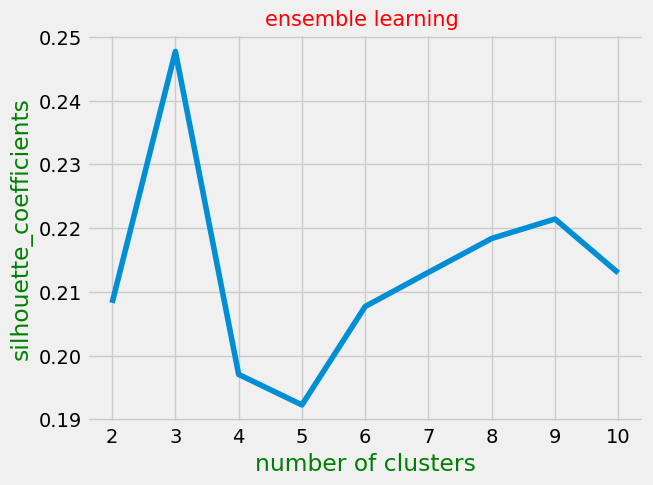

In [60]:
plt.style.use("fivethirtyeight")
plt.title('ensemble learning ', fontsize=15, color='r')
plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2,11))
plt.xlabel('number of clusters', color='g')
plt.ylabel('silhouette_coefficients', color='g')
plt.show()

## AffinityPropagation الگوریتم 

In [61]:
model_AffinityPropagation1 = AffinityPropagation()
model_AffinityPropagation1.fit(X_train)
pred_AffinityPropagation =  model_AffinityPropagation1.predict(X_test)

In [62]:
model_AffinityPropagation = AffinityPropagation()

model_AffinityPropagation.fit(df4)

AffinityPropagation()

In [63]:
centroids = model_AffinityPropagation.cluster_centers_

In [64]:
print(centroids)

[[-9.04925746e-02 -2.12095447e+00 -2.87006813e-02 ... -6.08473253e-02
   5.87433482e-01  3.55180657e-01]
 [ 3.74671669e-01  5.05404648e-01  1.93457312e+00 ...  1.88502981e-01
  -2.56437677e-01  3.55180657e-01]
 [-3.77664678e-01 -9.64688149e-02 -4.73208191e-01 ... -2.88688283e-01
  -5.37726938e-01 -2.69614006e+00]
 ...
 [-7.43164608e-01  5.05404648e-01 -2.05254944e-01 ... -3.20680033e-01
   2.27517580e+00 -3.45897024e+00]
 [ 2.08368152e+00 -2.97094907e-01 -3.74199547e-01 ... -9.92669096e-04
  -5.37726938e-01 -4.22180042e+00]
 [-7.52977281e-01 -2.97094907e-01 -4.06571751e-01 ... -3.29572173e-01
   3.06144221e-01 -4.22180042e+00]]


## بررسی بصری مدل روی دیتاست

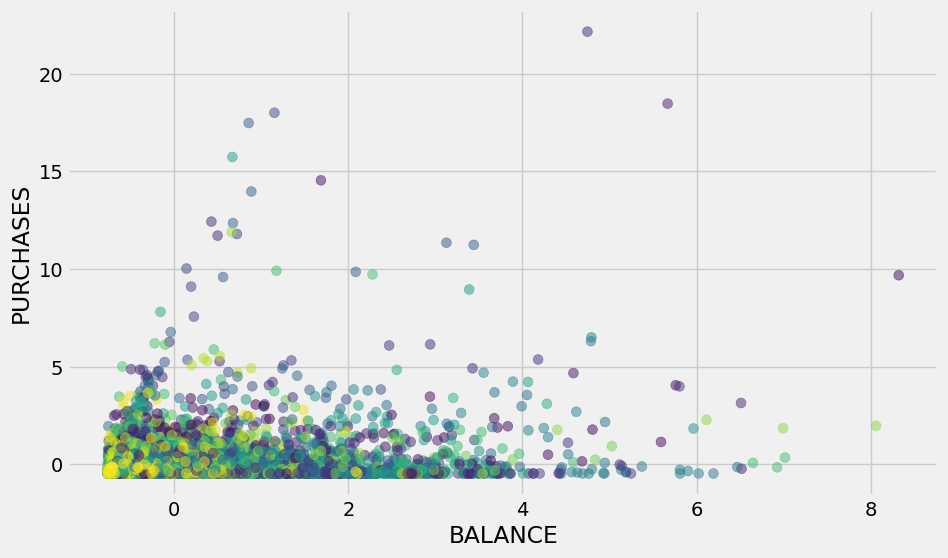

In [65]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES'], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES')
plt.show()

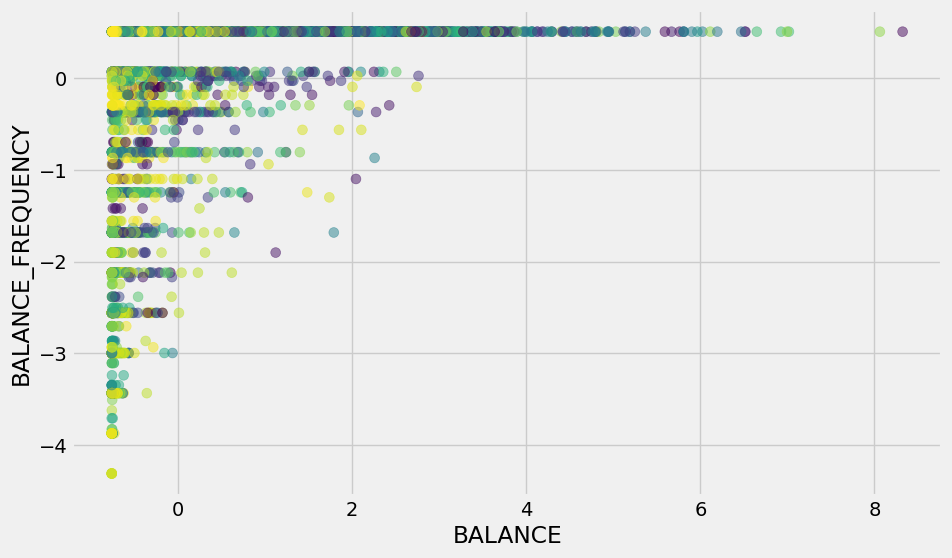

In [66]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['BALANCE_FREQUENCY'], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('BALANCE_FREQUENCY')
plt.show()

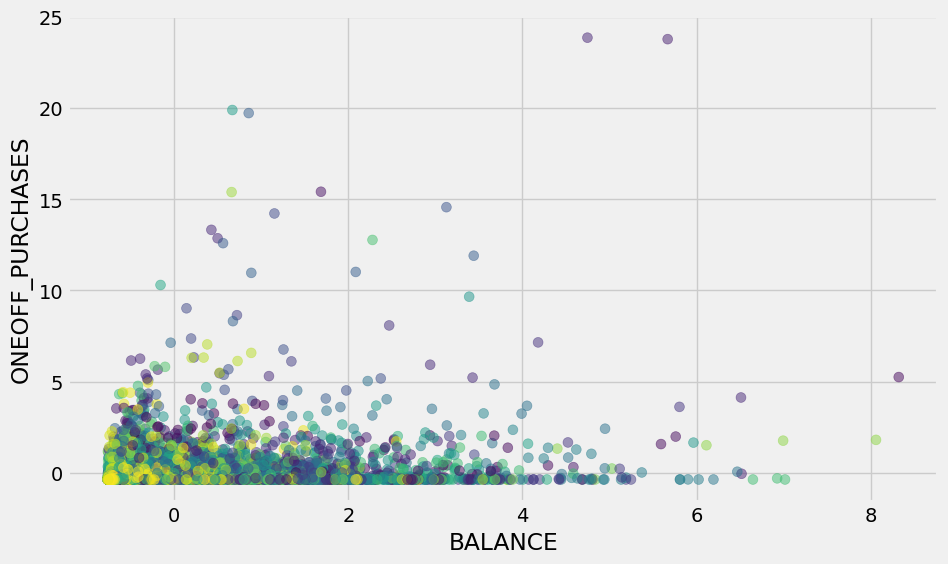

In [67]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['ONEOFF_PURCHASES'], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('ONEOFF_PURCHASES')
plt.show()

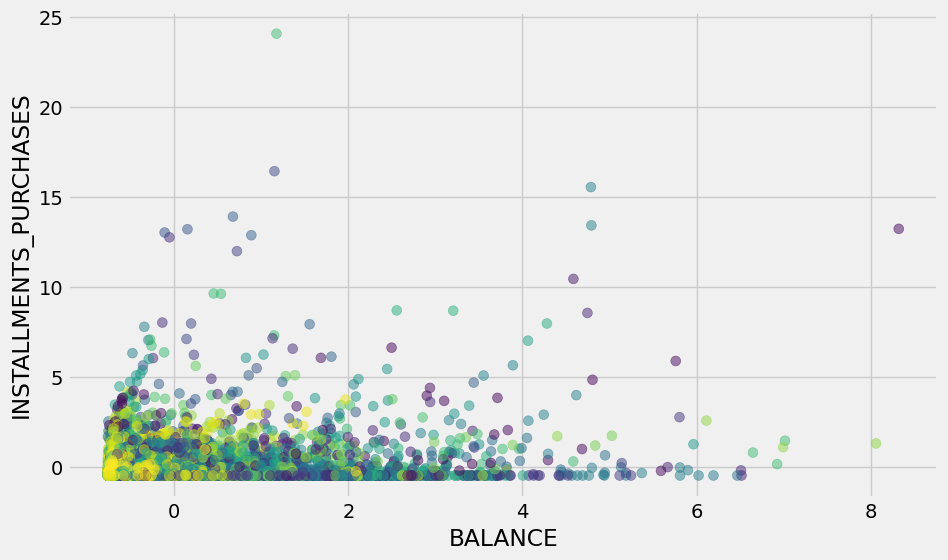

In [68]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['INSTALLMENTS_PURCHASES'], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('INSTALLMENTS_PURCHASES')
plt.show()

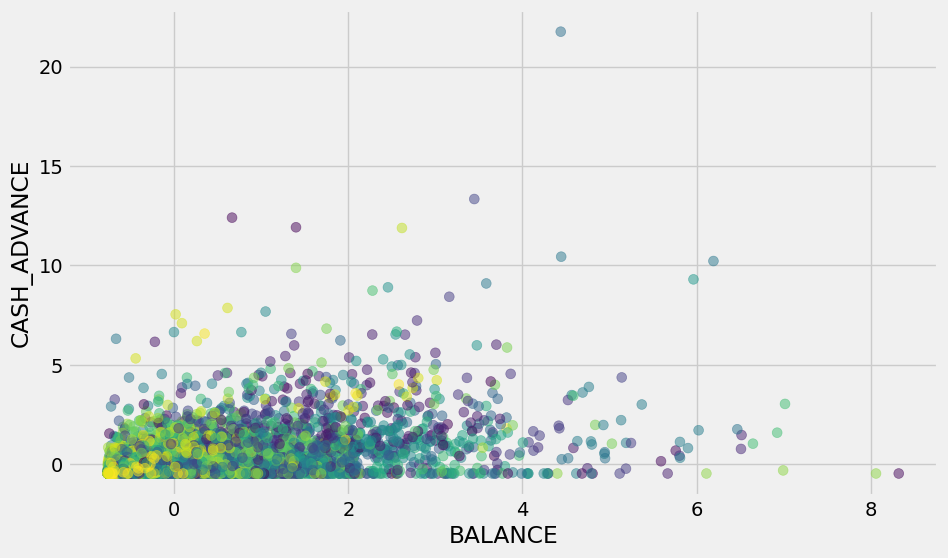

In [69]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE'], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE')
plt.show()

/Users/home/Documents/Computer Science/AI(JupyterNoteBook)/Machine Learning/Unsupervised Lerning/venv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


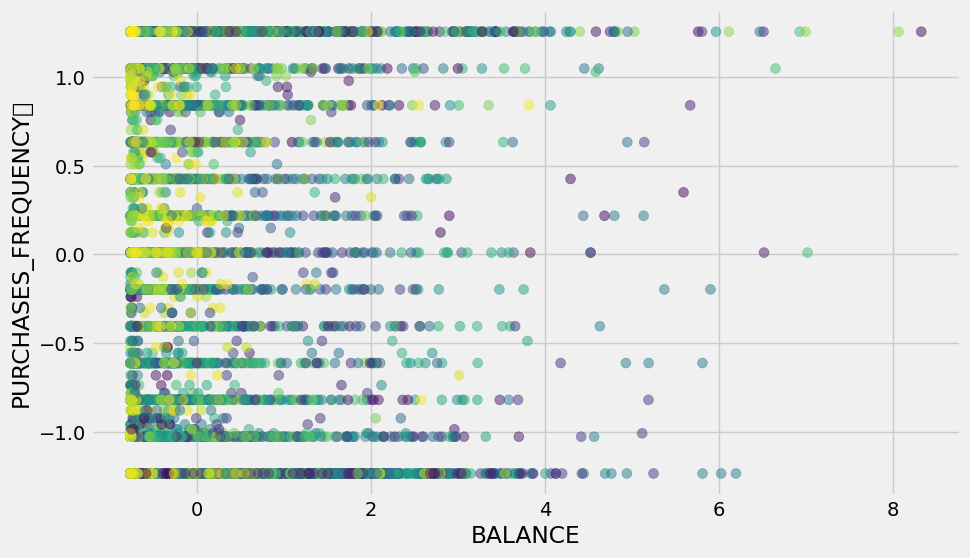

In [70]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_FREQUENCY\t'], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_FREQUENCY\t')
plt.show()

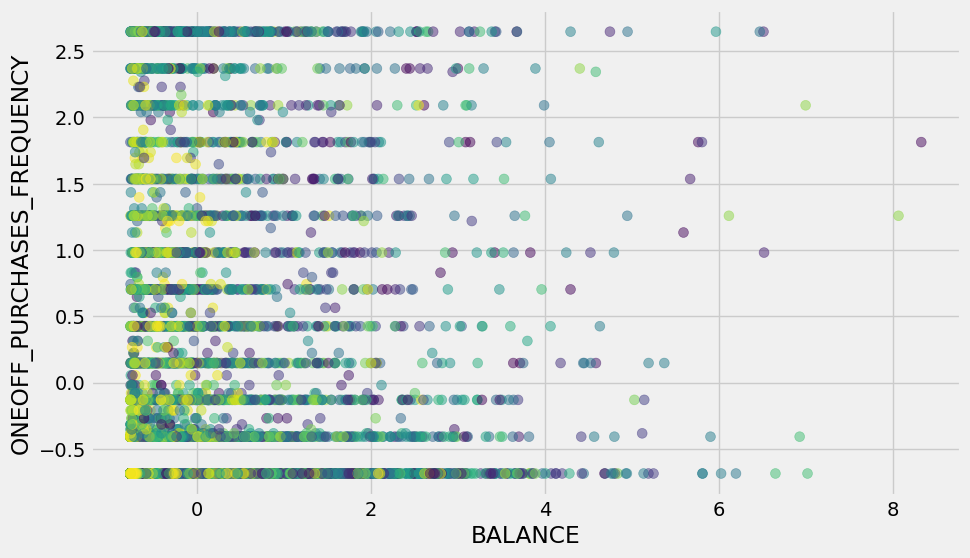

In [71]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['ONEOFF_PURCHASES_FREQUENCY'], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('ONEOFF_PURCHASES_FREQUENCY')
plt.show()

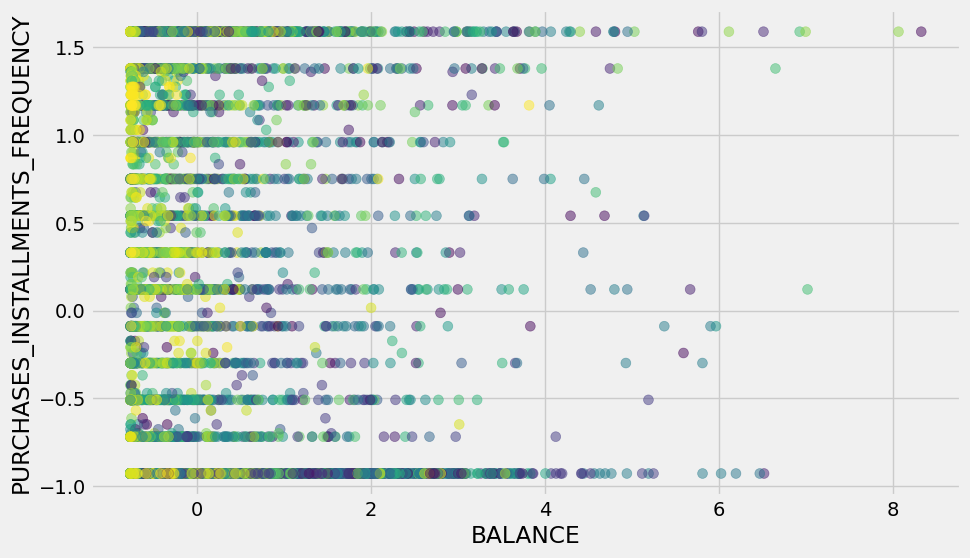

In [72]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_INSTALLMENTS_FREQUENCY'], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_INSTALLMENTS_FREQUENCY')
plt.show()

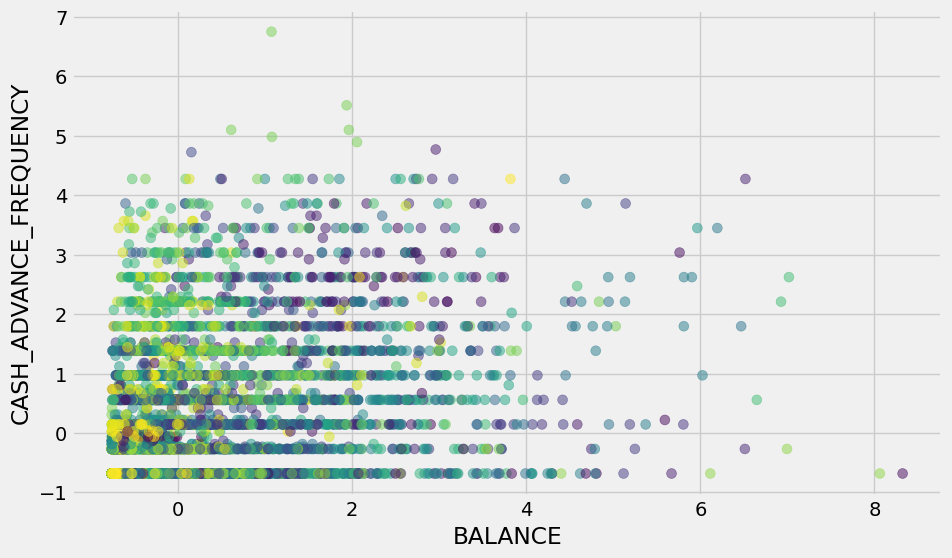

In [73]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE_FREQUENCY'], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE_FREQUENCY')
plt.show()

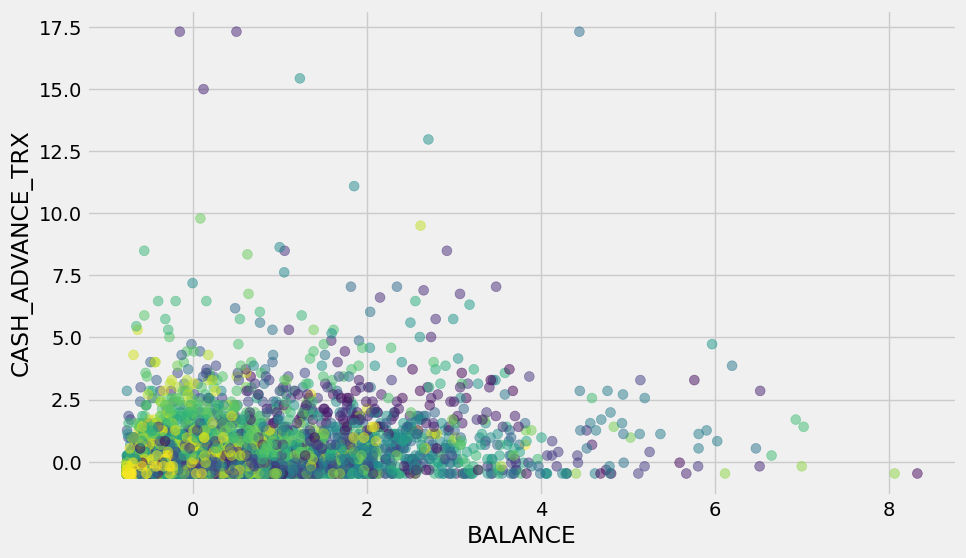

In [74]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE_TRX'], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE_TRX')
plt.show()

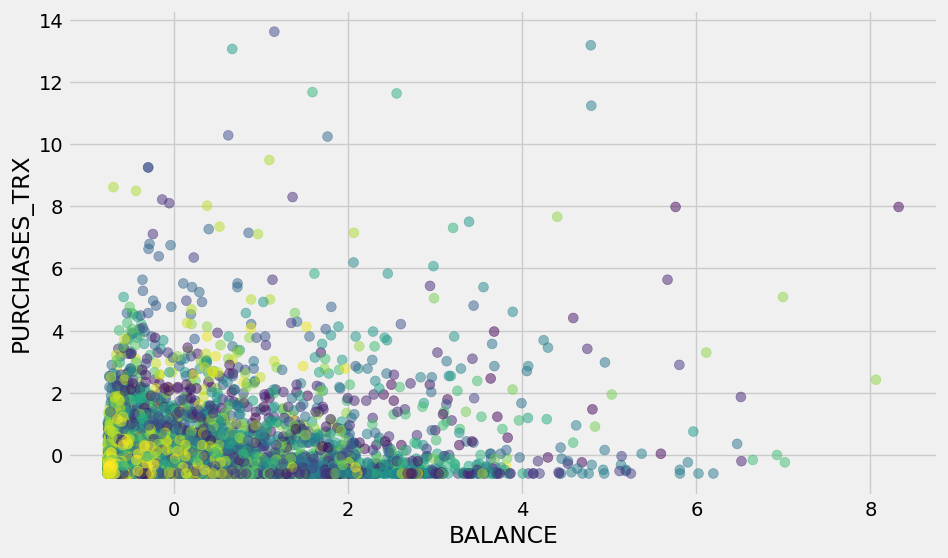

In [75]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_TRX'], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_TRX')
plt.show()

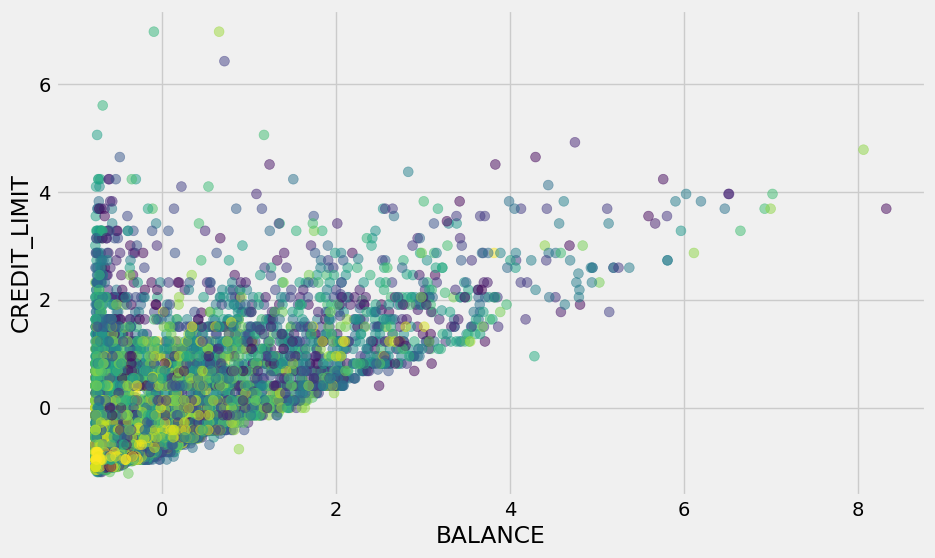

In [76]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CREDIT_LIMIT'], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('CREDIT_LIMIT')
plt.show()

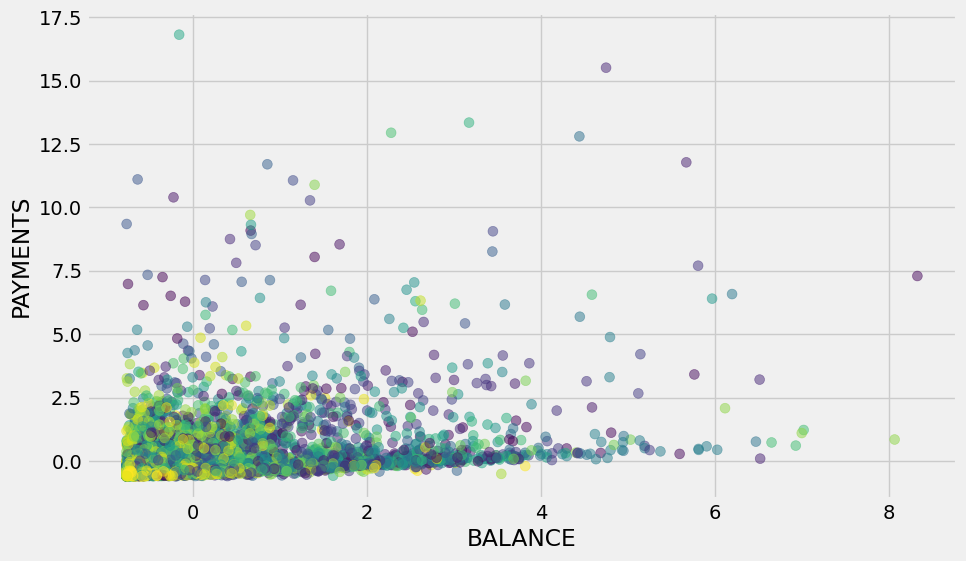

In [77]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PAYMENTS'], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PAYMENTS')
plt.show()

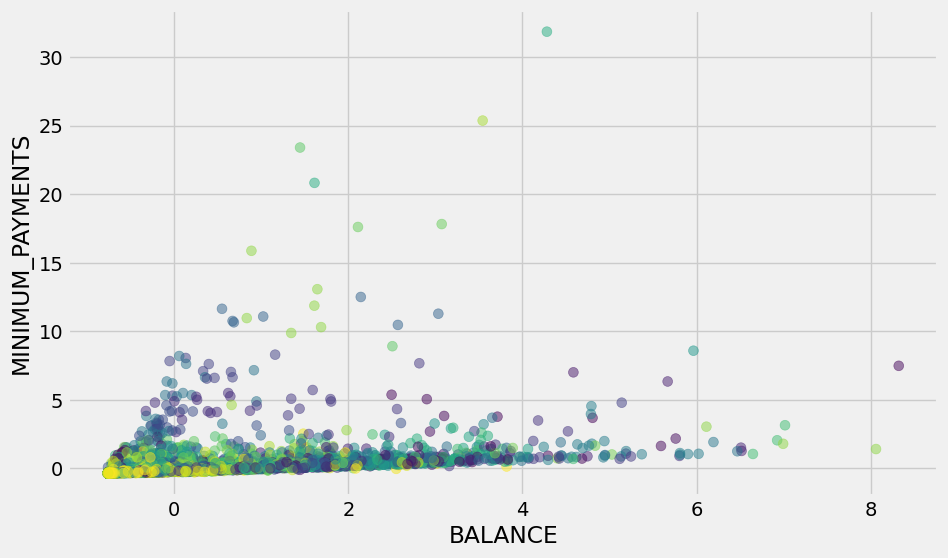

In [78]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['MINIMUM_PAYMENTS'], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('MINIMUM_PAYMENTS')
plt.show()

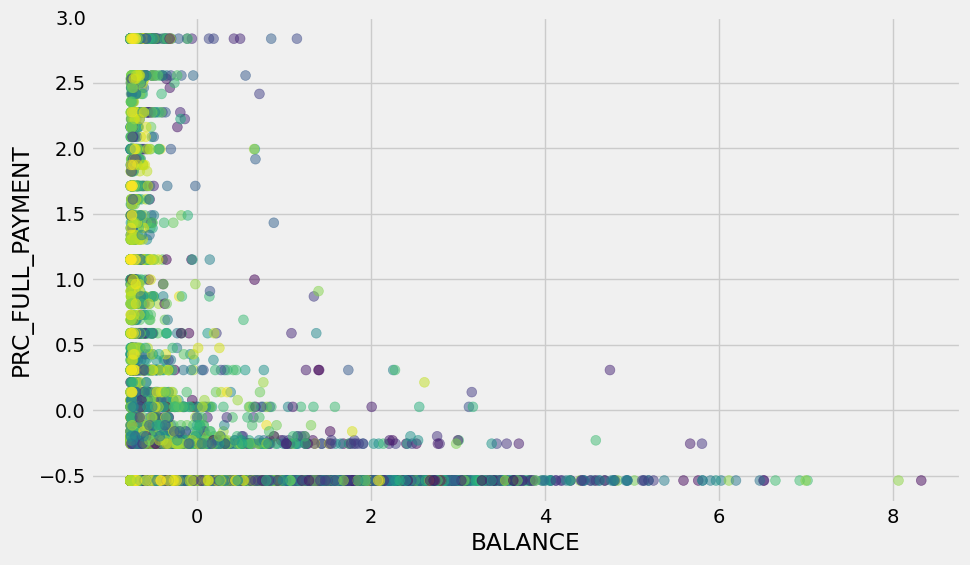

In [79]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PRC_FULL_PAYMENT'], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PRC_FULL_PAYMENT')
plt.show()

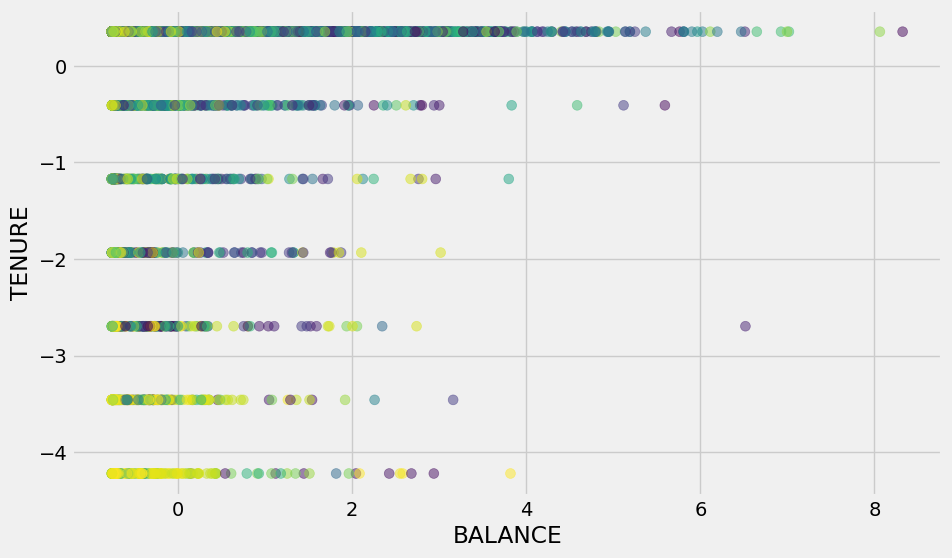

In [80]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['TENURE'], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('TENURE')
plt.show()

## Model MeanShift

In [81]:
model_MeanShift1 = MeanShift()
model_MeanShift1.fit(X_train)
pred_MeanShift1 =  model_MeanShift1.predict(X_test)

In [82]:
model_MeanShift = MeanShift()

model_MeanShift.fit(df4)

MeanShift()

In [83]:
centroids = model_MeanShift.cluster_centers_
print(len(centroids))

77


## بررسی بصری مدل بر روی دیتاست

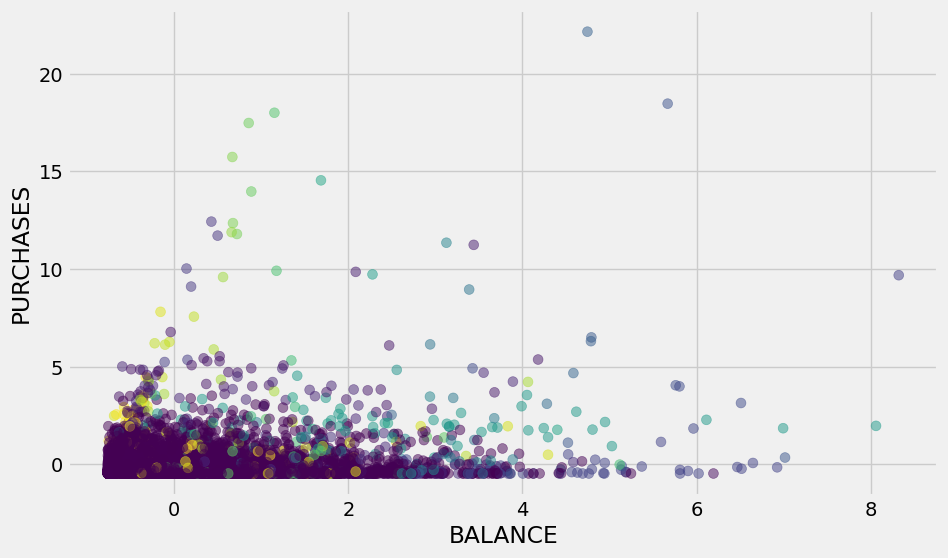

In [84]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES'], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES')
plt.show()

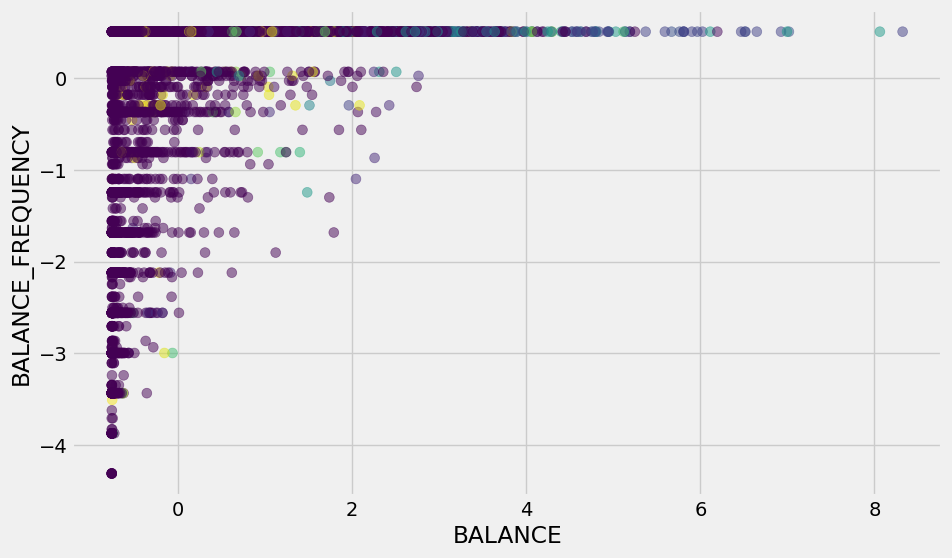

In [85]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['BALANCE_FREQUENCY'], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('BALANCE_FREQUENCY')
plt.show()

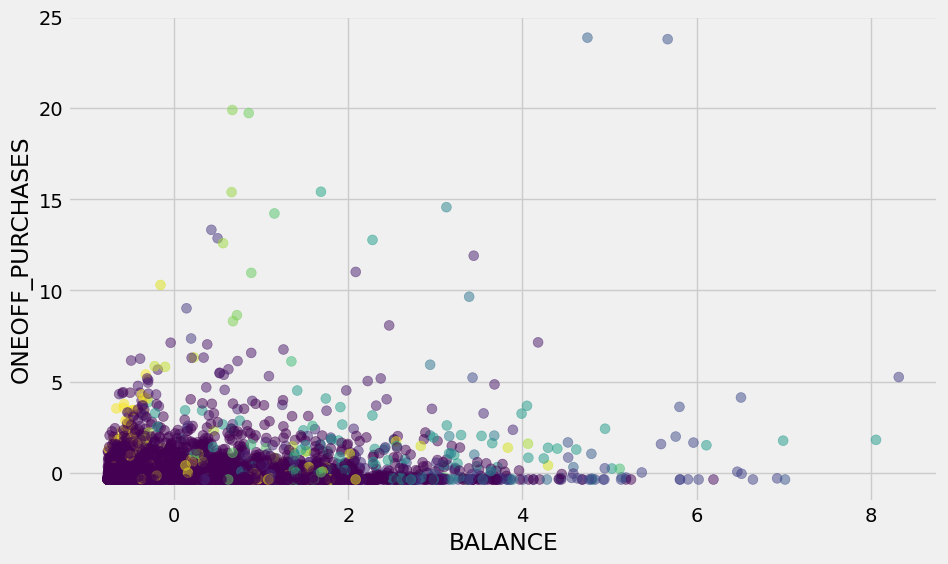

In [86]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['ONEOFF_PURCHASES'], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('ONEOFF_PURCHASES')
plt.show()

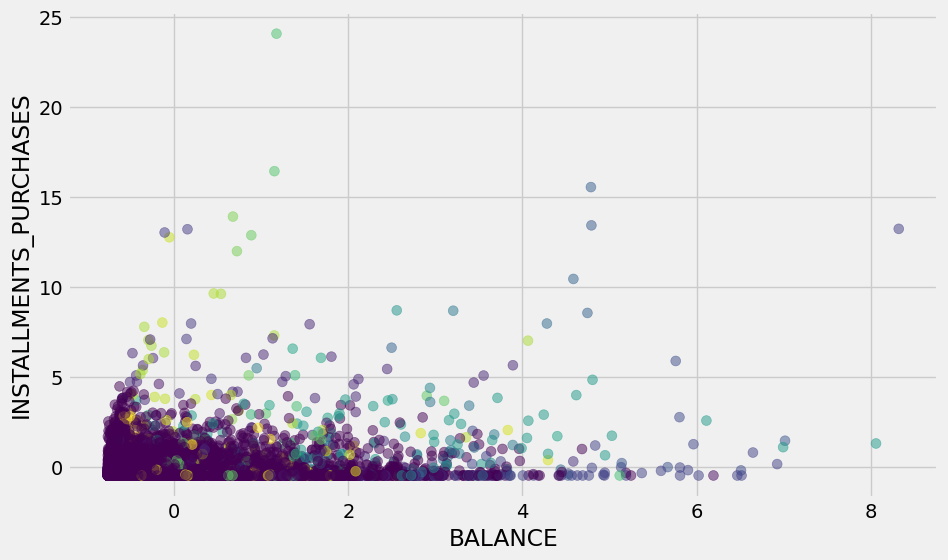

In [87]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['INSTALLMENTS_PURCHASES'], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('INSTALLMENTS_PURCHASES')
plt.show()

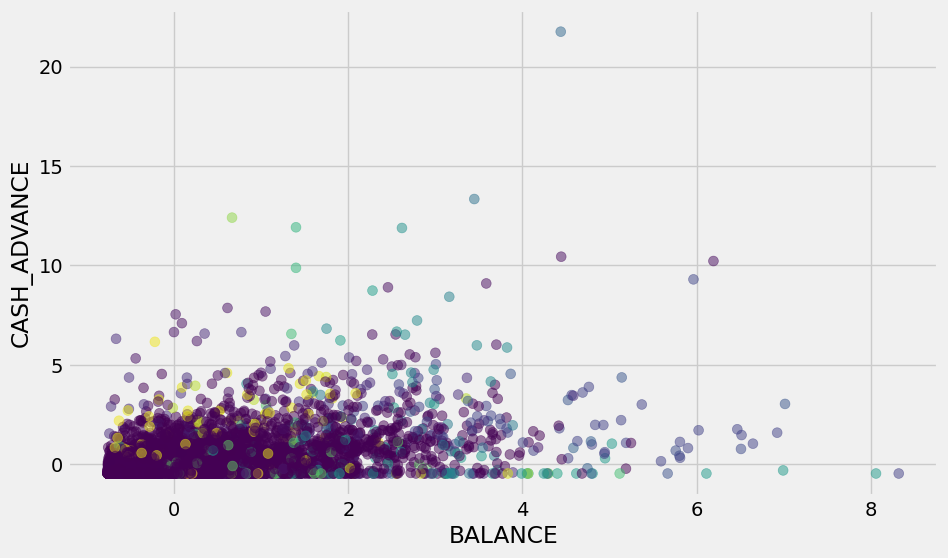

In [88]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE'], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE')
plt.show()

/Users/home/Documents/Computer Science/AI(JupyterNoteBook)/Machine Learning/Unsupervised Lerning/venv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


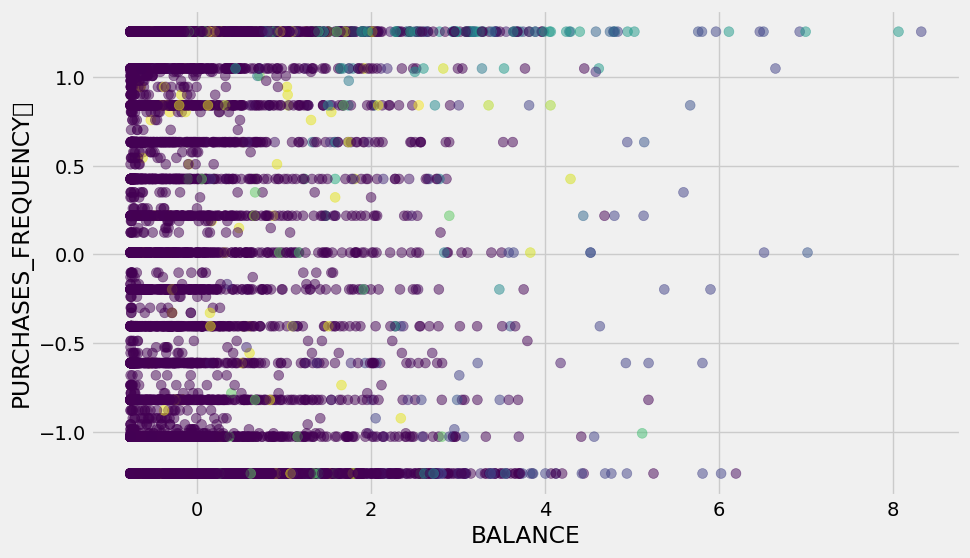

In [89]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_FREQUENCY\t'], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_FREQUENCY\t')
plt.show()

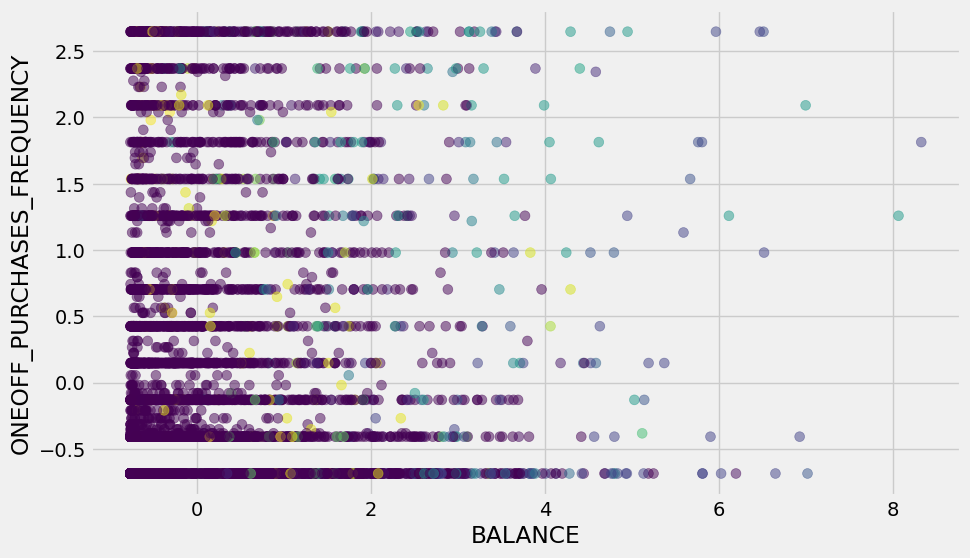

In [90]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['ONEOFF_PURCHASES_FREQUENCY'], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('ONEOFF_PURCHASES_FREQUENCY')
plt.show()

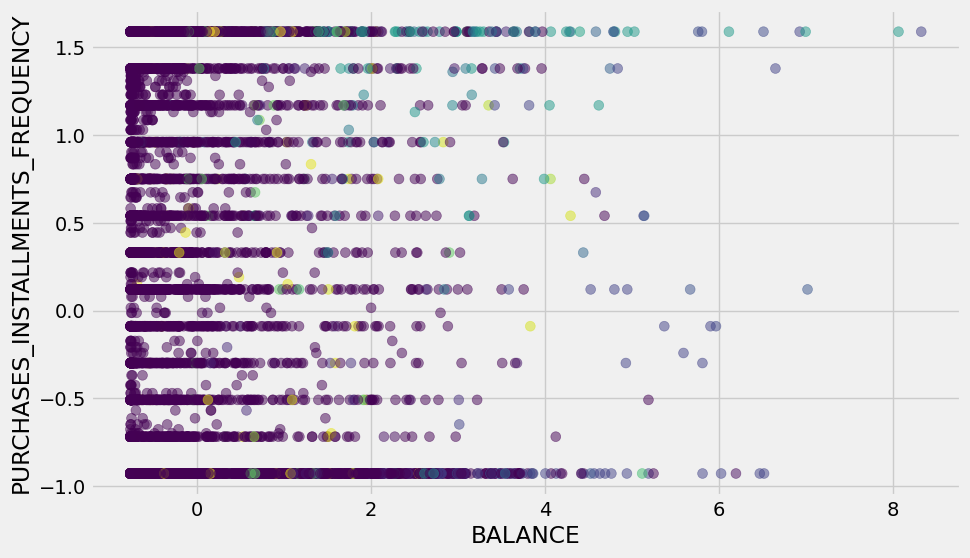

In [91]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_INSTALLMENTS_FREQUENCY'], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_INSTALLMENTS_FREQUENCY')
plt.show()

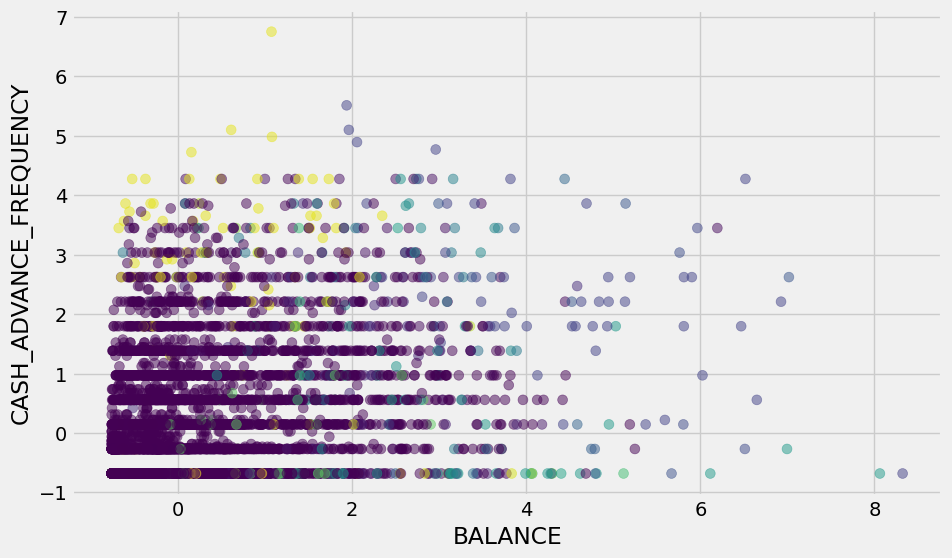

In [92]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE_FREQUENCY'], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE_FREQUENCY')
plt.show()

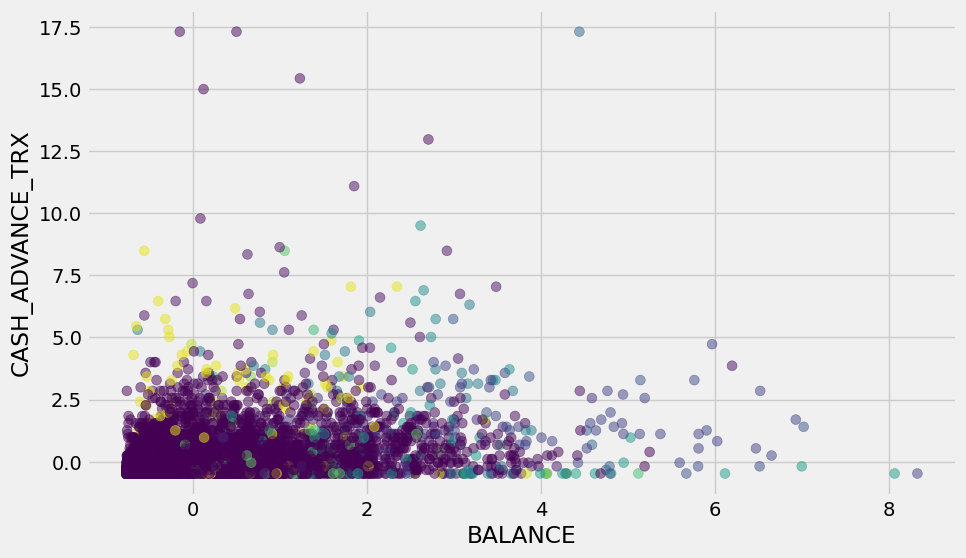

In [93]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE_TRX'], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE_TRX')
plt.show()

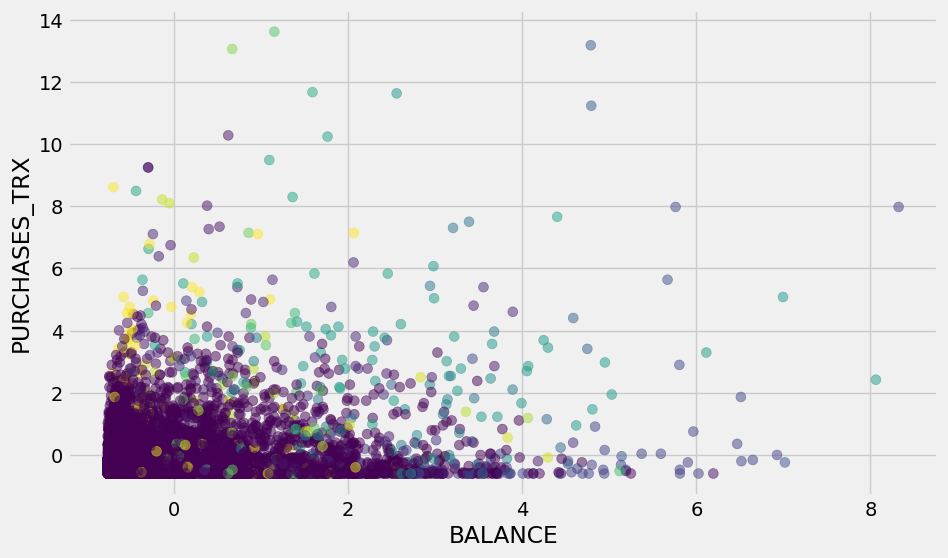

In [94]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_TRX'], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_TRX')
plt.show()

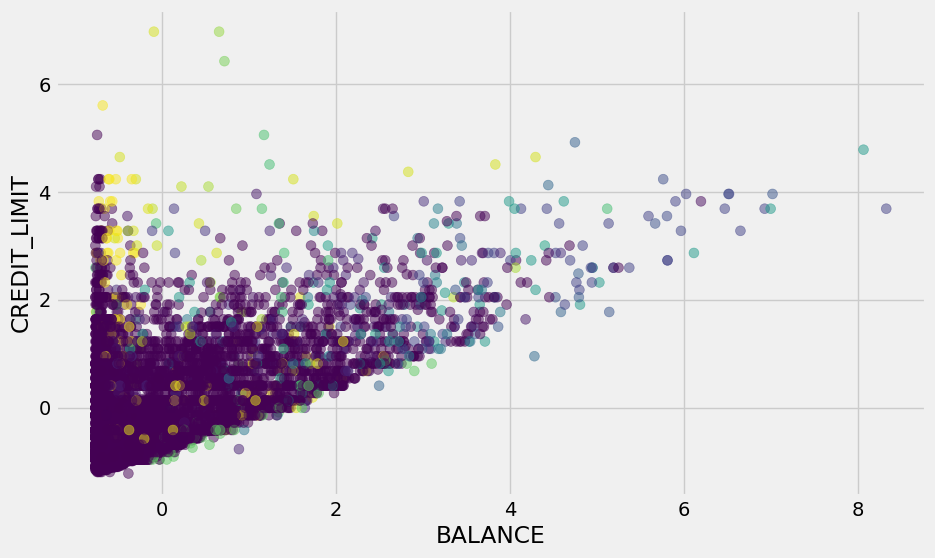

In [95]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CREDIT_LIMIT'], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('CREDIT_LIMIT')
plt.show()

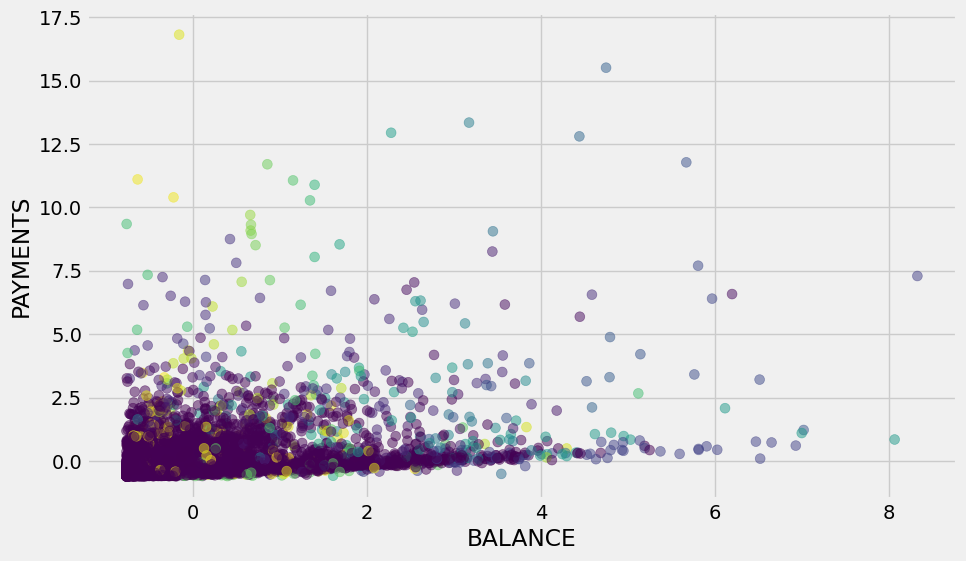

In [96]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PAYMENTS'], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PAYMENTS')
plt.show()

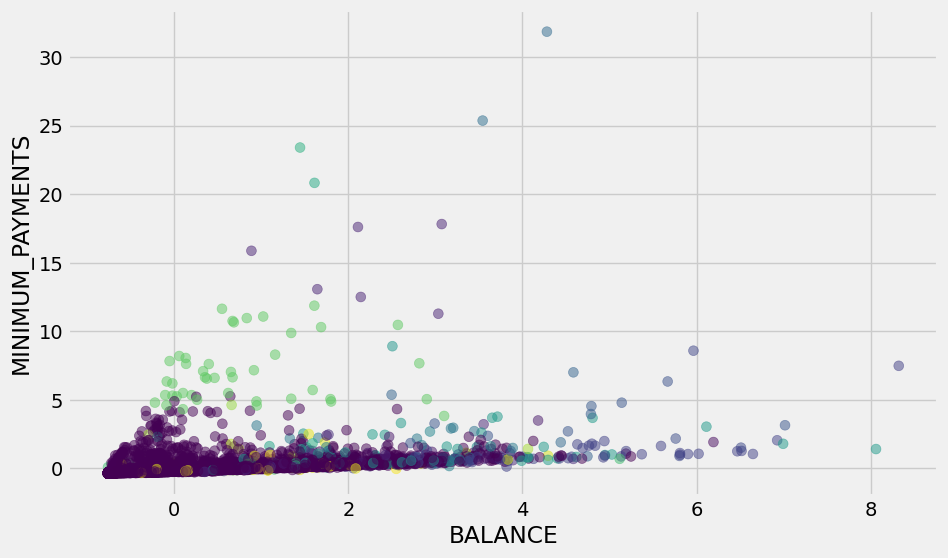

In [97]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['MINIMUM_PAYMENTS'], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('MINIMUM_PAYMENTS')
plt.show()

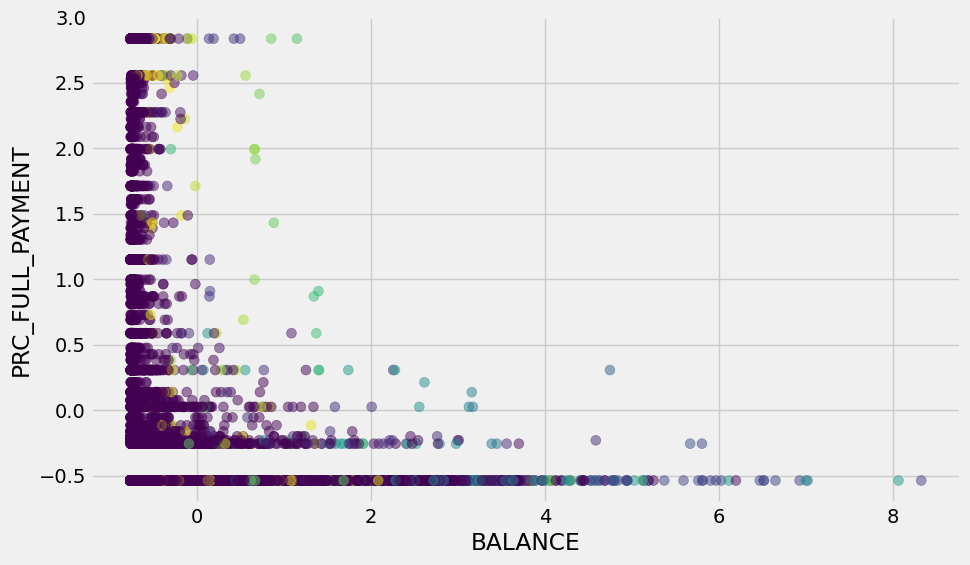

In [98]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PRC_FULL_PAYMENT'], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('PRC_FULL_PAYMENT')
plt.show()

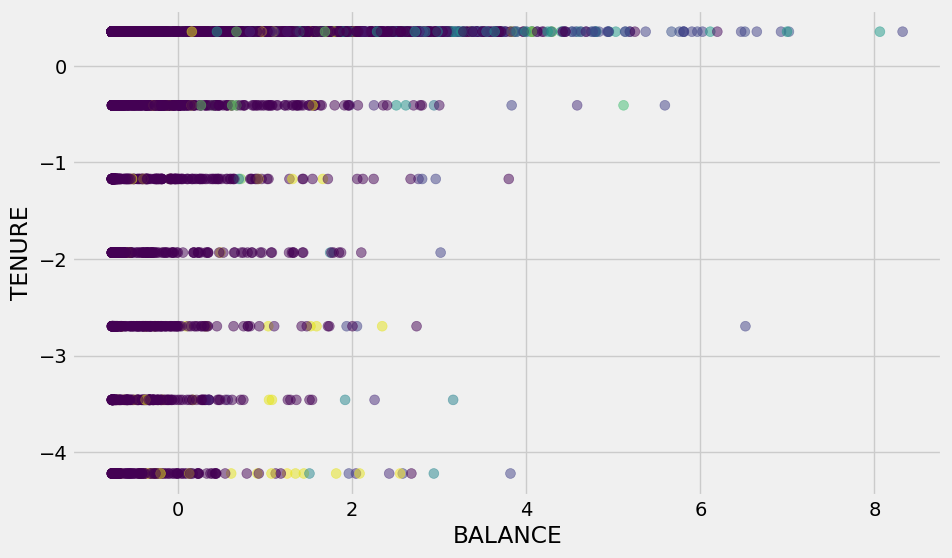

In [99]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['TENURE'], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
# plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel('BALANCE')
plt.ylabel('TENURE')
plt.show()

In [100]:
# model_SpectralClustering = SpectralClustering(n_clusters=3, n_jobs=1)

# model_SpectralClustering.fit(df4)

In [101]:
# plt.figure(figsize=(10, 6))
# plt.scatter(df4['BALANCE'], df4['PURCHASES'], c=model_SpectralClustering.labels_.astype(float), s=50, alpha=0.5)
# # plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
# plt.xlabel('BALANCE')
# plt.ylabel('PURCHASES')
# plt.show()

## AgglomerativeClustering model

In [103]:
model_AgglomerativeClustering1 = AgglomerativeClustering()
model_AgglomerativeClustering1.fit(X_train)
# pred_AgglomerativeClustering =  model_AgglomerativeClustering1.predict(X_test)

AgglomerativeClustering()

In [104]:
model_AgglomerativeClustering = AgglomerativeClustering()

model_AgglomerativeClustering.fit(df4)

AgglomerativeClustering()

## بررسی بصری خوشه بندی مدل در دیتاست

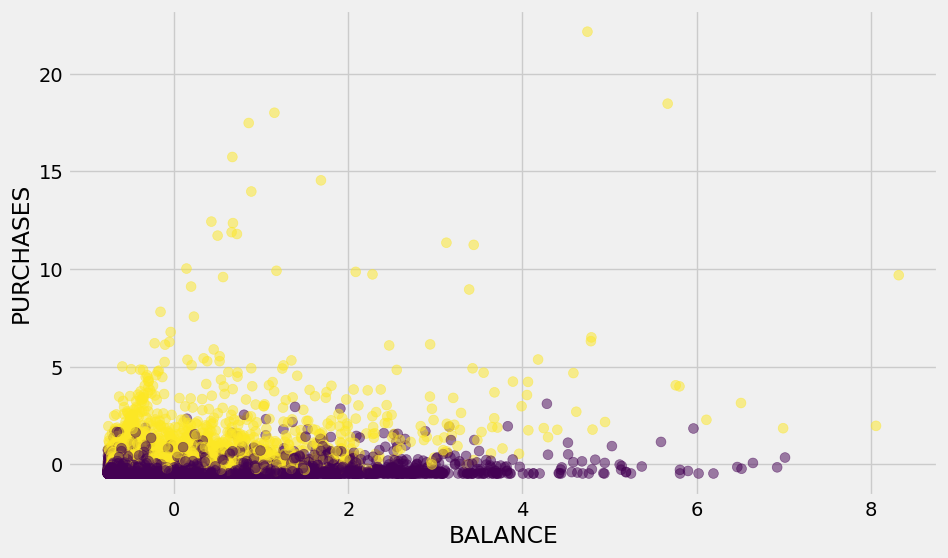

In [105]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES'], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES')
plt.show()

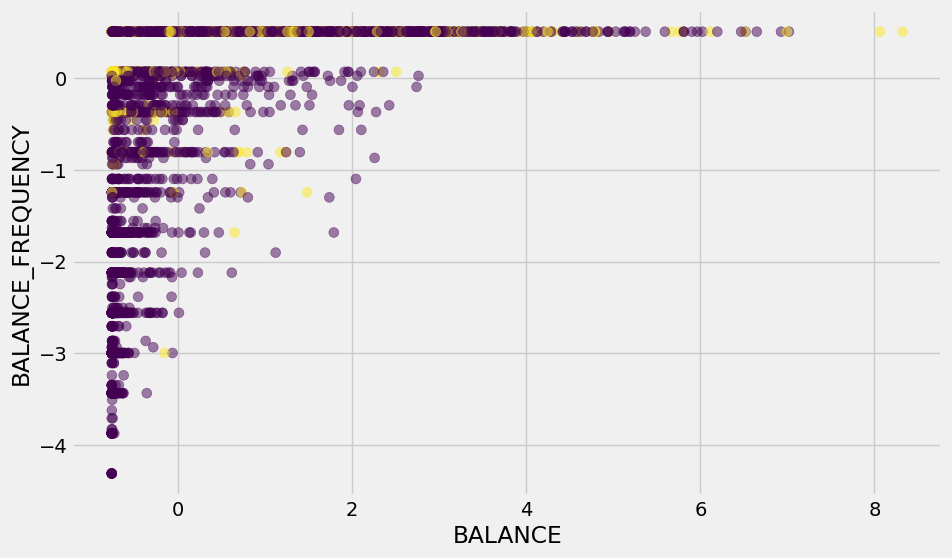

In [106]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['BALANCE_FREQUENCY'], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('BALANCE_FREQUENCY')
plt.show()

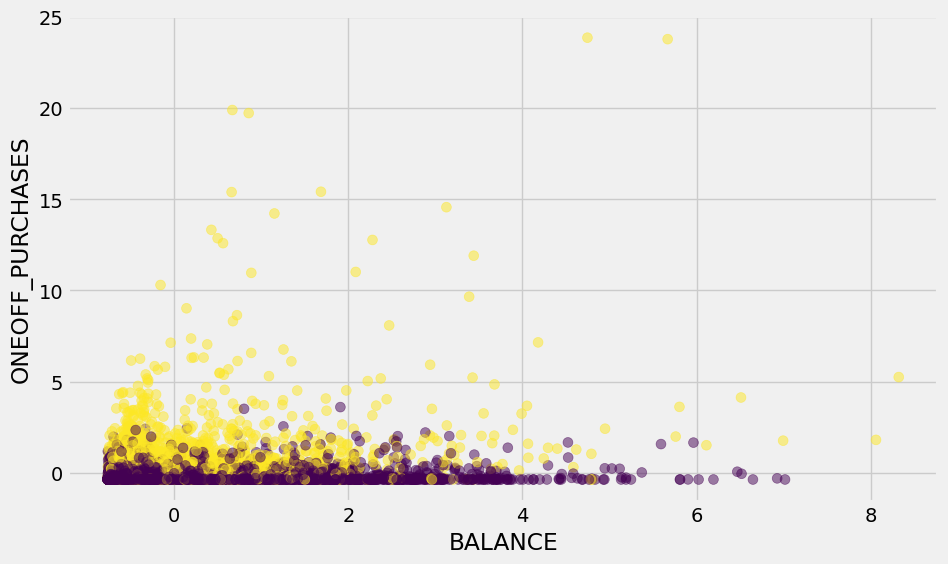

In [107]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['ONEOFF_PURCHASES'], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('ONEOFF_PURCHASES')
plt.show()

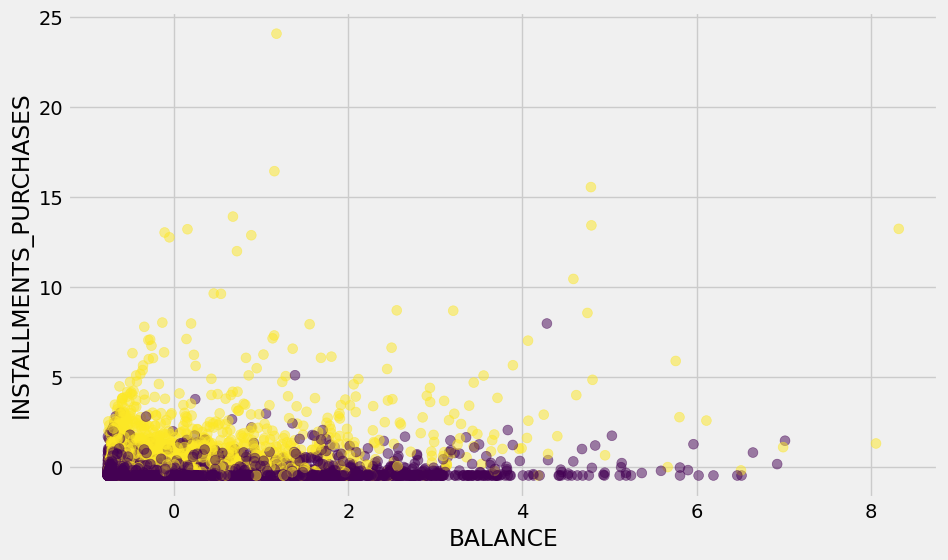

In [108]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['INSTALLMENTS_PURCHASES'], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('INSTALLMENTS_PURCHASES')
plt.show()

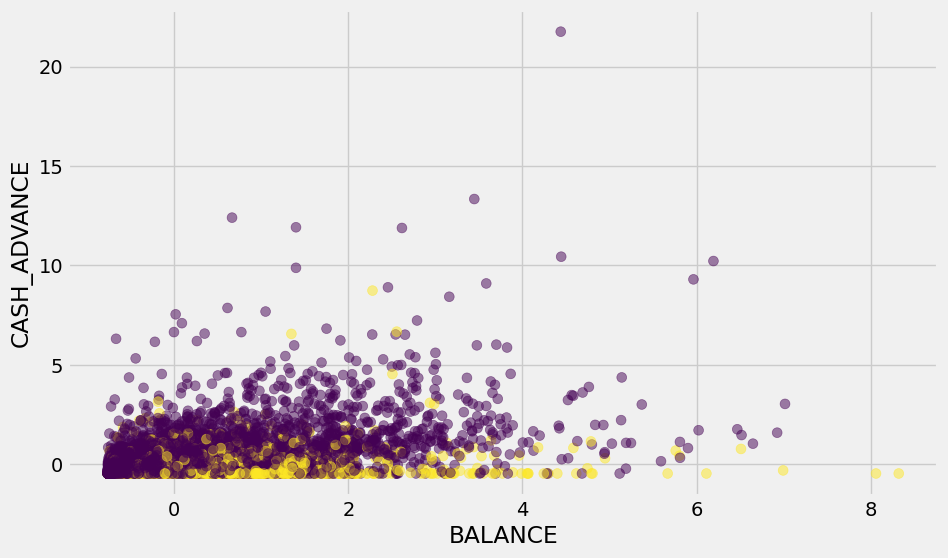

In [109]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE'], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE')
plt.show()

/Users/home/Documents/Computer Science/AI(JupyterNoteBook)/Machine Learning/Unsupervised Lerning/venv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


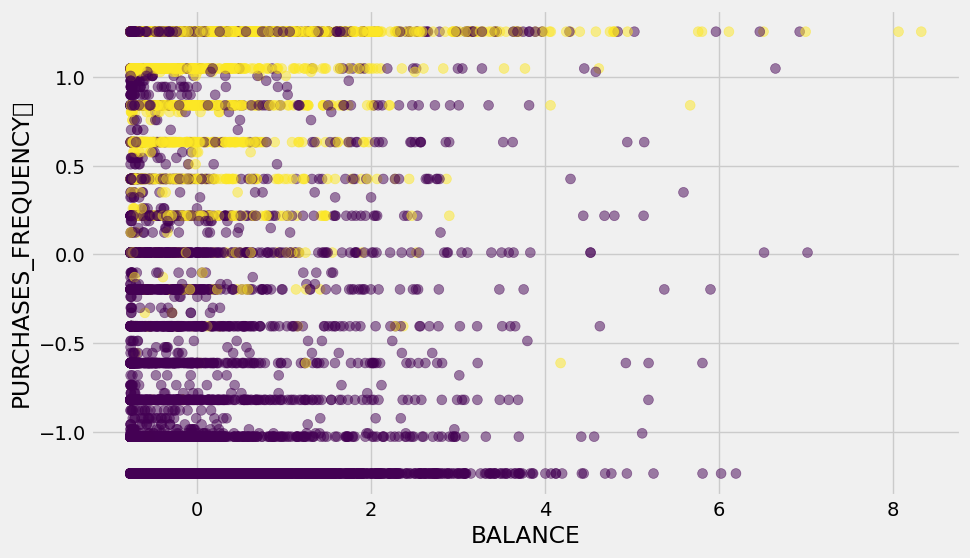

In [110]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_FREQUENCY\t'], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_FREQUENCY\t')
plt.show()

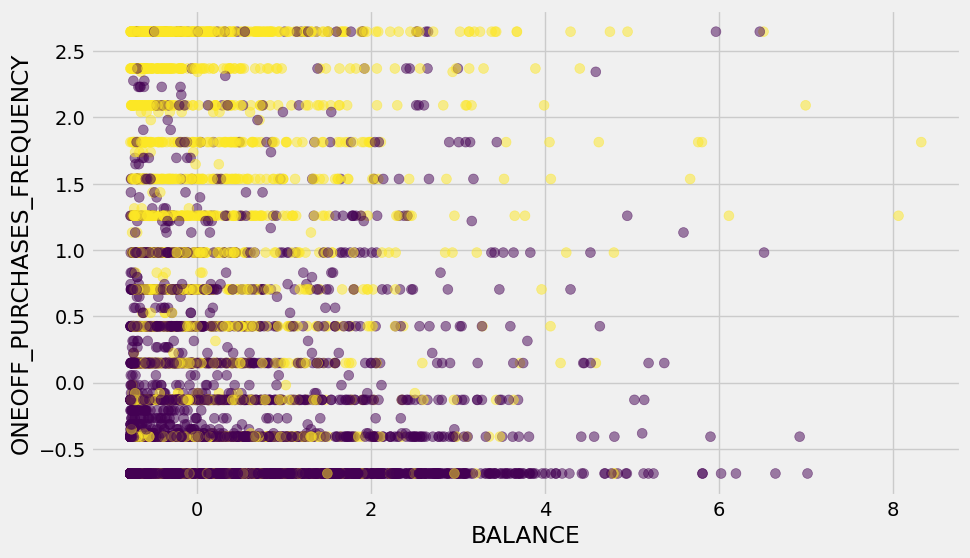

In [111]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['ONEOFF_PURCHASES_FREQUENCY'], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('ONEOFF_PURCHASES_FREQUENCY')
plt.show()

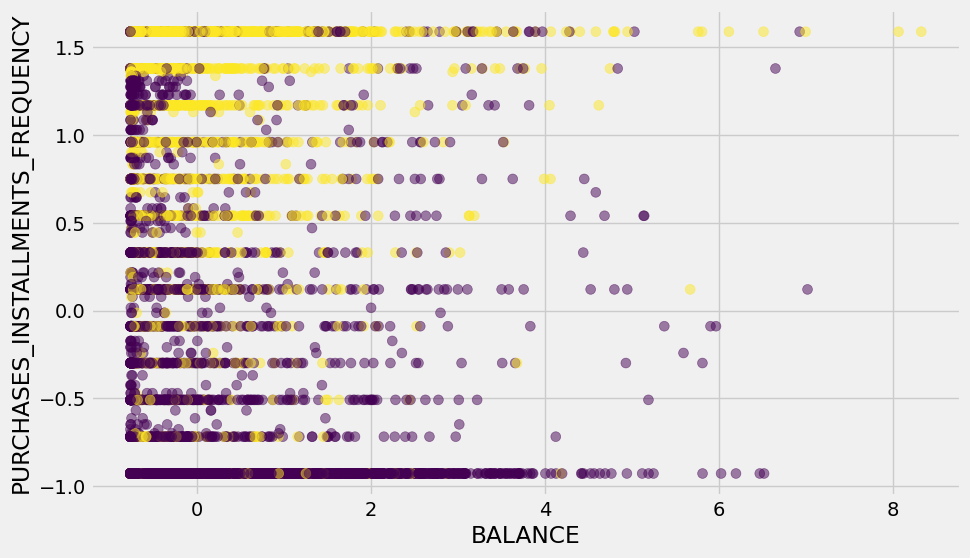

In [112]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_INSTALLMENTS_FREQUENCY'], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_INSTALLMENTS_FREQUENCY')
plt.show()

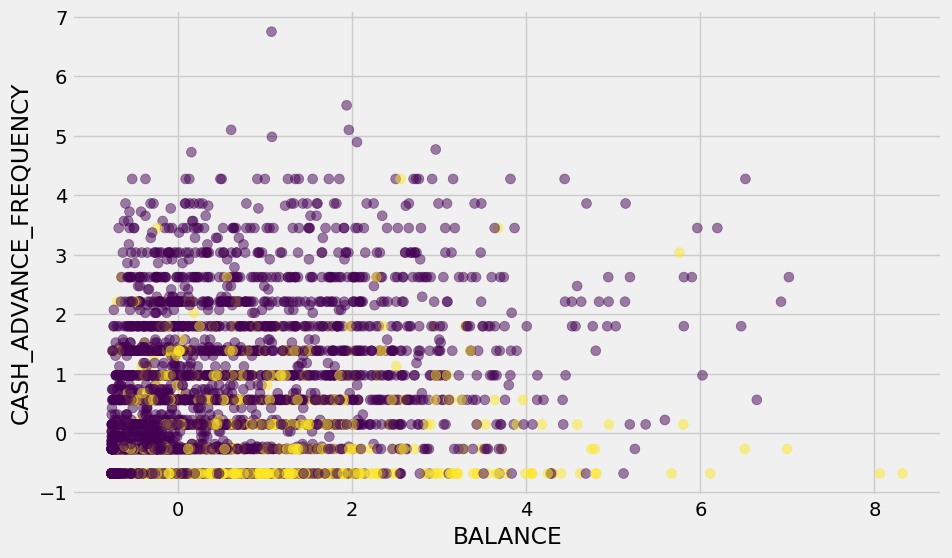

In [113]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE_FREQUENCY'], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE_FREQUENCY')
plt.show()

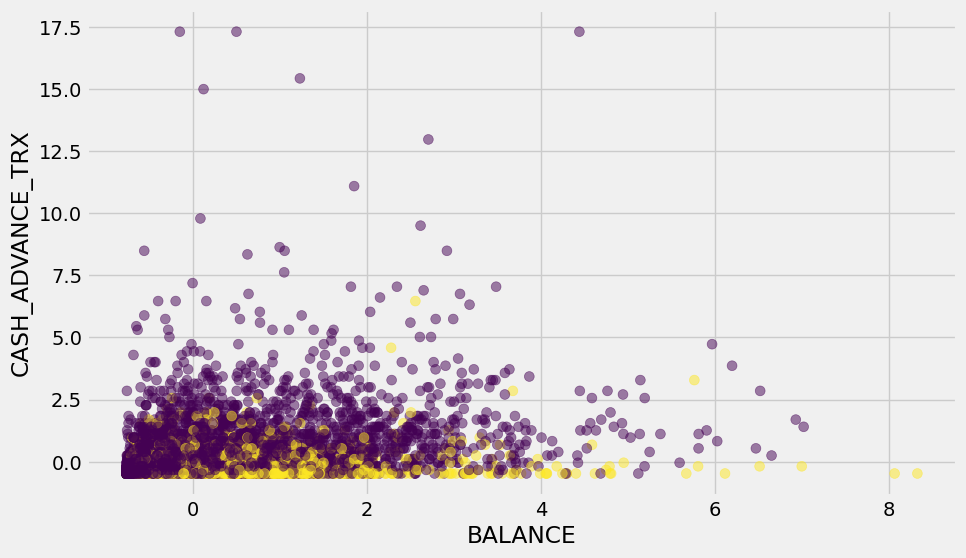

In [114]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE_TRX'], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE_TRX')
plt.show()

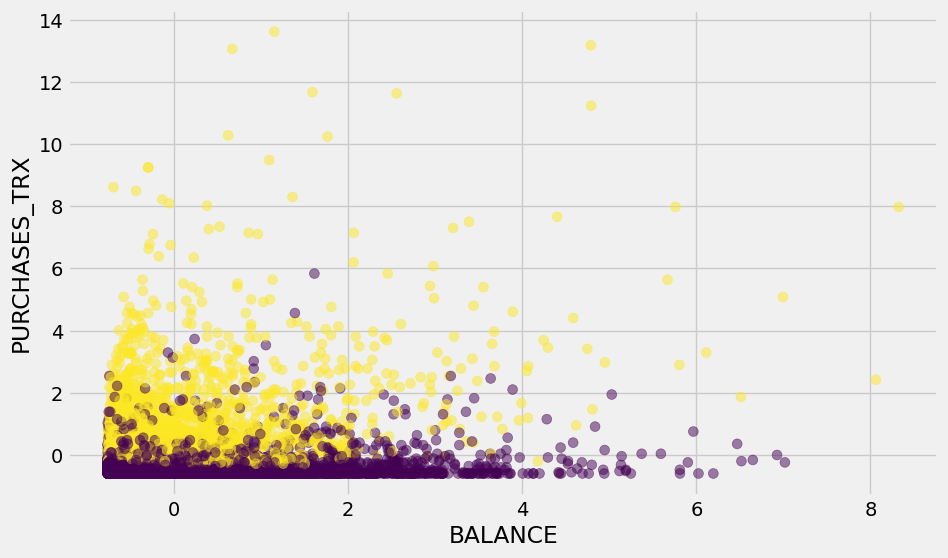

In [115]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_TRX'], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_TRX')
plt.show()

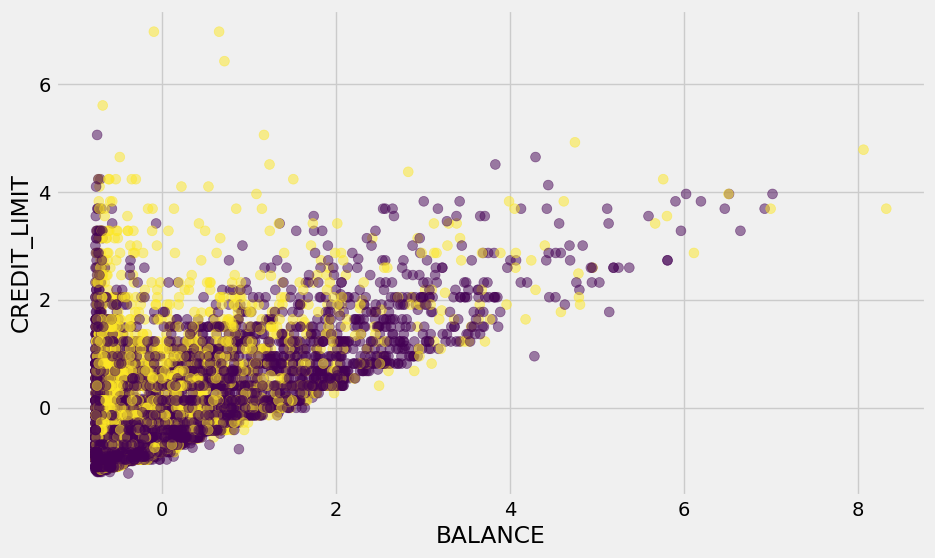

In [116]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CREDIT_LIMIT'], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('CREDIT_LIMIT')
plt.show()

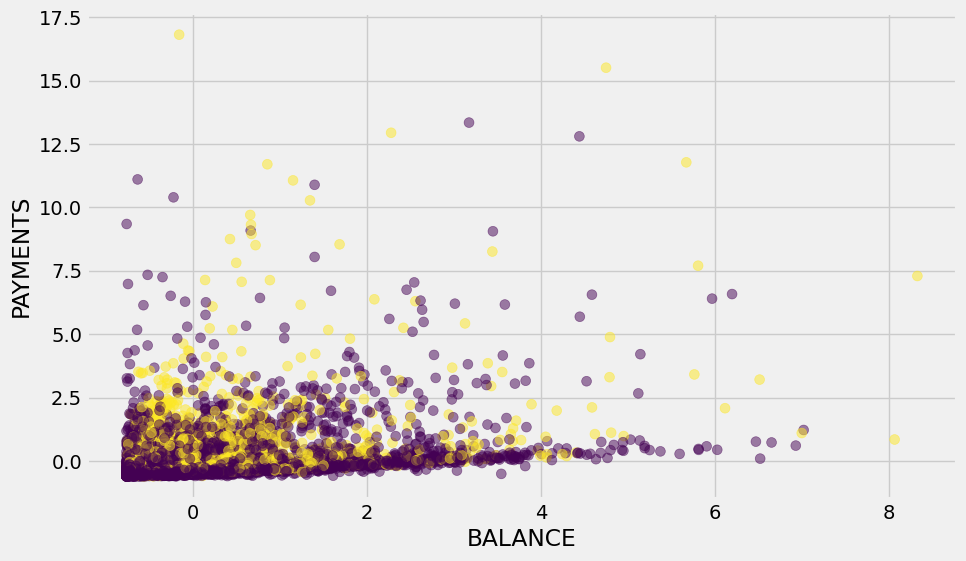

In [117]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PAYMENTS'], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PAYMENTS')
plt.show()

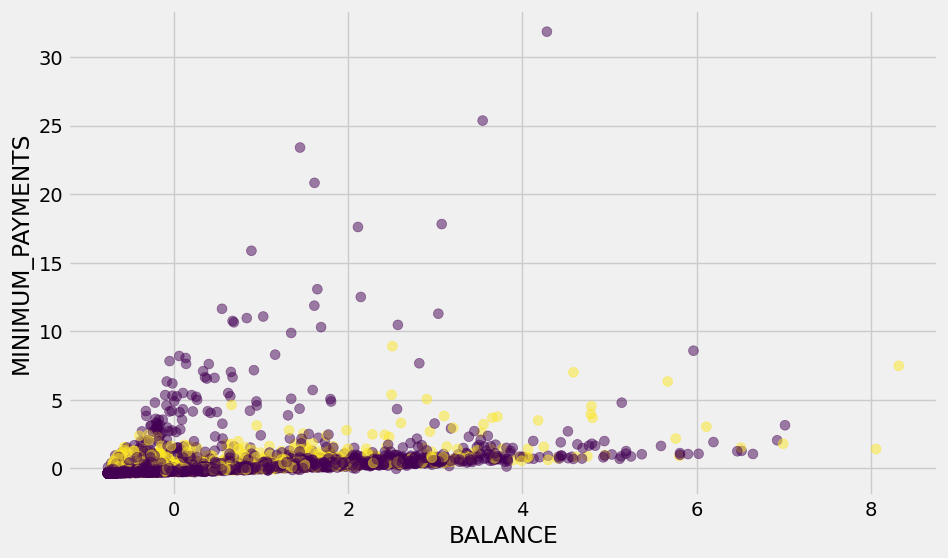

In [118]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['MINIMUM_PAYMENTS'], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('MINIMUM_PAYMENTS')
plt.show()

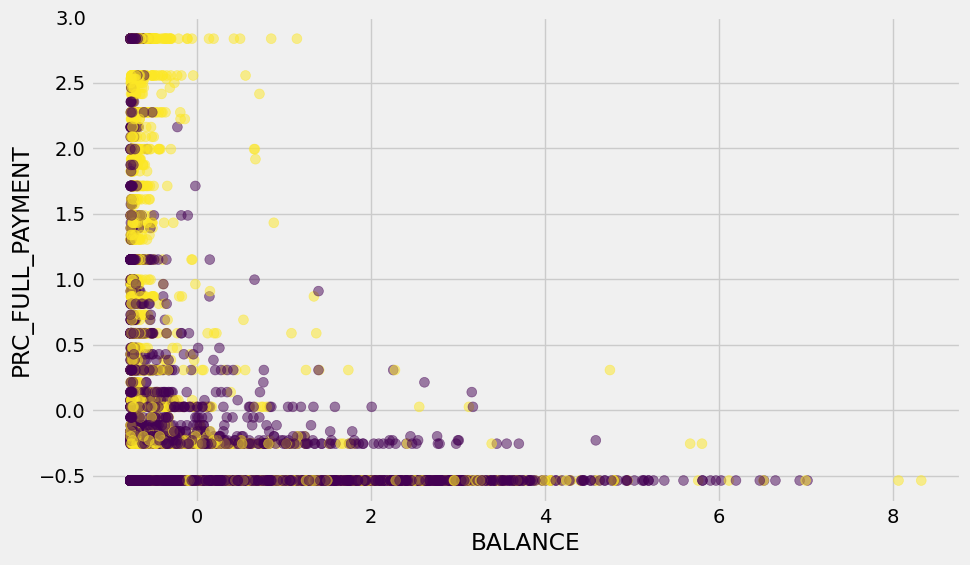

In [119]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PRC_FULL_PAYMENT'], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PRC_FULL_PAYMENT')
plt.show()

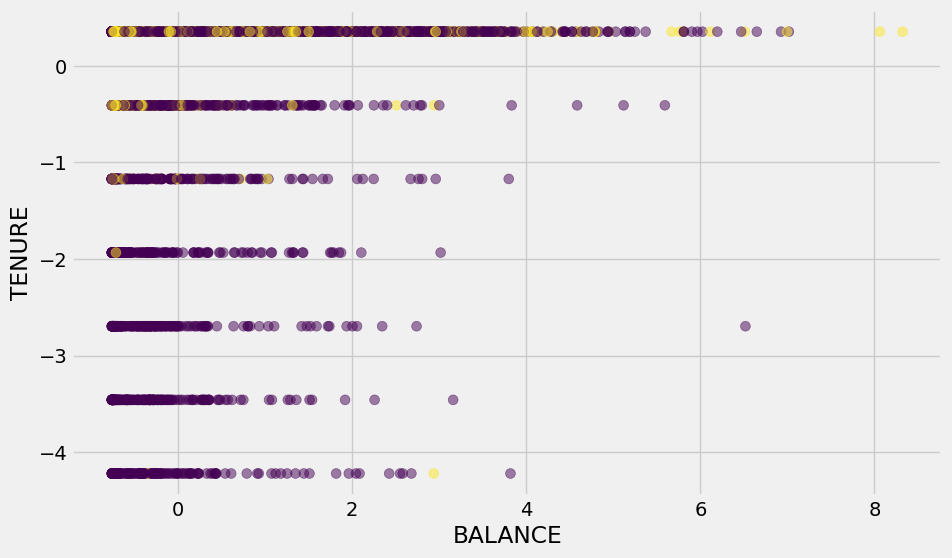

In [120]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['TENURE'], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('TENURE')
plt.show()

## DBSCAN model

In [122]:
model_DBSCAN1 = DBSCAN()
model_DBSCAN1.fit(X_train)
# pred_DBSCAN = model_DBSCAN1.predict(X_test)

DBSCAN()

In [123]:
model_DBSCAN = DBSCAN()

model_DBSCAN.fit(df4)

DBSCAN()

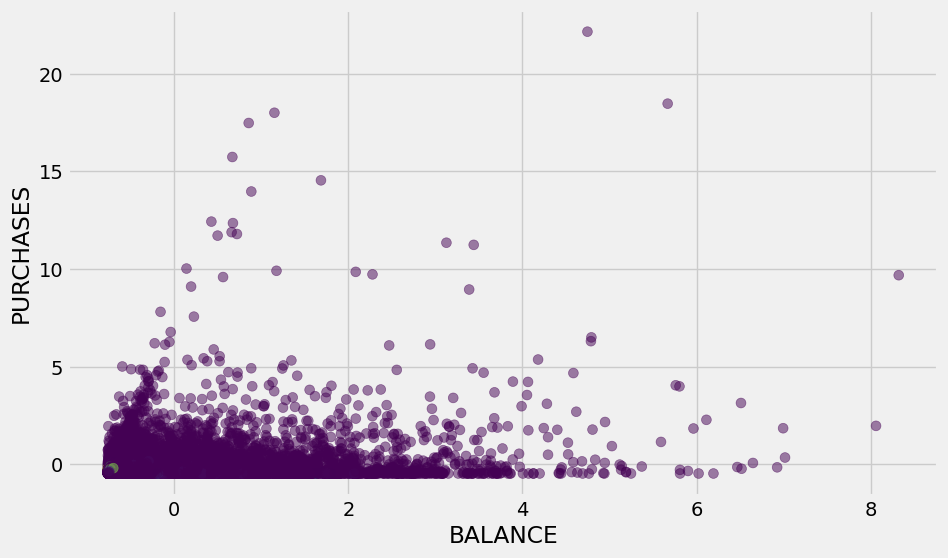

In [124]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES'], c=model_DBSCAN.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES')
plt.show()

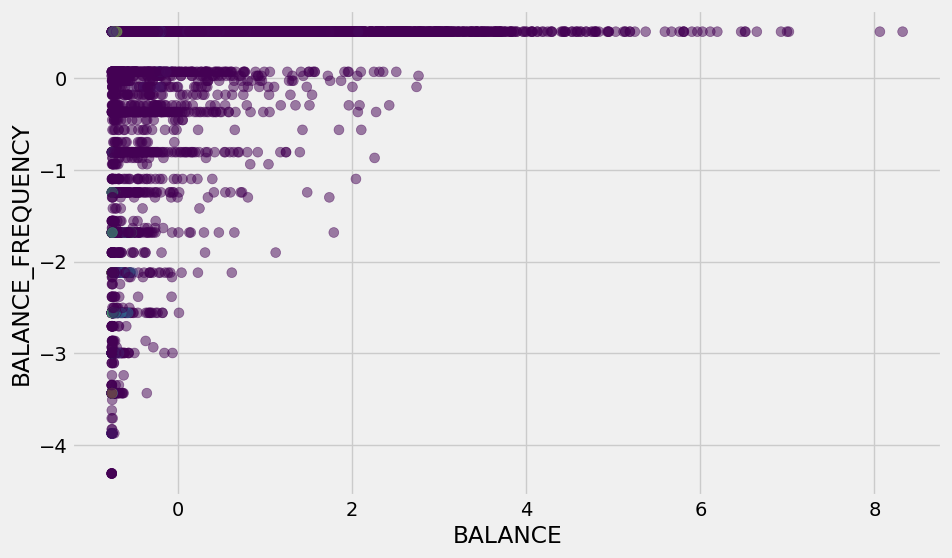

In [125]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['BALANCE_FREQUENCY'], c=model_DBSCAN.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('BALANCE_FREQUENCY')
plt.show()

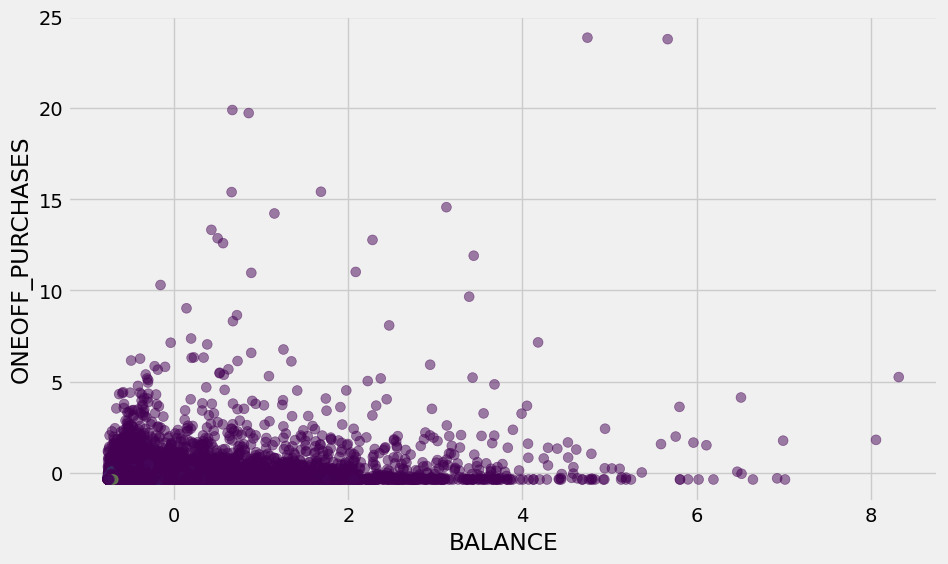

In [126]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['ONEOFF_PURCHASES'], c=model_DBSCAN.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('ONEOFF_PURCHASES')
plt.show()

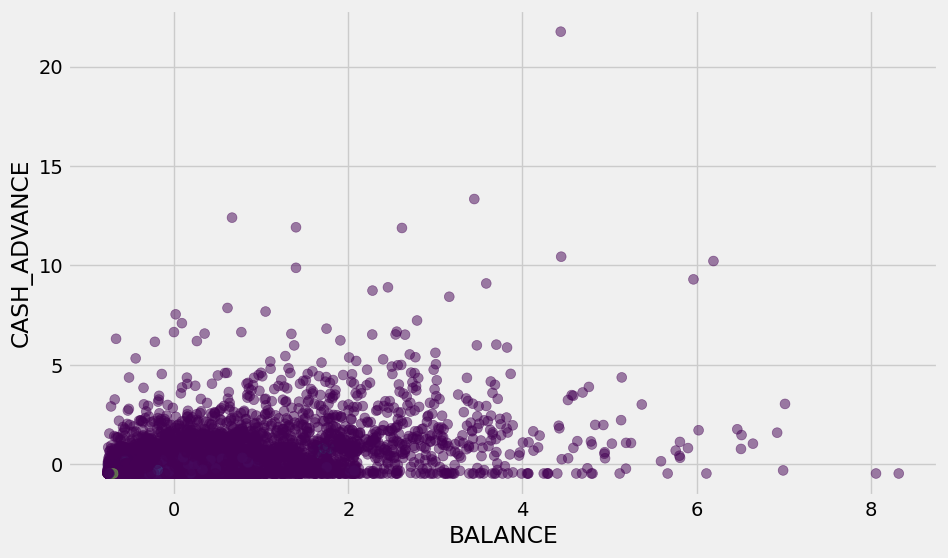

In [127]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE'], c=model_DBSCAN.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE')
plt.show()

/Users/home/Documents/Computer Science/AI(JupyterNoteBook)/Machine Learning/Unsupervised Lerning/venv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


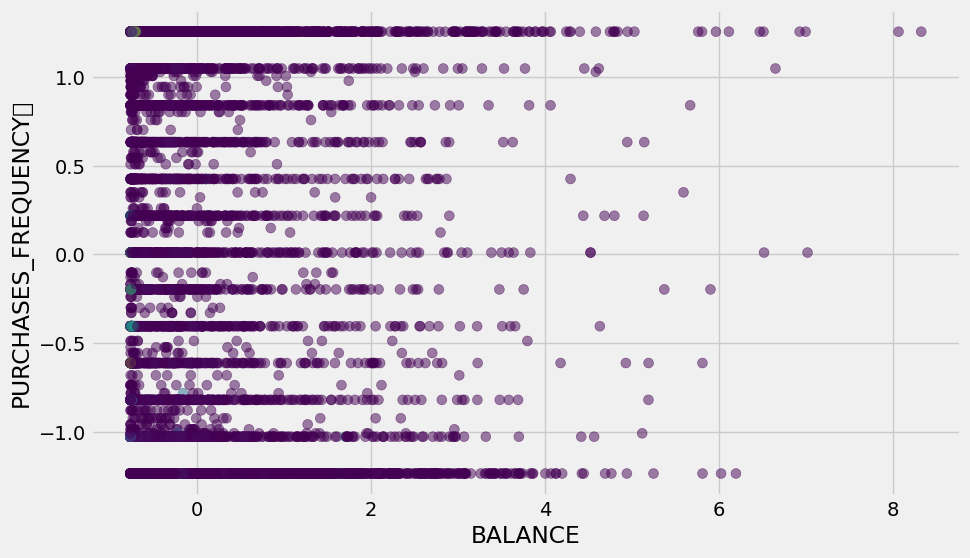

In [128]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_FREQUENCY\t'], c=model_DBSCAN.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_FREQUENCY\t')
plt.show()

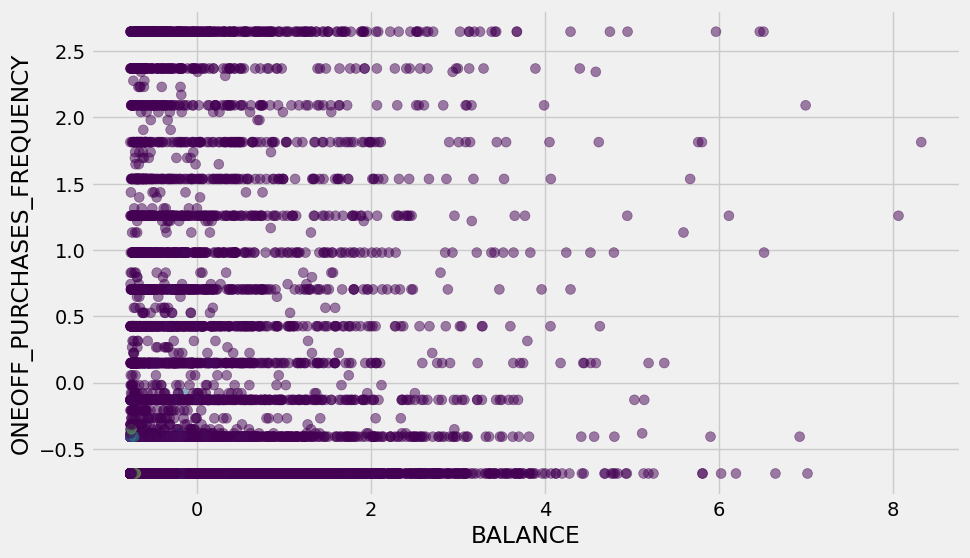

In [129]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['ONEOFF_PURCHASES_FREQUENCY'], c=model_DBSCAN.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('ONEOFF_PURCHASES_FREQUENCY')
plt.show()

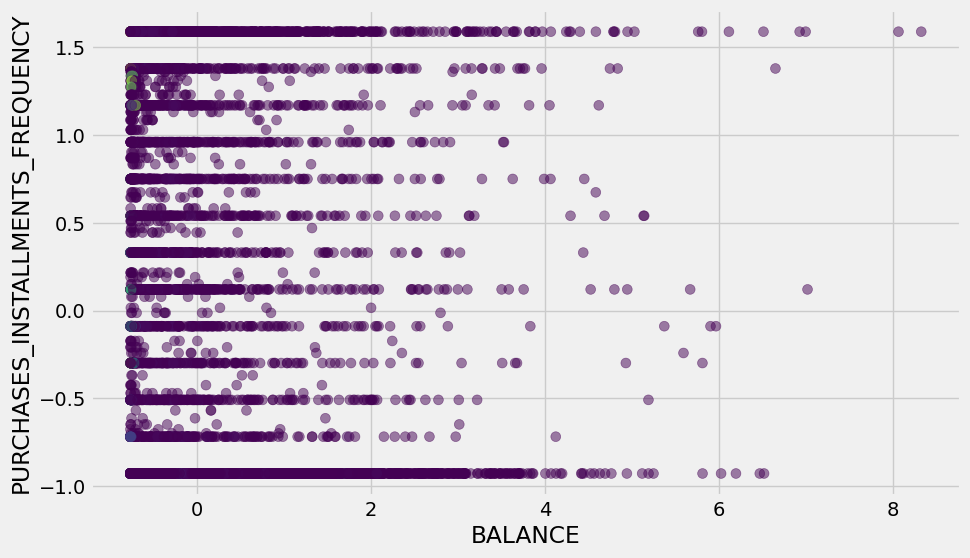

In [130]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_INSTALLMENTS_FREQUENCY'], c=model_DBSCAN.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_INSTALLMENTS_FREQUENCY')
plt.show()

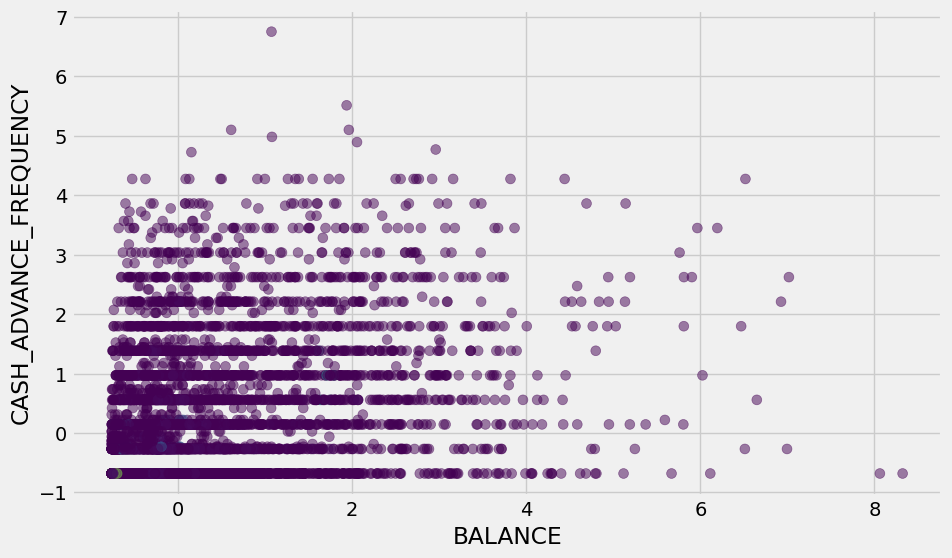

In [131]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE_FREQUENCY'], c=model_DBSCAN.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE_FREQUENCY')
plt.show()

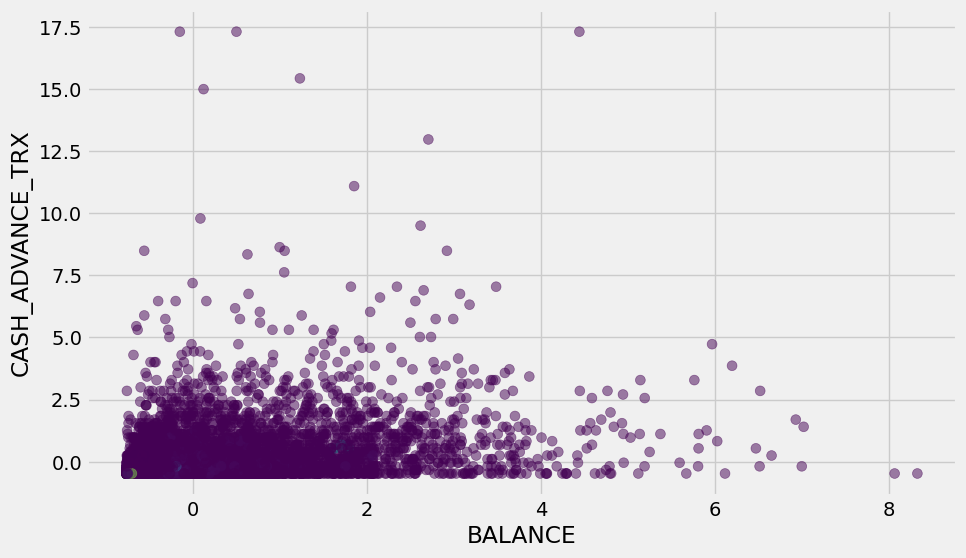

In [132]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE_TRX'], c=model_DBSCAN.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE_TRX')
plt.show()

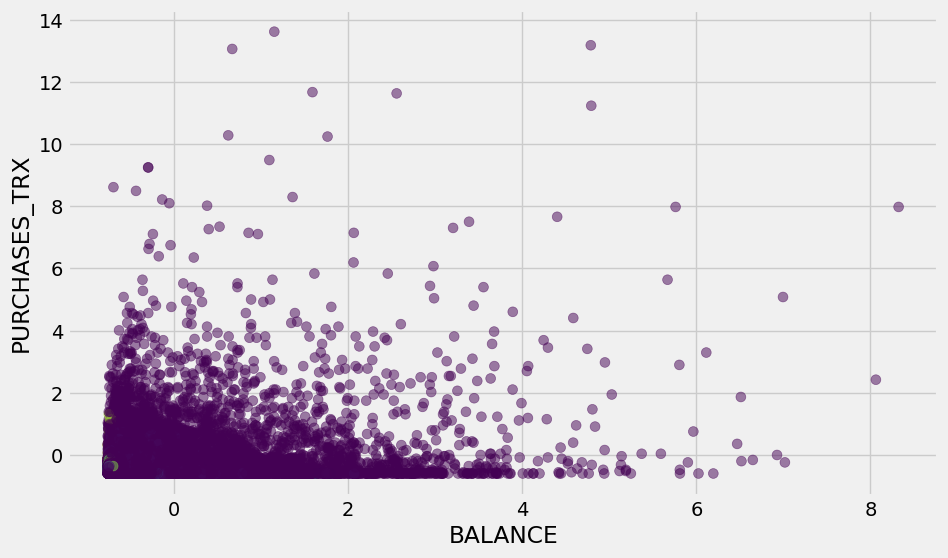

In [133]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_TRX'], c=model_DBSCAN.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_TRX')
plt.show()

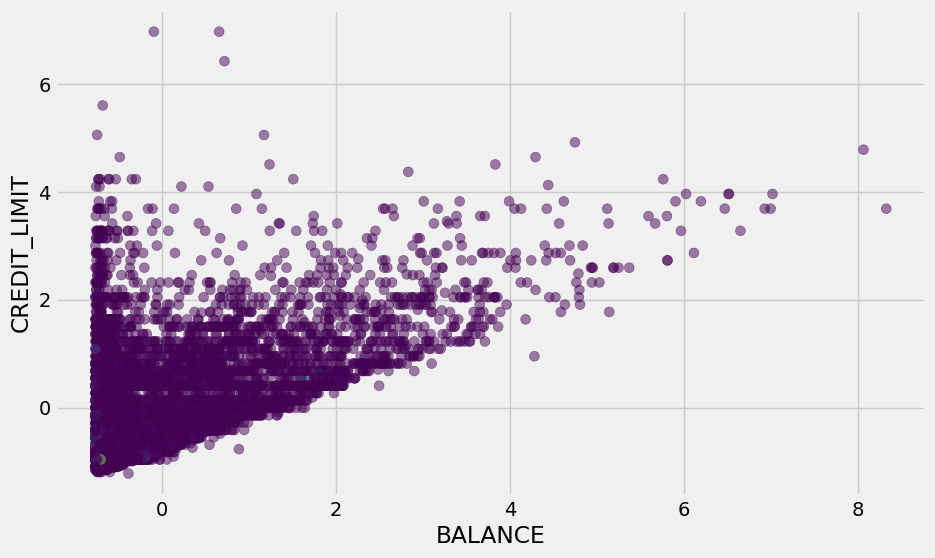

In [134]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CREDIT_LIMIT'], c=model_DBSCAN.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('CREDIT_LIMIT')
plt.show()

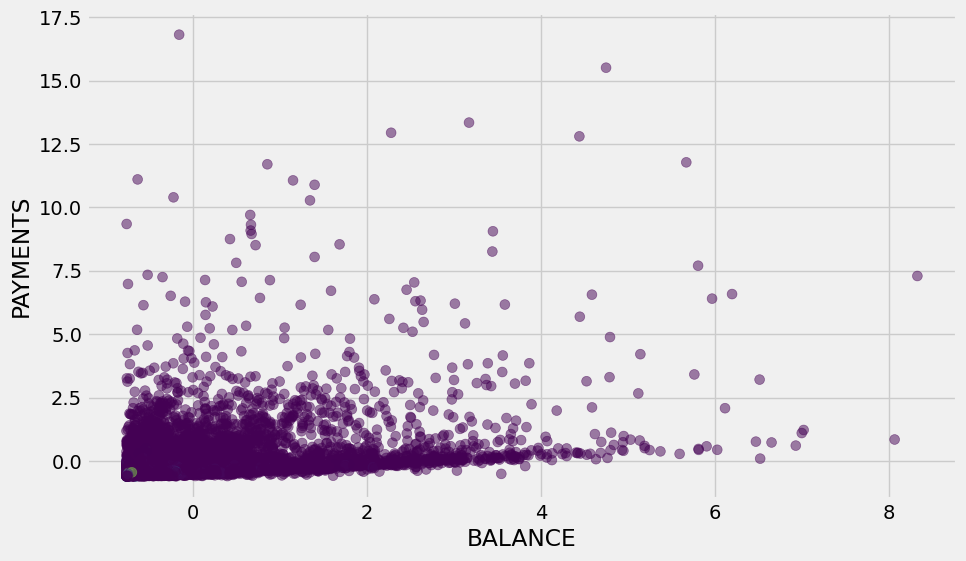

In [135]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PAYMENTS'], c=model_DBSCAN.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PAYMENTS')
plt.show()

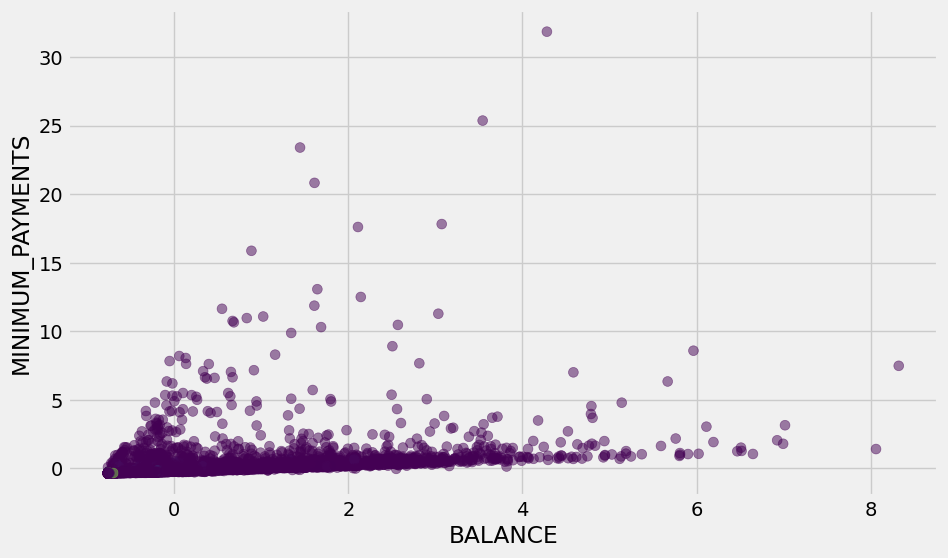

In [136]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['MINIMUM_PAYMENTS'], c=model_DBSCAN.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('MINIMUM_PAYMENTS')
plt.show()

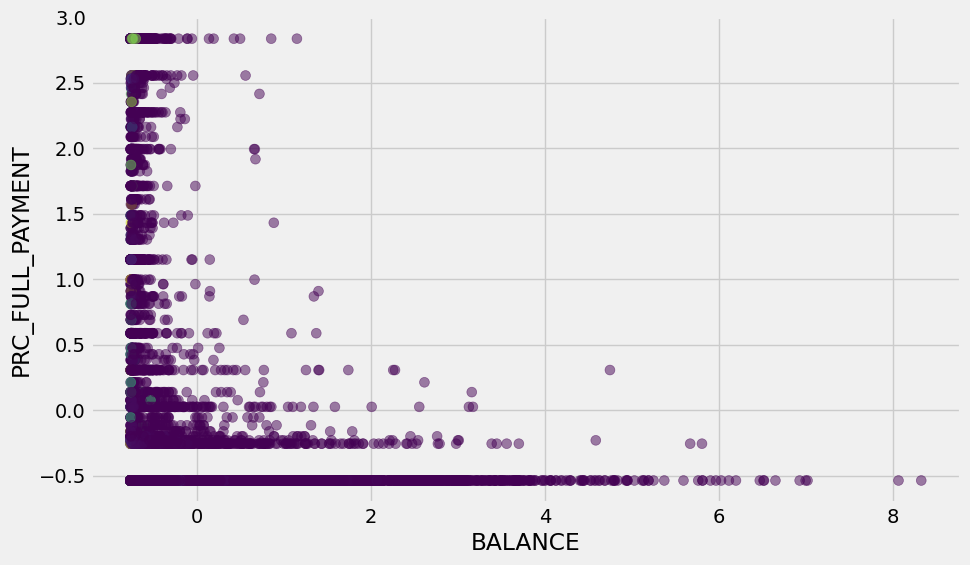

In [137]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PRC_FULL_PAYMENT'], c=model_DBSCAN.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PRC_FULL_PAYMENT')
plt.show()

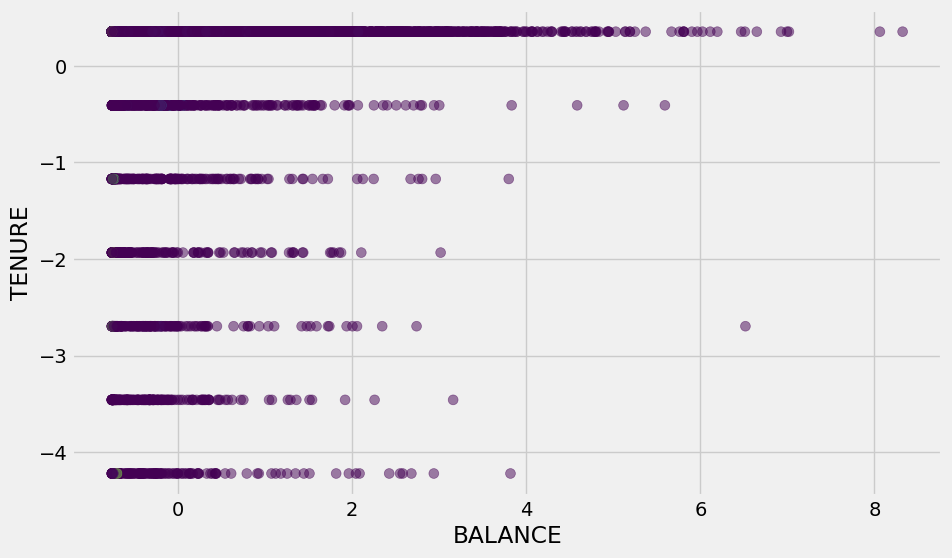

In [138]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['TENURE'], c=model_DBSCAN.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('TENURE')
plt.show()

## OPTICS Model

In [140]:
model_OPTICS1 = OPTICS()
model_OPTICS1.fit(X_train)
# pred_OPTICS =  model_OPTICS1.predict(X_test)

OPTICS()

In [141]:
model_OPTICS = OPTICS()

model_OPTICS.fit(df4)

OPTICS()

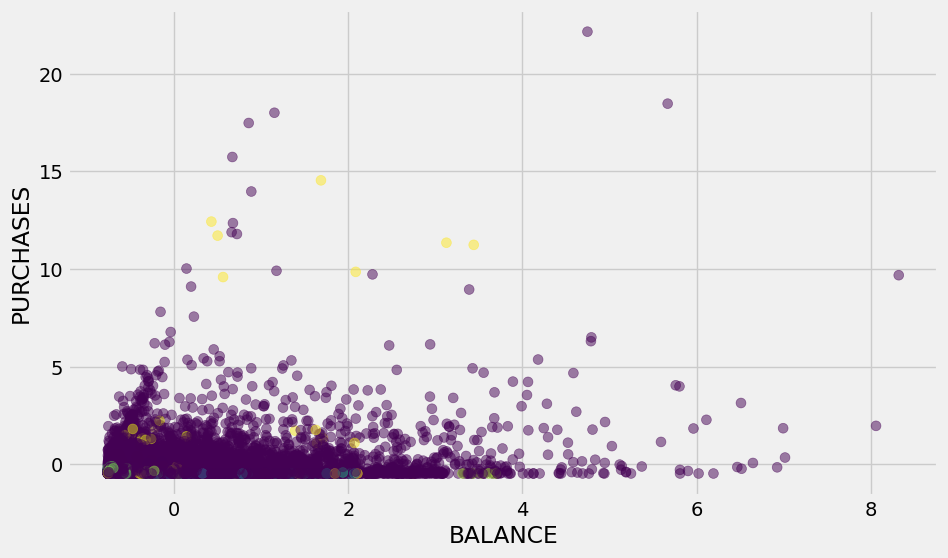

In [142]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES'], c=model_OPTICS.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES')
plt.show()

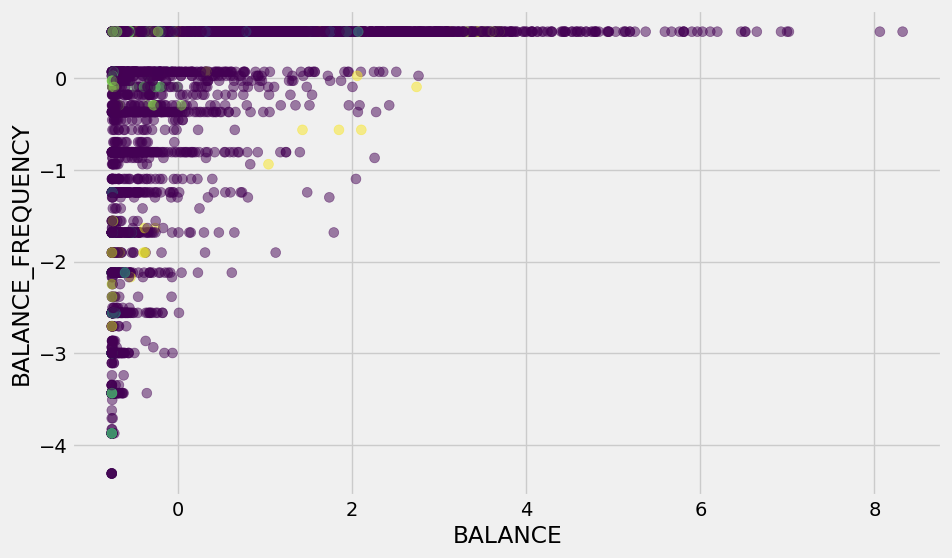

In [143]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['BALANCE_FREQUENCY'], c=model_OPTICS.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('BALANCE_FREQUENCY')
plt.show()

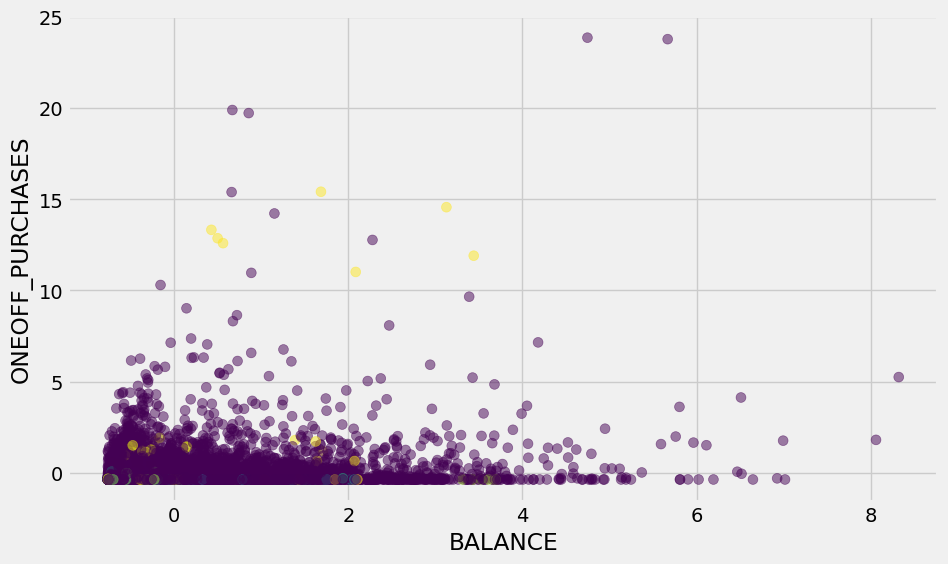

In [144]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['ONEOFF_PURCHASES'], c=model_OPTICS.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('ONEOFF_PURCHASES')
plt.show()

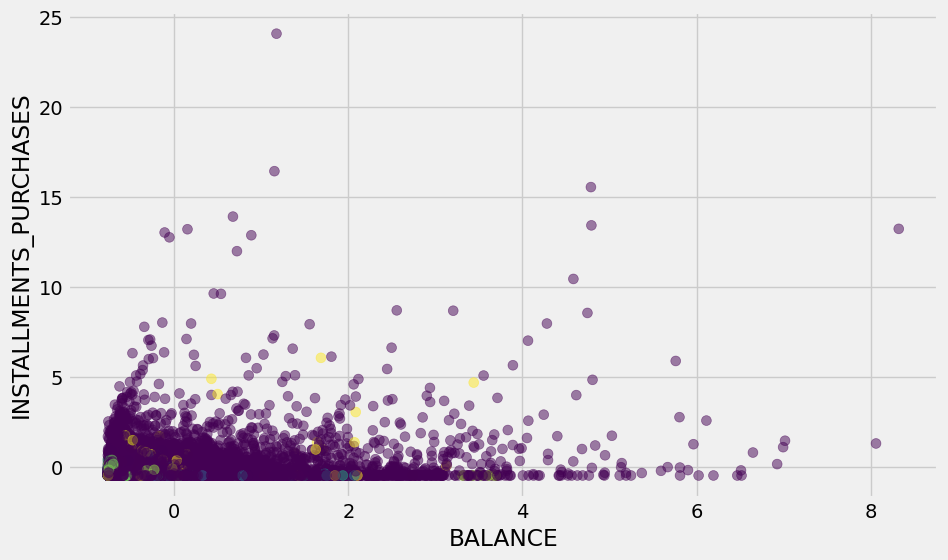

In [145]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['INSTALLMENTS_PURCHASES'], c=model_OPTICS.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('INSTALLMENTS_PURCHASES')
plt.show()

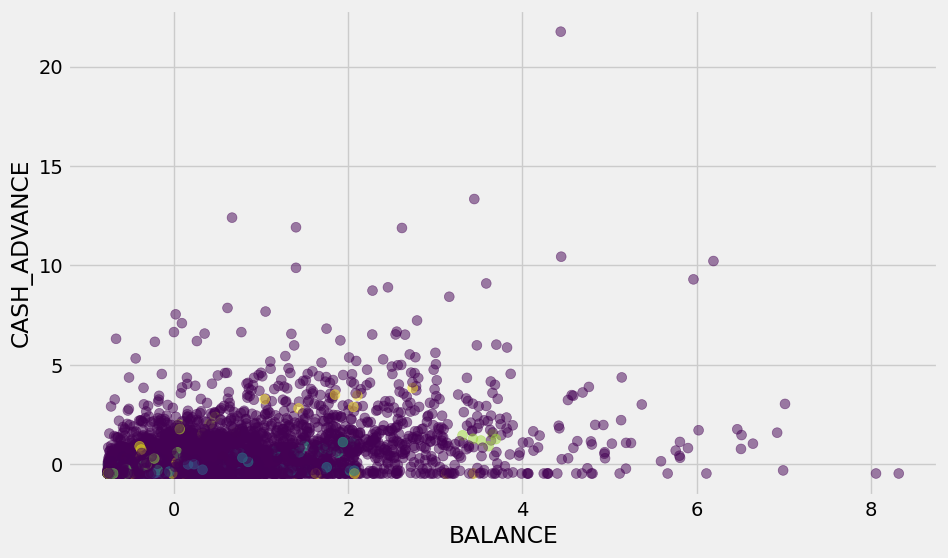

In [146]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE'], c=model_OPTICS.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE')
plt.show()

/Users/home/Documents/Computer Science/AI(JupyterNoteBook)/Machine Learning/Unsupervised Lerning/venv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


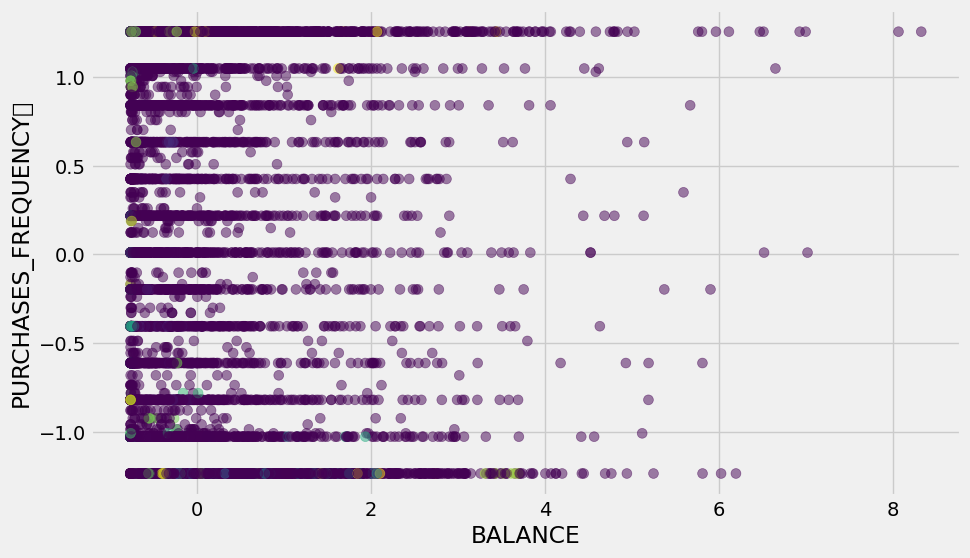

In [147]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_FREQUENCY\t'], c=model_OPTICS.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_FREQUENCY\t')
plt.show()

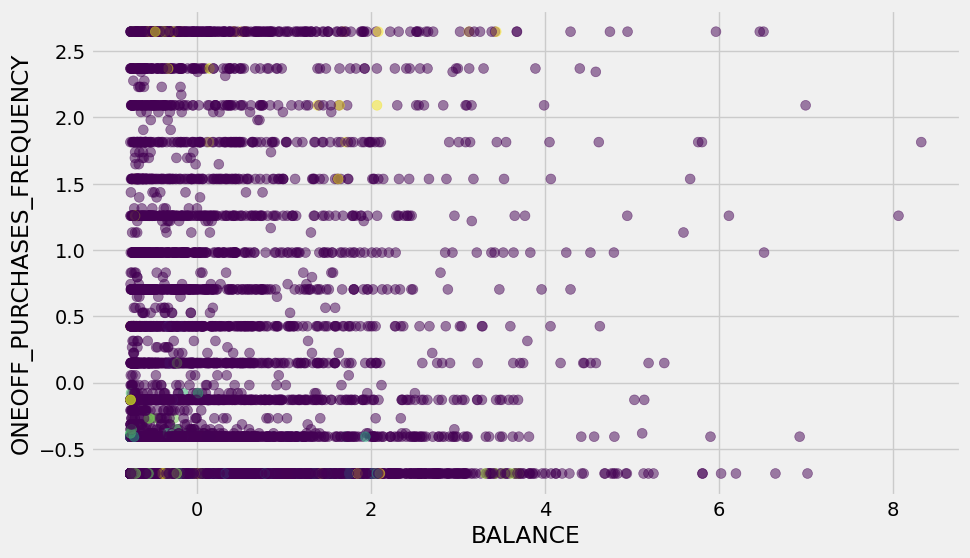

In [148]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['ONEOFF_PURCHASES_FREQUENCY'], c=model_OPTICS.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('ONEOFF_PURCHASES_FREQUENCY')
plt.show()

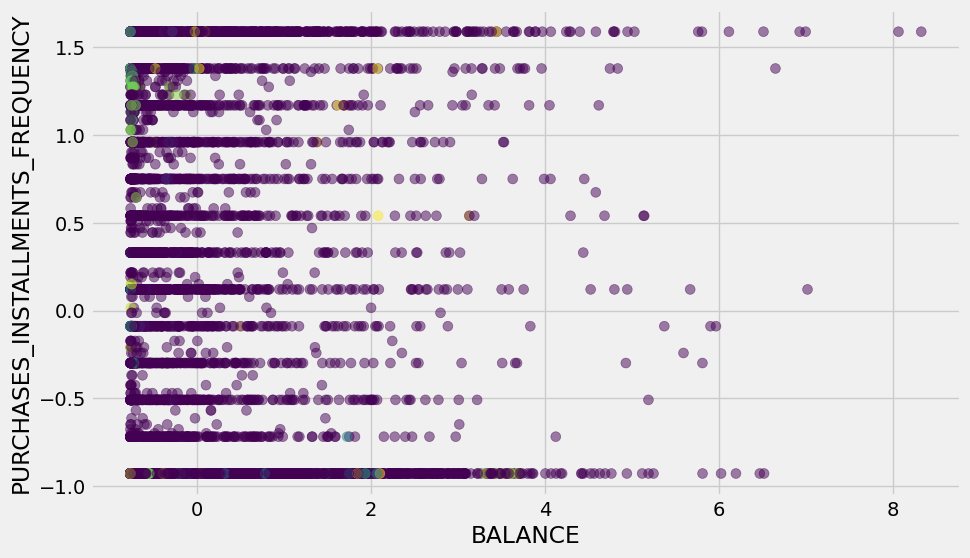

In [149]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_INSTALLMENTS_FREQUENCY'], c=model_OPTICS.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_INSTALLMENTS_FREQUENCY')
plt.show()

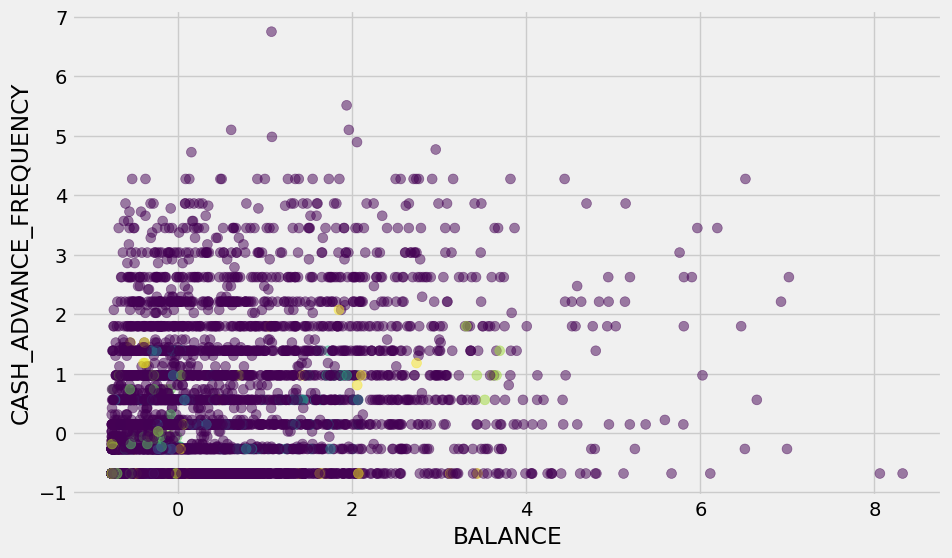

In [150]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE_FREQUENCY'], c=model_OPTICS.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE_FREQUENCY')
plt.show()

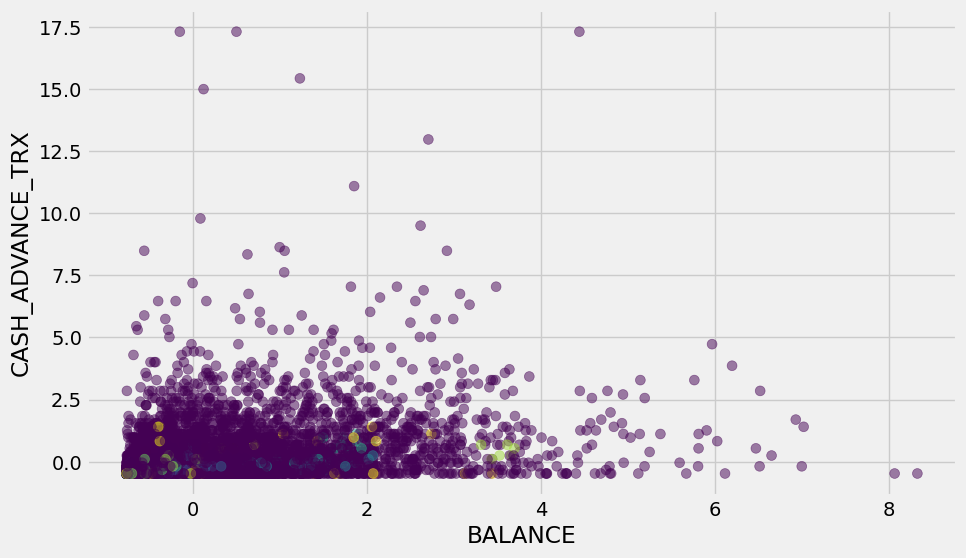

In [151]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE_TRX'], c=model_OPTICS.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE_TRX')
plt.show()

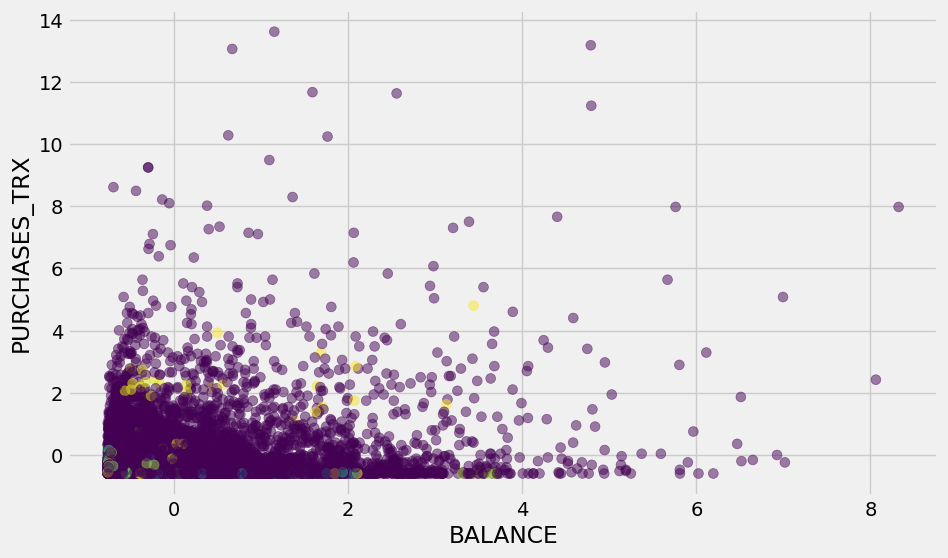

In [152]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_TRX'], c=model_OPTICS.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_TRX')
plt.show()

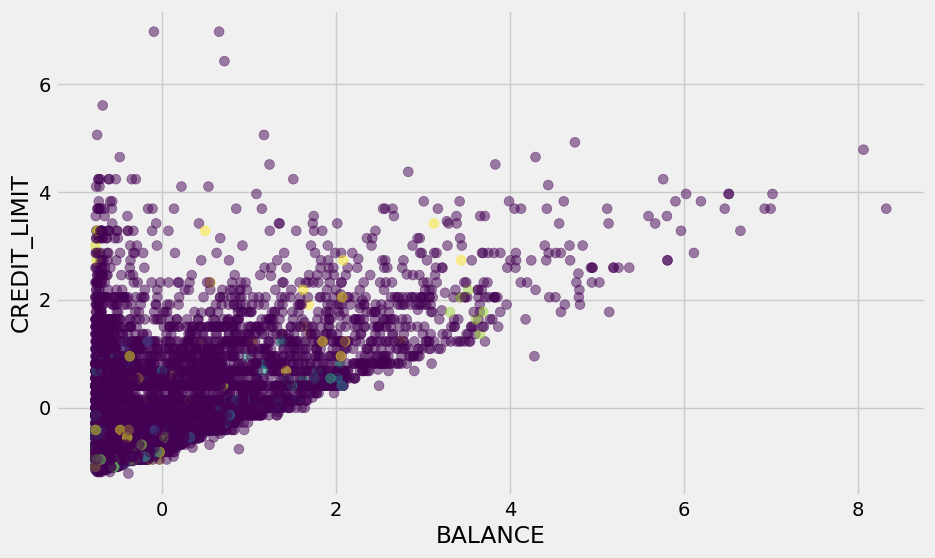

In [153]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CREDIT_LIMIT'], c=model_OPTICS.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('CREDIT_LIMIT')
plt.show()

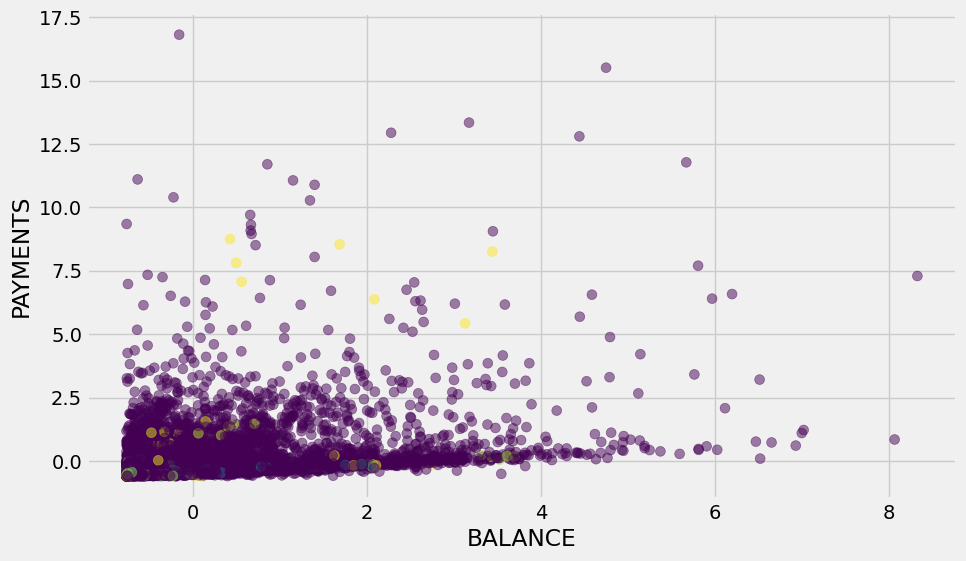

In [154]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PAYMENTS'], c=model_OPTICS.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PAYMENTS')
plt.show()

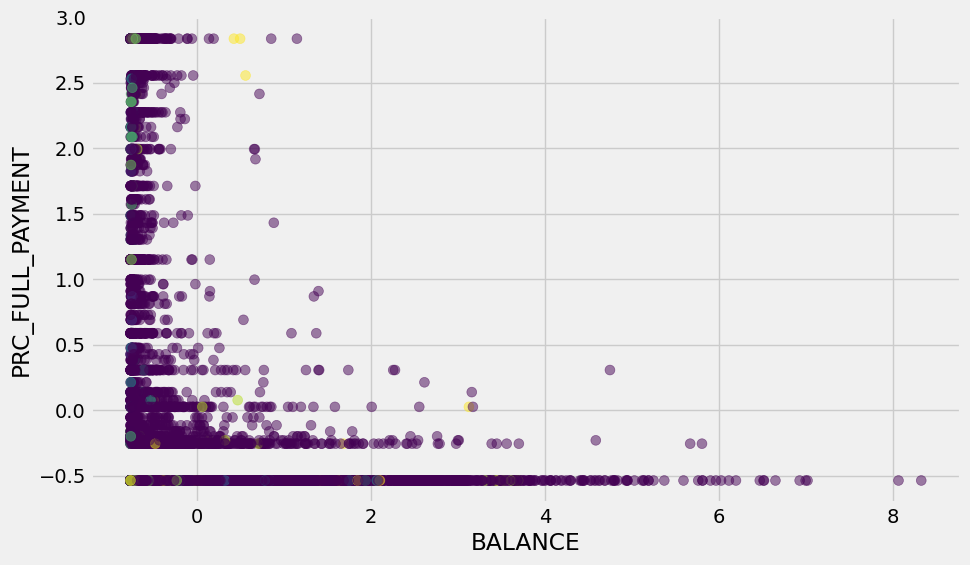

In [155]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PRC_FULL_PAYMENT'], c=model_OPTICS.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PRC_FULL_PAYMENT')
plt.show()

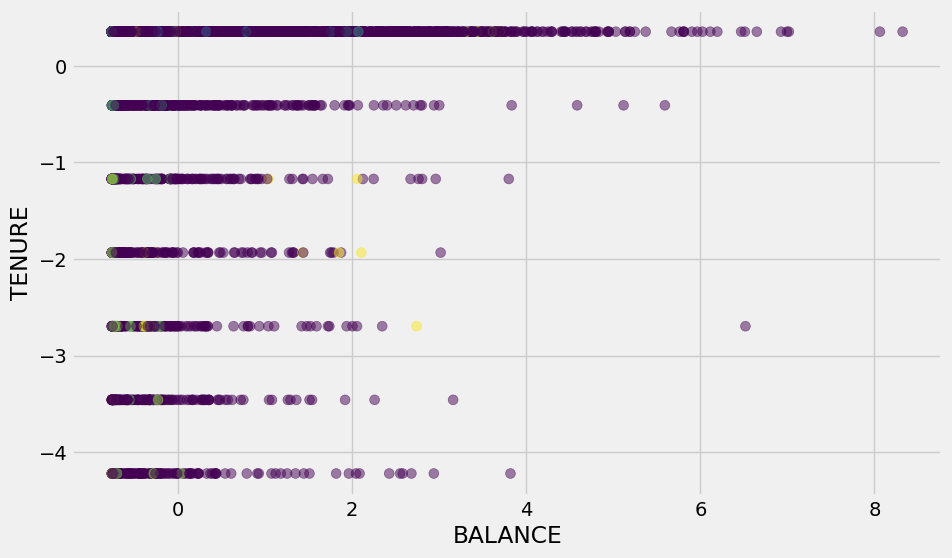

In [156]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['TENURE'], c=model_OPTICS.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('TENURE')
plt.show()

## Birch Model

In [157]:
model_Birch1 = Birch()
model_Birch1.fit(X_train)
pred_Birch =  model_Birch1.predict(X_test)

In [158]:
model_Birch = Birch()

model_Birch.fit(df4)

Birch()

## بررسی تاثیر مدل و خوشه بندی دیتاست مورد نظر

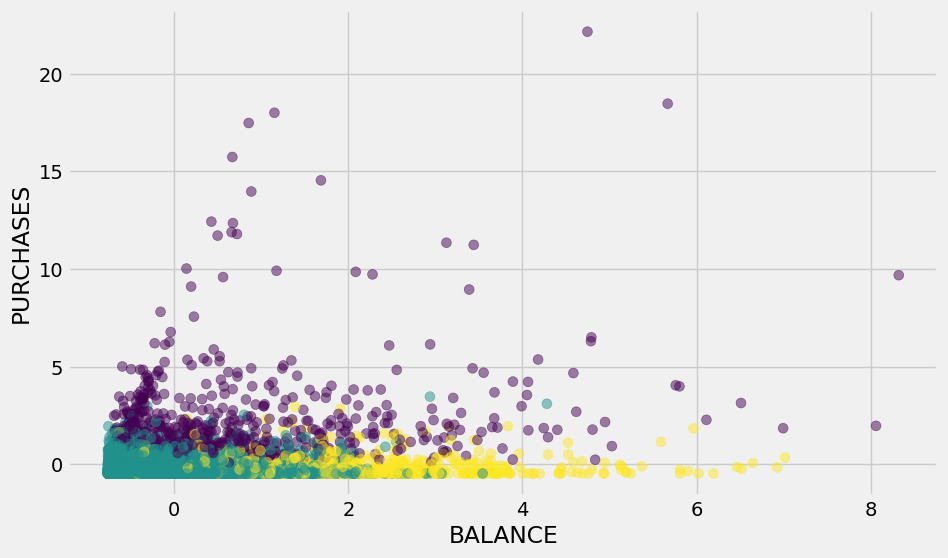

In [159]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES'], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES')
plt.show()

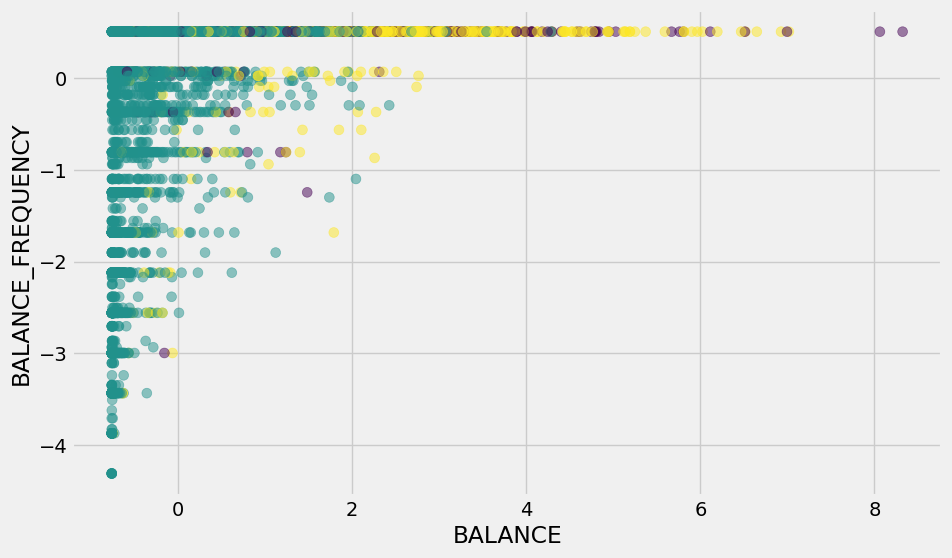

In [160]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['BALANCE_FREQUENCY'], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('BALANCE_FREQUENCY')
plt.show()

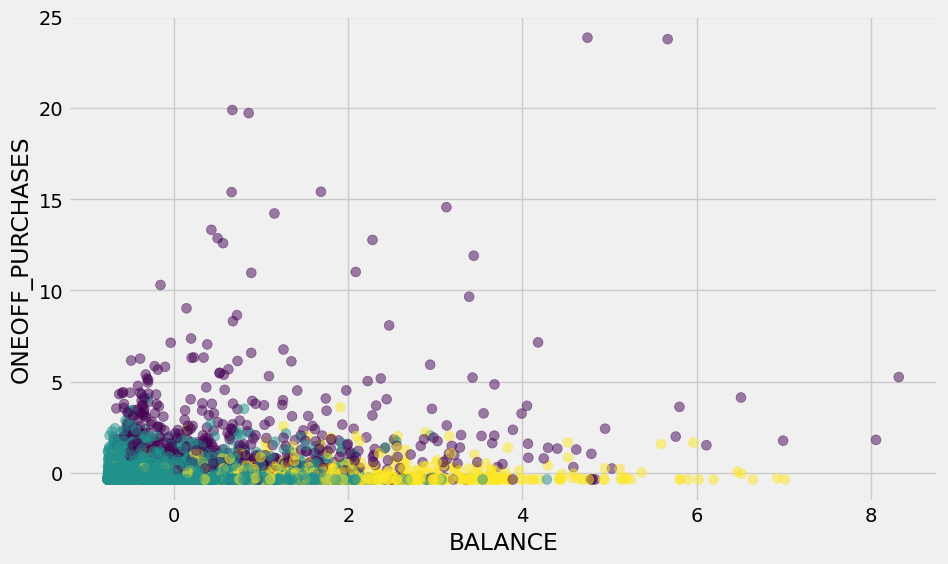

In [161]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['ONEOFF_PURCHASES'], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('ONEOFF_PURCHASES')
plt.show()

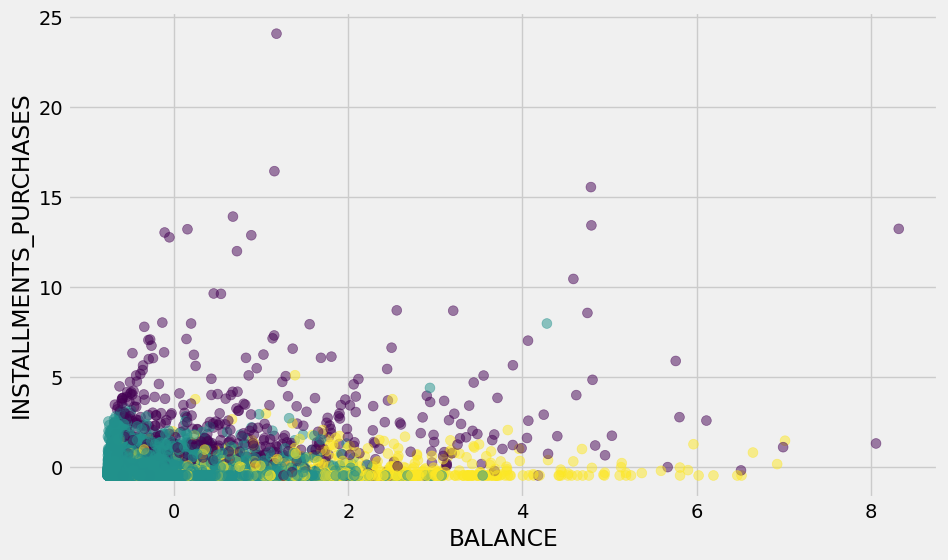

In [162]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['INSTALLMENTS_PURCHASES'], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('INSTALLMENTS_PURCHASES')
plt.show()

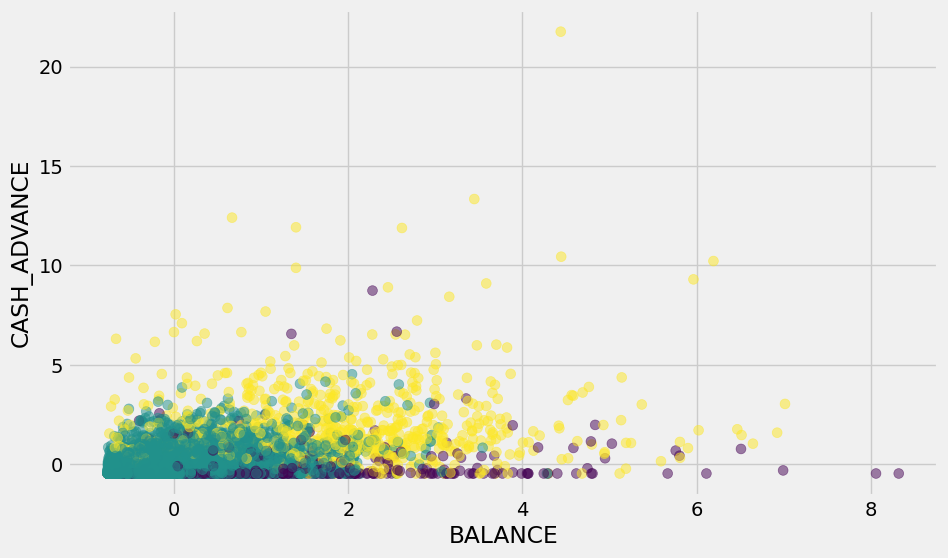

In [163]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE'], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE')
plt.show()

/Users/home/Documents/Computer Science/AI(JupyterNoteBook)/Machine Learning/Unsupervised Lerning/venv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


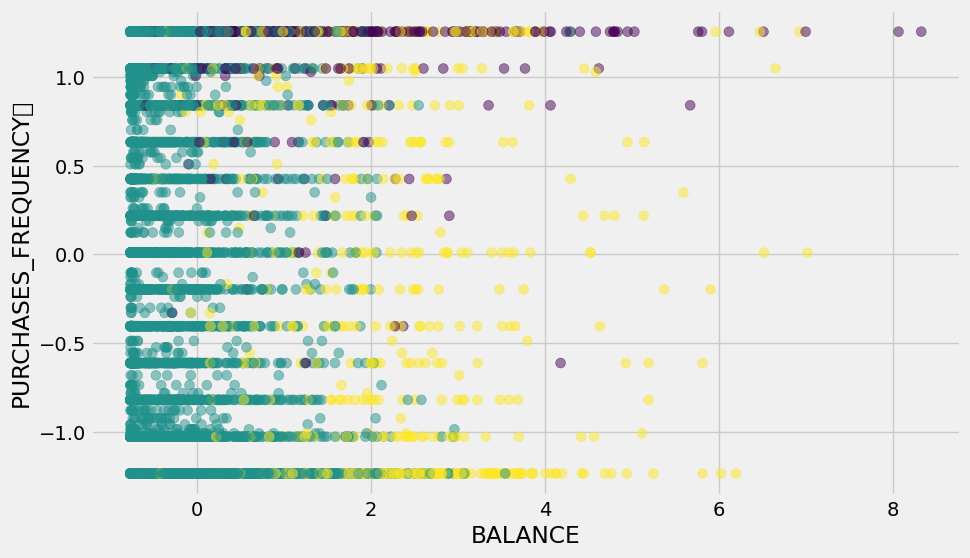

In [164]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_FREQUENCY\t'], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_FREQUENCY\t')
plt.show()

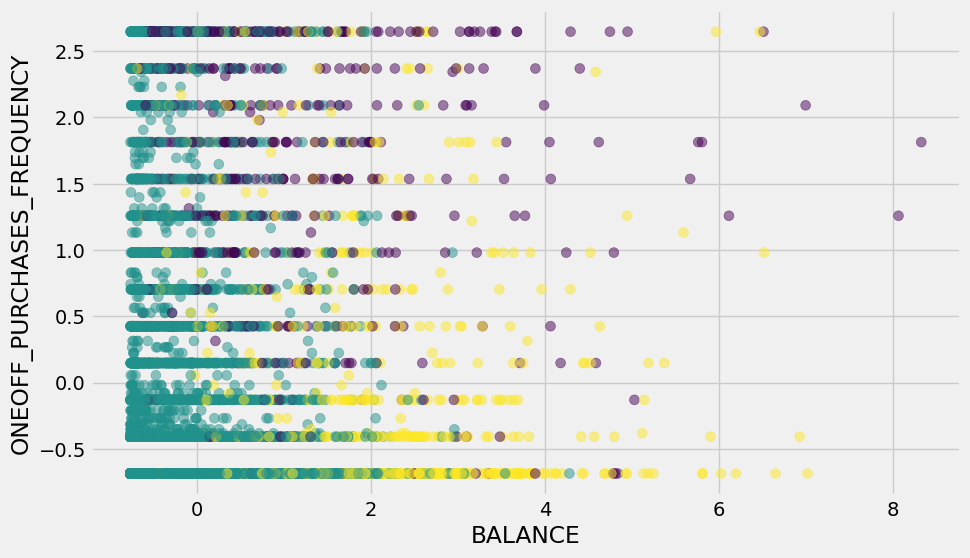

In [165]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['ONEOFF_PURCHASES_FREQUENCY'], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('ONEOFF_PURCHASES_FREQUENCY')
plt.show()

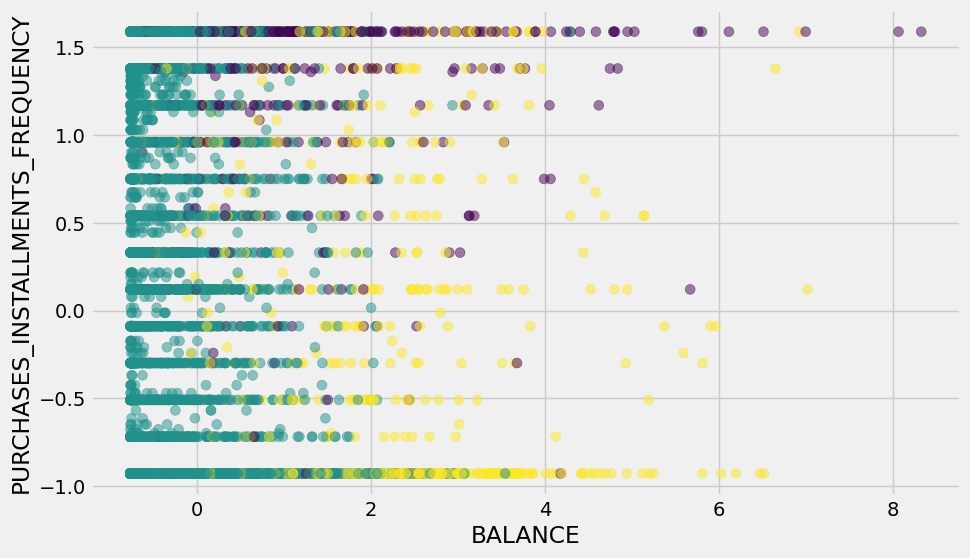

In [166]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_INSTALLMENTS_FREQUENCY'], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_INSTALLMENTS_FREQUENCY')
plt.show()

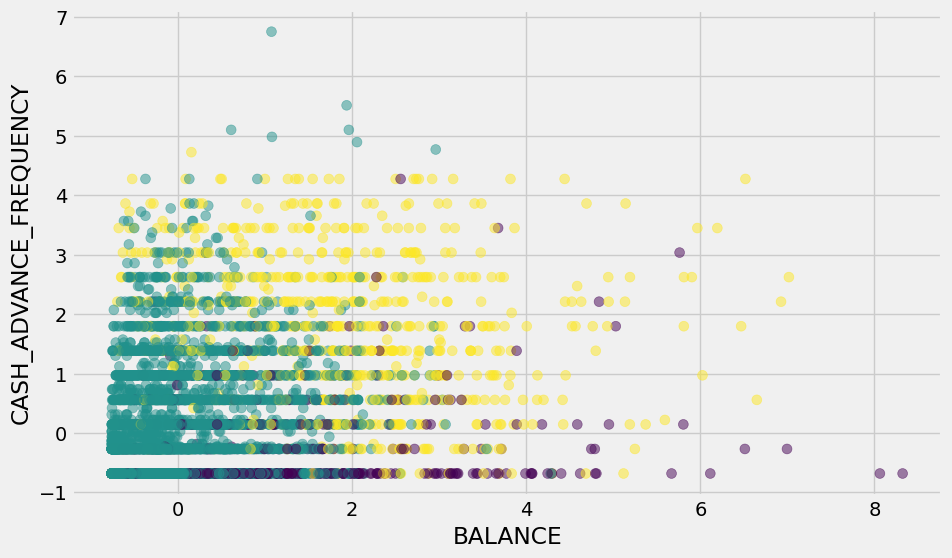

In [167]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE_FREQUENCY'], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE_FREQUENCY')
plt.show()

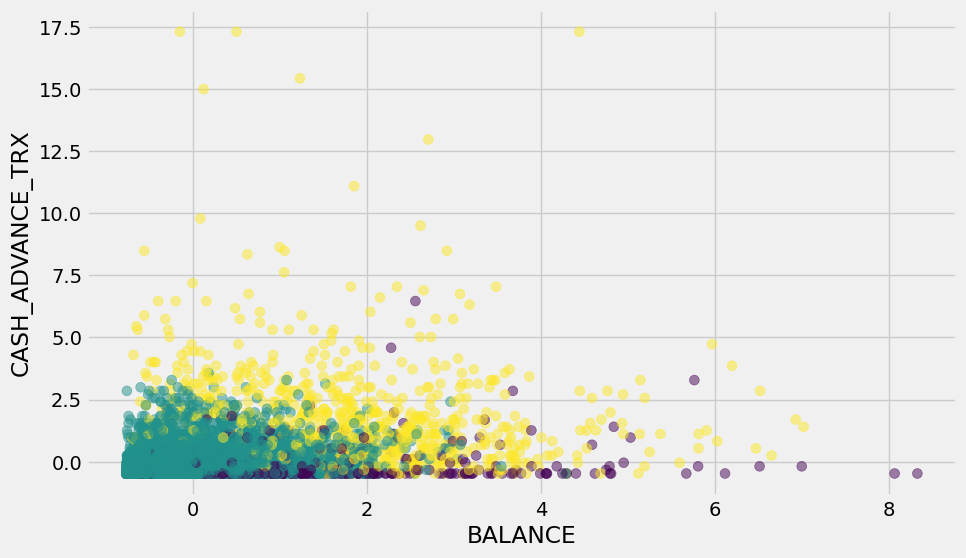

In [168]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CASH_ADVANCE_TRX'], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('CASH_ADVANCE_TRX')
plt.show()

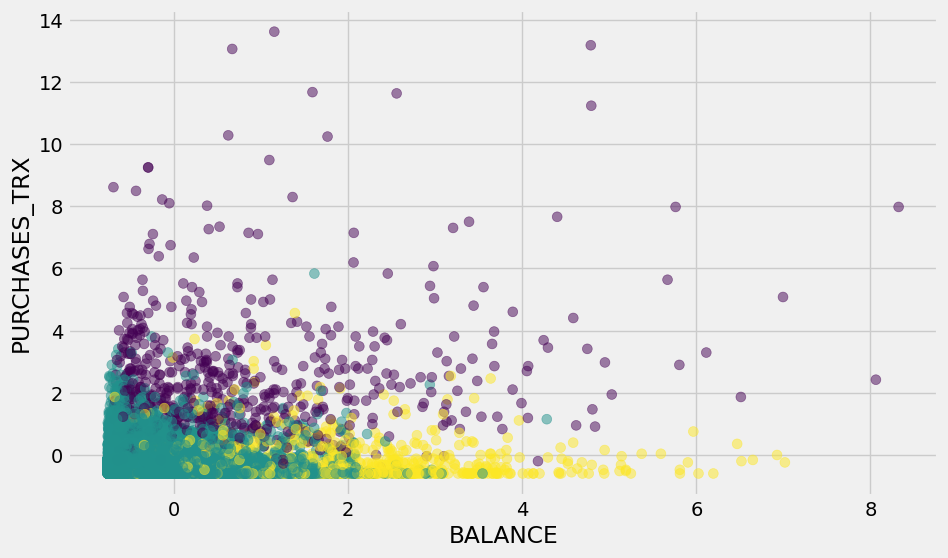

In [169]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PURCHASES_TRX'], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES_TRX')
plt.show()

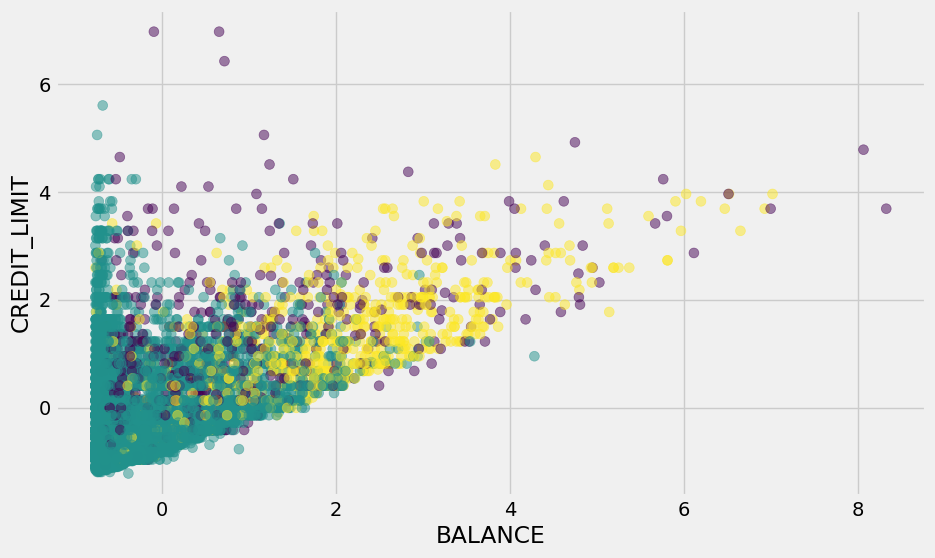

In [170]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['CREDIT_LIMIT'], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('CREDIT_LIMIT')
plt.show()

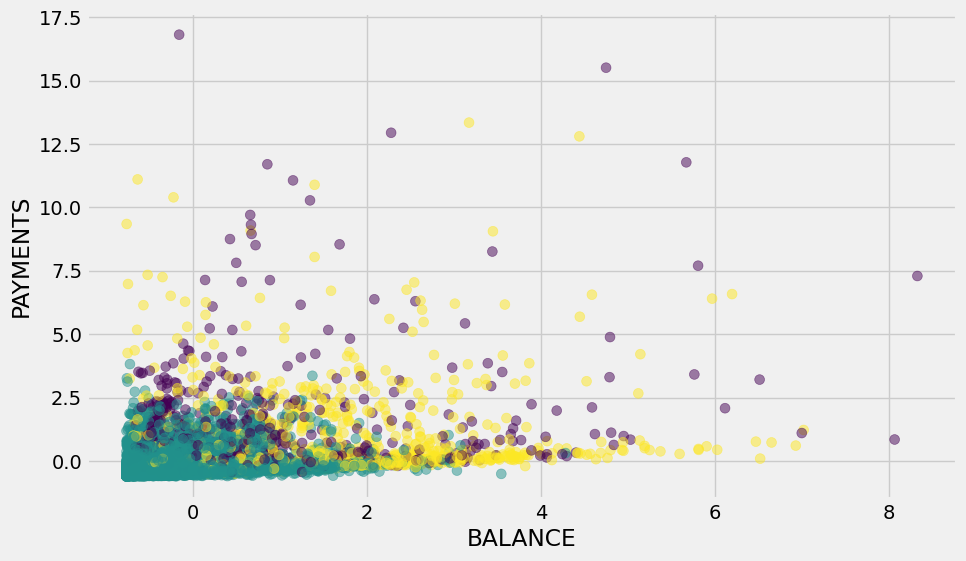

In [171]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PAYMENTS'], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PAYMENTS')
plt.show()

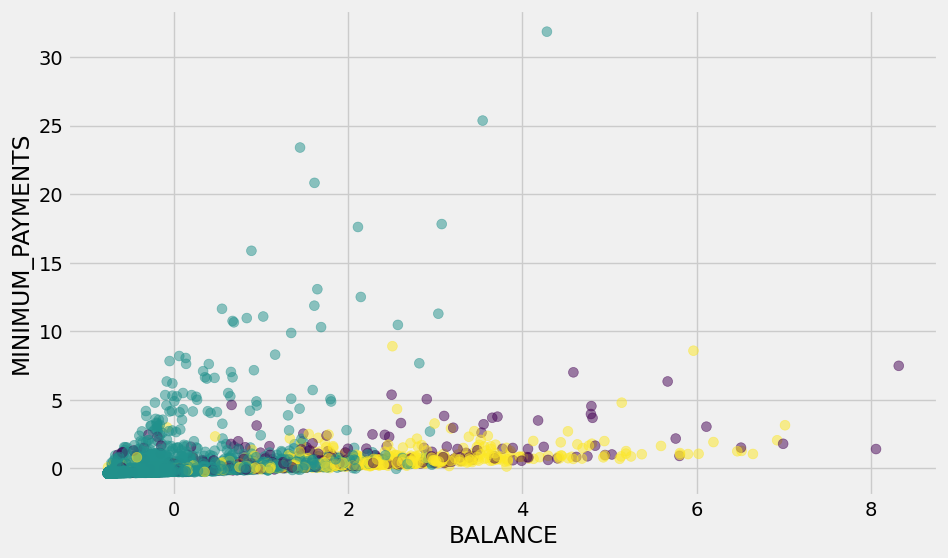

In [172]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['MINIMUM_PAYMENTS'], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('MINIMUM_PAYMENTS')
plt.show()

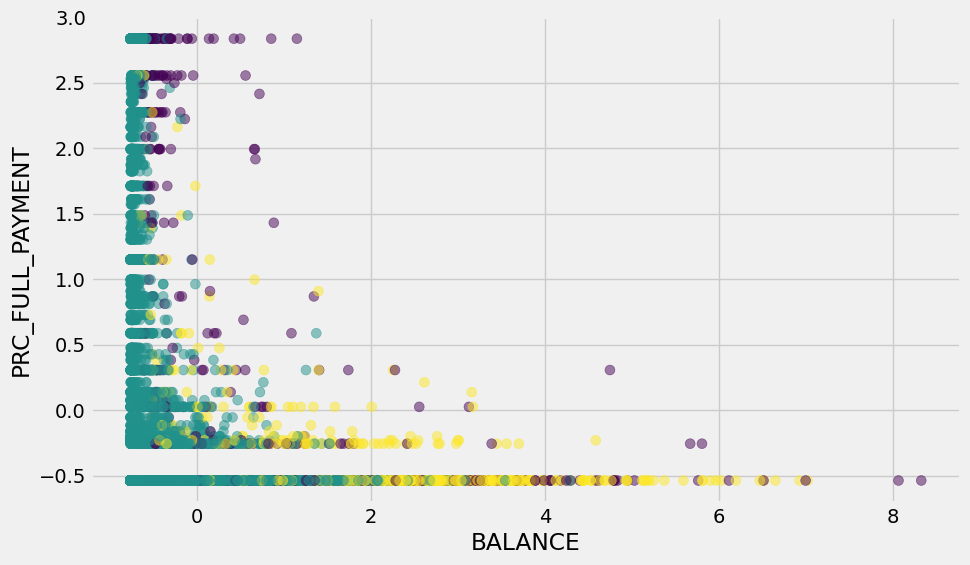

In [173]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['PRC_FULL_PAYMENT'], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('PRC_FULL_PAYMENT')
plt.show()

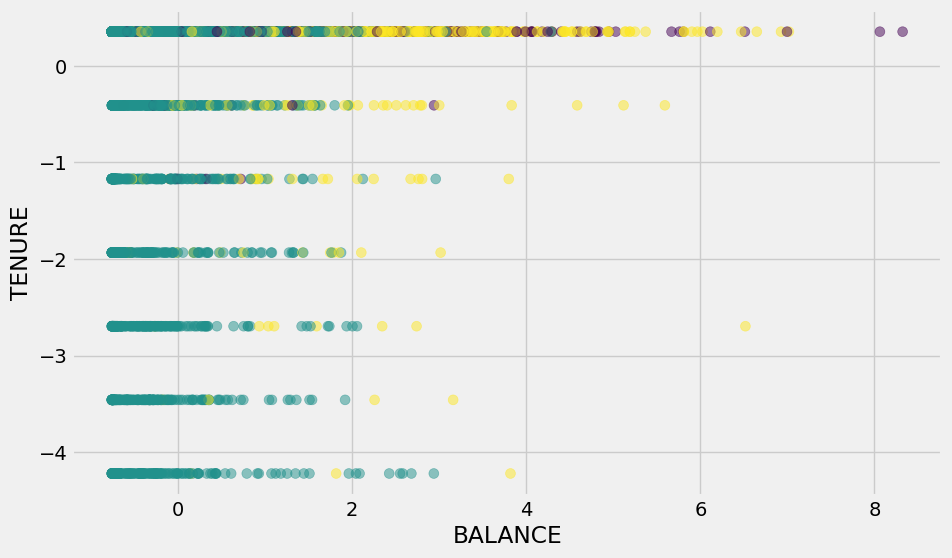

In [174]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['BALANCE'], df4['TENURE'], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
plt.xlabel('BALANCE')
plt.ylabel('TENURE')
plt.show()

In [175]:
# model_GaussianMixture = GaussianMixture()

# model_GaussianMixture.fit(df4)

In [176]:
# plt.figure(figsize=(10, 6))
# plt.scatter(df4['BALANCE'], df4['PURCHASES'], s=50, alpha=0.5)
# plt.xlabel('BALANCE')
# plt.ylabel('PURCHASES')
# plt.show()

## امتیاز دهی به مدل ها و انتخاب بهترین مدل برای دیتاست مورد نظر

## silhouette_score

In [177]:
score_kmean = metrics.silhouette_score(df4, model_kmean3.labels_)
score_AffinityPropagation = metrics.silhouette_score(df4, model_AffinityPropagation.labels_)
score_MeanShift = metrics.silhouette_score(df4, model_MeanShift.labels_)
# score_SpectralClustering = metrics.silhouette_score(df4, model_SpectralClustering.labels_)
score_AgglomerativeClustering = metrics.silhouette_score(df4, model_AgglomerativeClustering.labels_)
score_DBSCAN = metrics.silhouette_score(df4, model_DBSCAN.labels_)
score_OPTICS = metrics.silhouette_score(df4, model_OPTICS.labels_)
score_Birch = metrics.silhouette_score(df4, model_Birch.labels_)



In [178]:
print('score_kmean : ', score_kmean)
print('score_AffinityPropagation : ', score_AffinityPropagation)
print('score_MeanShift : ', score_MeanShift)
# print('score_SpectralClustering : ', score_SpectralClustering)
print('score_AgglomerativeClustering : ', score_AgglomerativeClustering)
print('score_DBSCAN : ', score_DBSCAN)
print('score_OPTICS : ', score_OPTICS)
print('score_Birch : ', score_Birch)

score_kmean :  0.21296561862451513
score_AffinityPropagation :  0.12265372968273125
score_MeanShift :  0.2724685846534361
score_AgglomerativeClustering :  0.18418454528547495
score_DBSCAN :  -0.465117752115066
score_OPTICS :  -0.5262540018722939
score_Birch :  0.3200176744539721


In [179]:
score = {
    # 'SpectralClustering':[0.8389125052466642],
    'Birch':[0.3200176744539721],
    'MeanShift':[0.2724685846534361],
    'Kmean':[0.21296561862451513],
    'AgglomerativeClustering':[0.18418454528547495],
    'ffinityPropagation':[0.12248050117874598],
    'DBSCAN':[-0.465117752115066],
    'OPTICS':[-0.5262540018722939],
}

In [180]:
df = pd.DataFrame.from_dict(score)


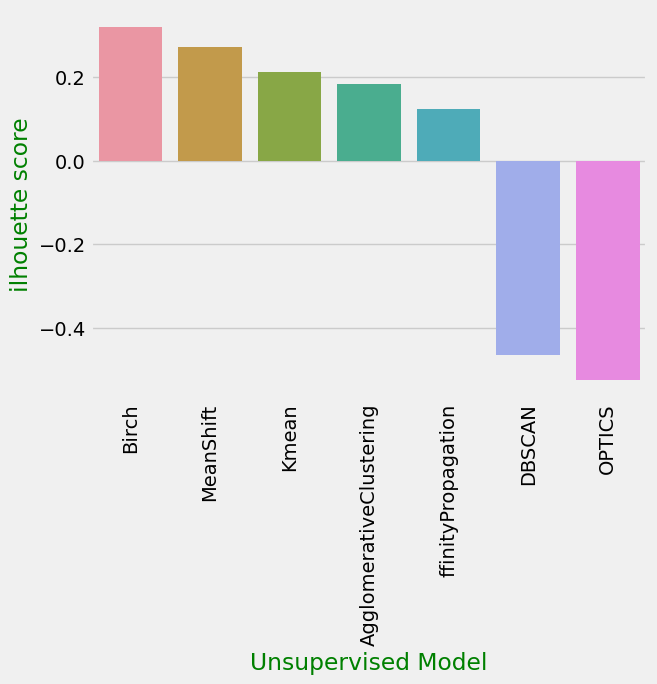

In [181]:
sns.barplot(data=df)
plt.xticks(rotation=90)
plt.xlabel('Unsupervised Model', color='g')
plt.ylabel('ilhouette score', color='g')
plt.show()

بهنرین مدل مدل بریچ بود و بترین مدل اوبتیکس همچنین مدل های اپتیکس و دی بی اسکن منفی و نشان دهنده این است که اصلا مدل خوبی برای این دیتاست نیستن

## calinski_harabasz_score

In [182]:
score_kmean = metrics.calinski_harabasz_score(df4, model_kmean3.labels_)
score_AffinityPropagation = metrics.calinski_harabasz_score(df4, model_AffinityPropagation.labels_)
score_MeanShift = metrics.calinski_harabasz_score(df4, model_MeanShift.labels_)
# score_SpectralClustering = metrics.calinski_harabasz_score(df4, model_SpectralClustering.labels_)
score_AgglomerativeClustering = metrics.calinski_harabasz_score(df4, model_AgglomerativeClustering.labels_)
score_DBSCAN = metrics.calinski_harabasz_score(df4, model_DBSCAN.labels_)
score_OPTICS = metrics.calinski_harabasz_score(df4, model_OPTICS.labels_)
score_Birch = metrics.calinski_harabasz_score(df4, model_Birch.labels_)

In [183]:
print('score_kmean : ', score_kmean)
print('score_AffinityPropagation : ', score_AffinityPropagation)
print('score_MeanShift : ', score_MeanShift)
# print('score_SpectralClustering : ', score_SpectralClustering)
print('score_AgglomerativeClustering : ', score_AgglomerativeClustering)
print('score_DBSCAN : ', score_DBSCAN)
print('score_OPTICS : ', score_OPTICS)
print('score_Birch : ', score_Birch)

score_kmean :  1206.9168592079336
score_AffinityPropagation :  229.08321742697547
score_MeanShift :  66.84466612651755
score_AgglomerativeClustering :  1407.277445469343
score_DBSCAN :  19.273588851295056
score_OPTICS :  6.764303191778411
score_Birch :  1213.161356914386


In [184]:
score = {
    'AgglomerativeClustering':[1407.277445469343],
    'Birch':[1213.161356914386],
    'Kmean':[1206.9168592079336],
    'ffinityPropagation':[228.96095760404071],
    #'SpectralClustering':[0.8389125052466642],
    'MeanShift':[66.84466612651755],
    'DBSCAN':[19.273588851295056],
    'OPTICS':[6.764303191778411],
}

In [185]:
df2 = pd.DataFrame.from_dict(score)


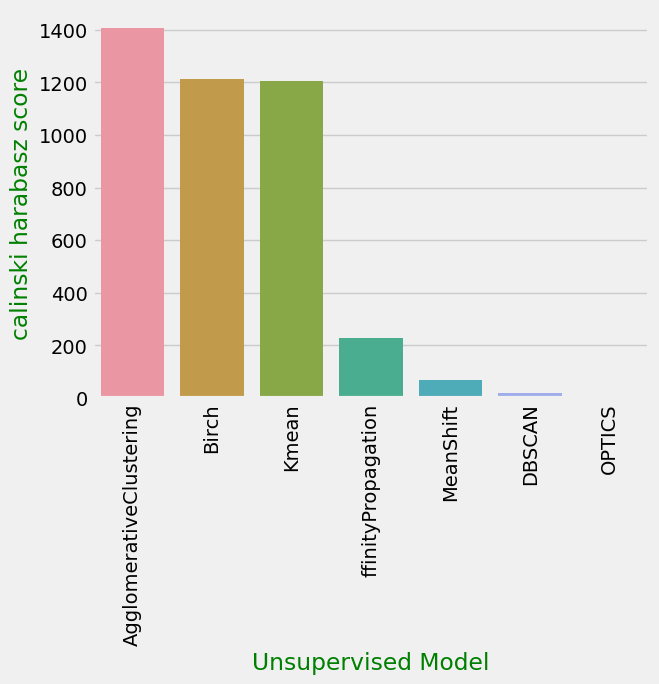

In [186]:
sns.barplot(data=df2)
plt.xticks(rotation=90)
plt.xlabel('Unsupervised Model', color='g')
plt.ylabel('calinski harabasz score', color='g')
plt.show()

در این مدل بهترین مدل اگلومریتیو است بدترین مدل اوپتیکس که کته جالب این اسن باز بریج در جایگاه خوبی قرار دارد و مدل ابتیکس و دی بی اسکن در لول اخر قرار دارند

## davies_bouldin_score

In [187]:
score_kmean = metrics.davies_bouldin_score(df4, model_kmean3.labels_)
score_AffinityPropagation = metrics.davies_bouldin_score(df4, model_AffinityPropagation.labels_)
score_MeanShift = metrics.davies_bouldin_score(df4, model_MeanShift.labels_)
# score_SpectralClustering = metrics.davies_bouldin_score(df4, model_SpectralClustering.labels_)
score_AgglomerativeClustering = metrics.davies_bouldin_score(df4, model_AgglomerativeClustering.labels_)
score_DBSCAN = metrics.davies_bouldin_score(df4, model_DBSCAN.labels_)
score_OPTICS = metrics.davies_bouldin_score(df4, model_OPTICS.labels_)
score_Birch = metrics.davies_bouldin_score(df4, model_Birch.labels_)

In [188]:
print('score_kmean : ', score_kmean)
print('score_AffinityPropagation : ', score_AffinityPropagation)
print('score_MeanShift : ', score_MeanShift)
# print('score_SpectralClustering : ', score_SpectralClustering)
print('score_AgglomerativeClustering : ', score_AgglomerativeClustering)
print('score_DBSCAN : ', score_DBSCAN)
print('score_OPTICS : ', score_OPTICS)
print('score_Birch : ', score_Birch)

score_kmean :  1.3672383282132041
score_AffinityPropagation :  1.2914683666585884
score_MeanShift :  0.8773092680788809
score_AgglomerativeClustering :  2.0150805564054273
score_DBSCAN :  1.3843330089586239
score_OPTICS :  1.3025710810594093
score_Birch :  1.519668406786548


In [189]:
score = {
    'AgglomerativeClustering':[2.0150805564054273],
    'Birch':[1.519668406786548],
    'DBSCAN':[1.3843330089586239],
    'Kmean':[1.3672383282132041],
    'OPTICS':[1.3025710810594093],
    'ffinityPropagation':[1.2917627696179437],
    #'SpectralClustering':[0.8389125052466642],
    'MeanShift':[0.8773092680788809],
}

In [190]:
df2 = pd.DataFrame.from_dict(score)


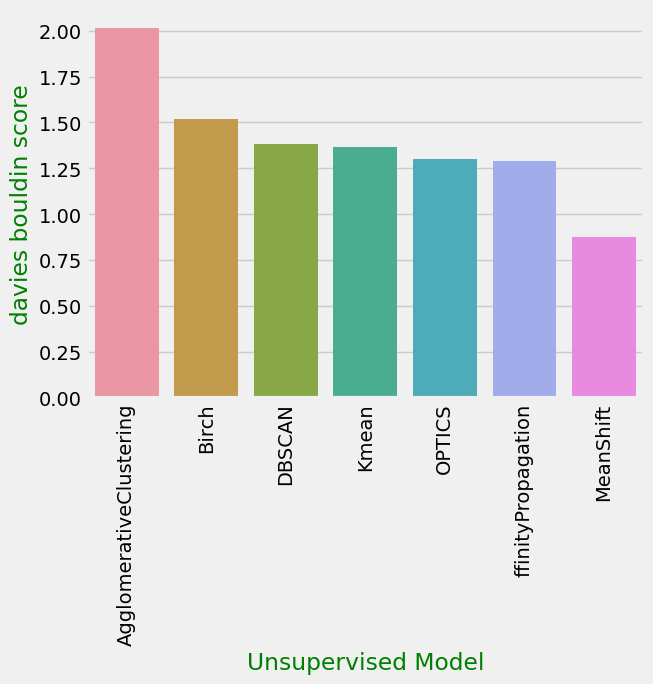

In [191]:
sns.barplot(data=df2)
plt.xticks(rotation=90)
plt.xlabel('Unsupervised Model', color='g')
plt.ylabel('davies bouldin score', color='g')
plt.show()

در این امتیاز دهی باز اگلومریتیو جایگاه اول مین شیفت جایگاه اخر را داراست